# 1D Spectra to Transit Features

In [198]:
# initialise
import sys
sys.path.append('scripts/')
import utils
import numpy as np
import glob
import pandas as pd
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.stats import sigma_clip
from astropy import units as u
from scipy.stats import median_abs_deviation
# import run_eureka
from astropy.visualization import quantity_support
quantity_support();

import chromatic
print("chromatic version = " + str(chromatic.version()))
from chromatic import *

chromatic version = 0.0.11


Find x1dint files:

In [135]:
# import data files (for now just x1dints)
datafolder = "NIRCam/Stage_2_Output/Long_Wavelength_Spectroscopy/"
x1dint_files = sorted(glob.glob(datafolder + "*x1dints.fits"))
x1dint_files

['NIRCam/Stage_2_Output/Long_Wavelength_Spectroscopy/jw01366002001_01101_00002-seg001_nrca5_x1dints.fits',
 'NIRCam/Stage_2_Output/Long_Wavelength_Spectroscopy/jw01366002001_01101_00002-seg002_nrca5_x1dints.fits',
 'NIRCam/Stage_2_Output/Long_Wavelength_Spectroscopy/jw01366002001_01101_00002-seg003_nrca5_x1dints.fits',
 'NIRCam/Stage_2_Output/Long_Wavelength_Spectroscopy/jw01366002001_01101_00002-seg004_nrca5_x1dints.fits']

Define pre-set wavelength bins

In [136]:
binstarts = np.array([2.3496756553649902,2.391845226287842,2.434011697769165,2.4761807918548584,2.5183470249176025,2.560516119003296,2.6026854515075684,2.6448519229888916,2.687021493911743,2.729187250137329,2.7713570594787598,2.8135228157043457,2.8556926250457764,2.8978588581085205,2.9400289058685303,2.982194185256958,3.024364471435547,3.0665295124053955,3.1087024211883545,3.150867223739624,3.193037748336792,3.2352027893066406,3.2773733139038086,3.3195385932922363,3.3617093563079834,3.403873920440674,3.446044683456421,3.4882092475891113,3.5303800106048584,3.572544574737549,3.614715814590454,3.6568868160247803,3.6990511417388916,3.741222381591797,3.783386468887329,3.8255581855773926,3.867722272872925,3.9098939895629883,3.9520578384399414,3.994229316711426,4.036393165588379,4.078566074371338,4.120730400085449,4.162901878356934,4.205066680908203,4.247236728668213,4.289401531219482,4.331573009490967])*u.Unit("um")
binends = np.array([2.391845226287842,2.434011697769165,2.4761807918548584,2.5183470249176025,2.560516119003296,2.6026854515075684,2.6448519229888916,2.687021493911743,2.729187250137329,2.7713570594787598,2.8135228157043457,2.8556926250457764,2.8978588581085205,2.9400289058685303,2.982194185256958,3.024364471435547,3.0665295124053955,3.1087024211883545,3.150867223739624,3.193037748336792,3.2352027893066406,3.2773733139038086,3.3195385932922363,3.3617093563079834,3.403873920440674,3.446044683456421,3.4882092475891113,3.5303800106048584,3.572544574737549,3.614715814590454,3.6568868160247803,3.6990511417388916,3.741222381591797,3.783386468887329,3.8255581855773926,3.867722272872925,3.9098939895629883,3.9520578384399414,3.994229316711426,4.036393165588379,4.078566074371338,4.120730400085449,4.162901878356934,4.205066680908203,4.247236728668213,4.289401531219482,4.331573009490967,4.3737382888793945])*u.Unit("um")
bincentres = (binstarts+binends)/2#[(bs+be)/2 for bs,be in zip(binstarts,binends)]
halfbinwidths = (binends-binstarts)/2#[(be-bs)/2 for bs,be in zip(binstarts,binends)]

# Import *x1dint.fits files with chromatic

### Before runninng add MJy/sr and (MJy/sr)^2 units to chromatic

In [137]:
(u.Jy / (u.sr)).find_equivalent_units()
MJy_sr = u.def_unit('MJy/sr', u.MJy/u.sr)
MJy_sr_sq = u.def_unit('(MJy/sr)^2', (u.MJy/u.sr)**2)
u.add_enabled_units([MJy_sr,MJy_sr_sq])

Import all x1dint files in directory into rainbow objects

In [138]:
combinedrainbow = Rainbow(datafolder + "*x1dints.fits")

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:04<00:00,  1.15s/it]


Plot 2D Lightcurves

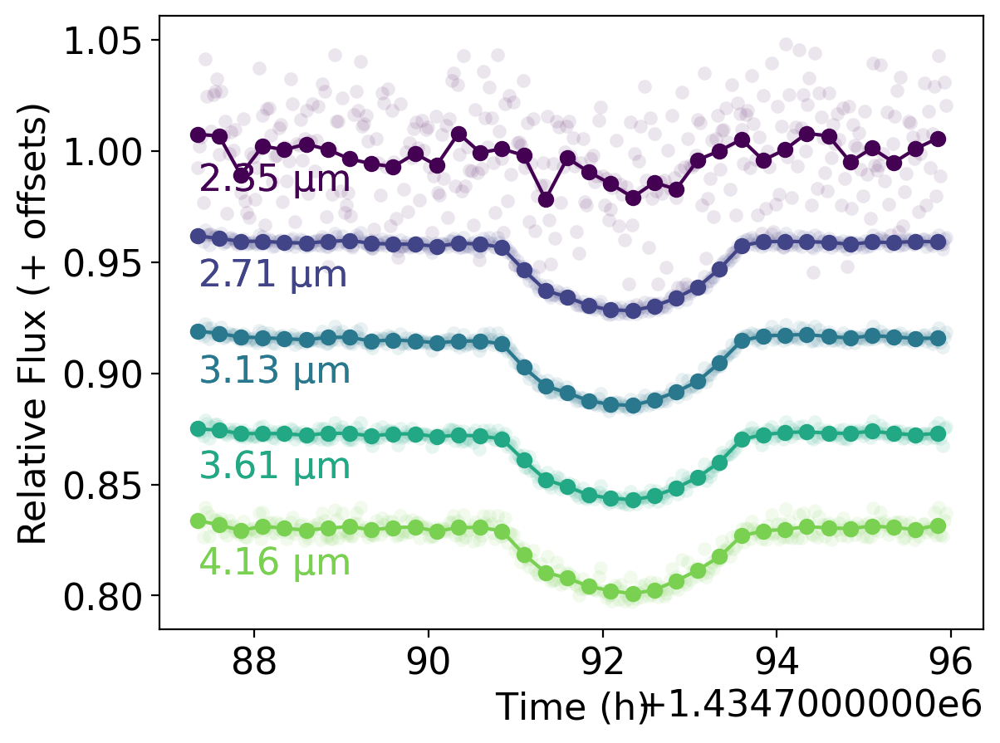

In [139]:
normcr = combinedrainbow.normalize()
ax = normcr.bin(R=7).plot(plotkw=dict(alpha=0.1, markeredgecolor='none', linewidth=0))
normcr.bin(R=7, dt=15*u.minute).plot(ax=ax)

## Visualise Transit in 3D

<AxesSubplot:xlabel='Time ($\\mathrm{d}$)', ylabel='Wavelength ($\\mathrm{\\mu m}$)'>

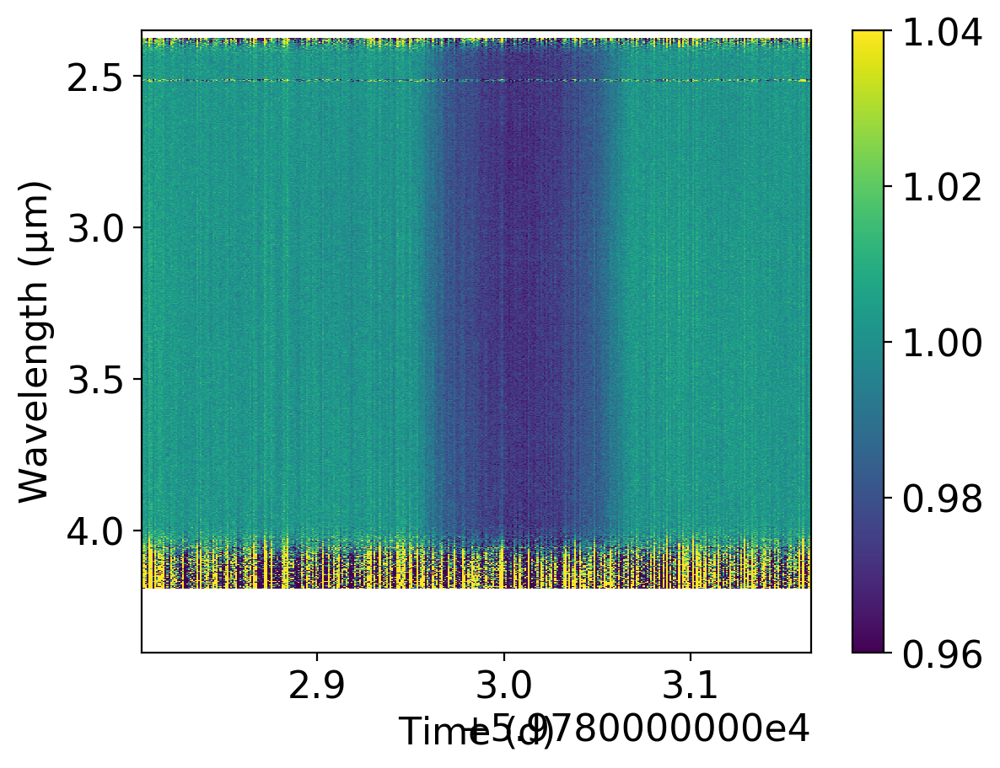

In [140]:
normcr.imshow(vmin=0.96,vmax=1.04)

Plot errors:

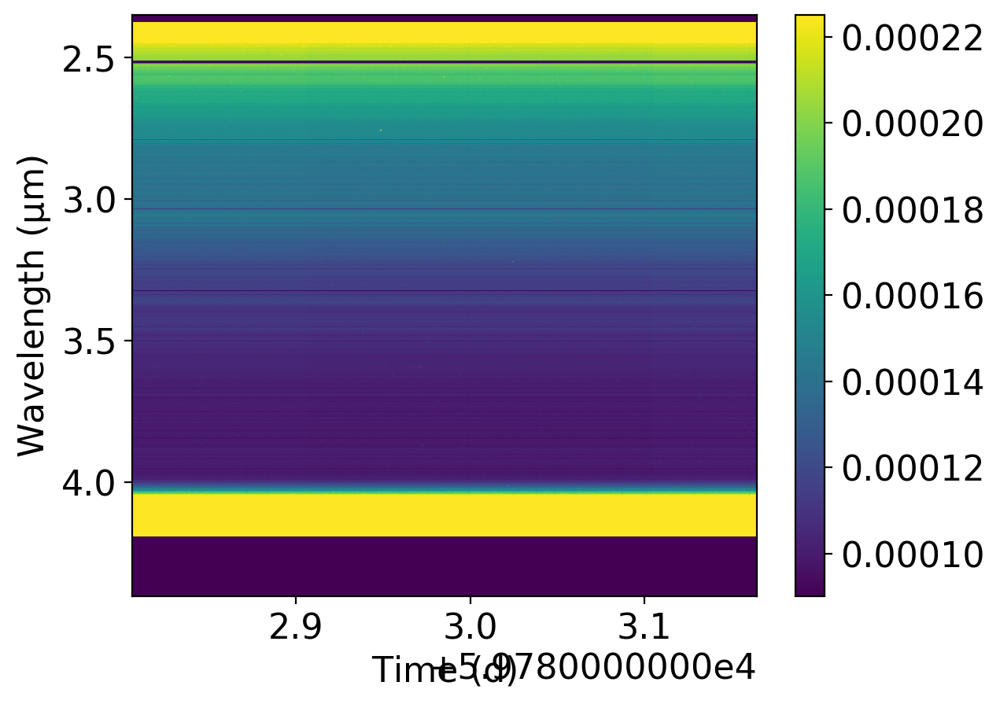

In [141]:
normcr.imshow(quantity='uncertainty',vmin=0.00009,vmax=0.000225);

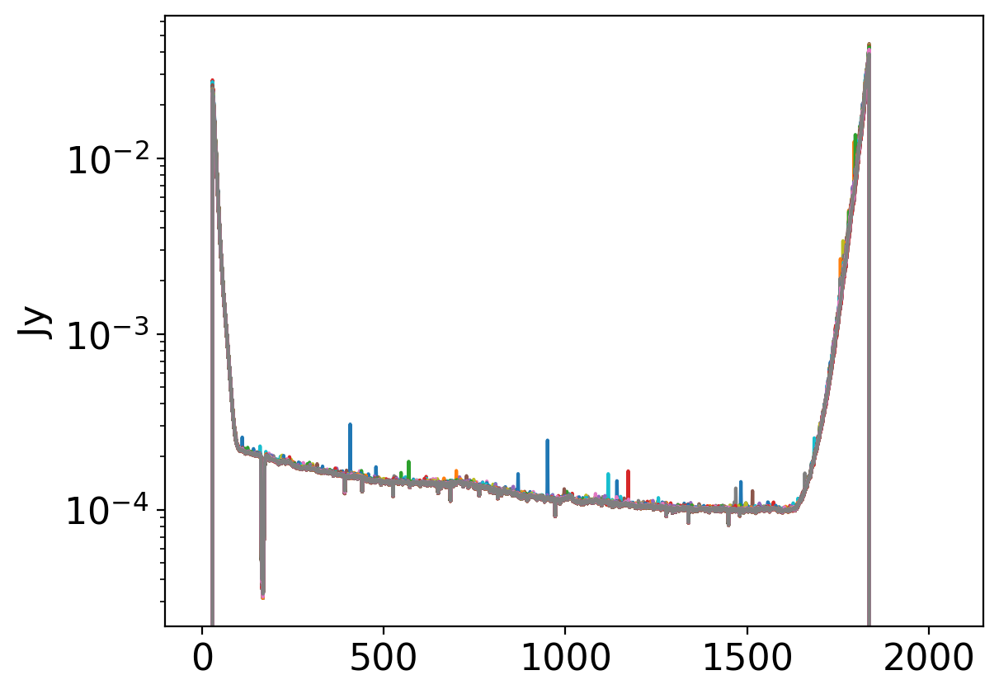

In [222]:
plt.plot(combinedrainbow.fluxlike['uncertainty']);
plt.yscale('log')

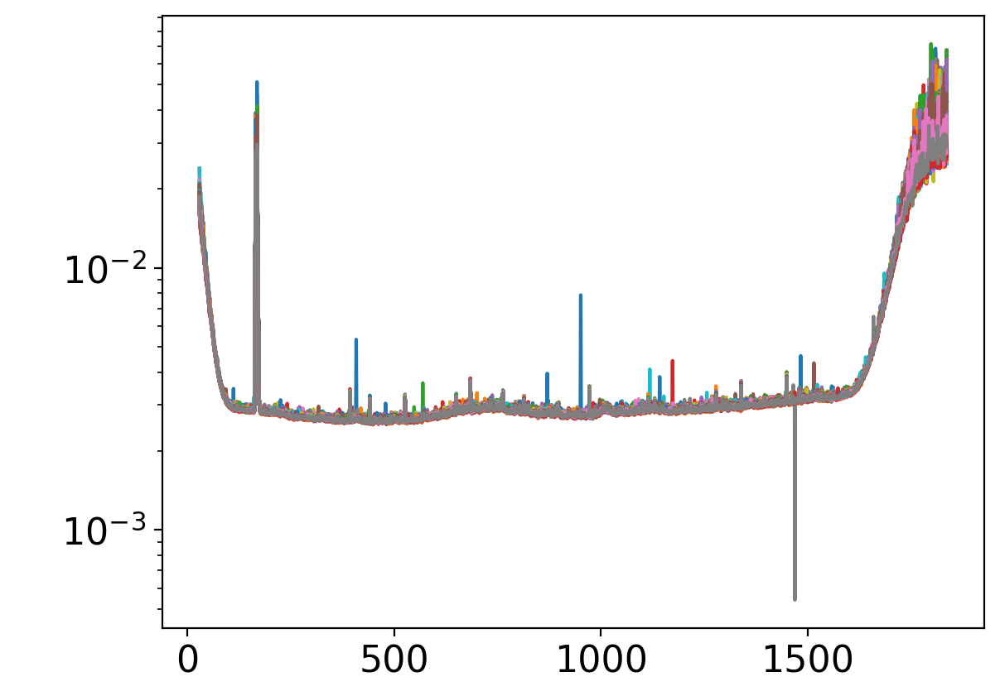

In [225]:
plt.plot(combinedrainbow.fluxlike['uncertainty']/combinedrainbow.fluxlike['flux']);
plt.yscale('log')

Bin rainbow

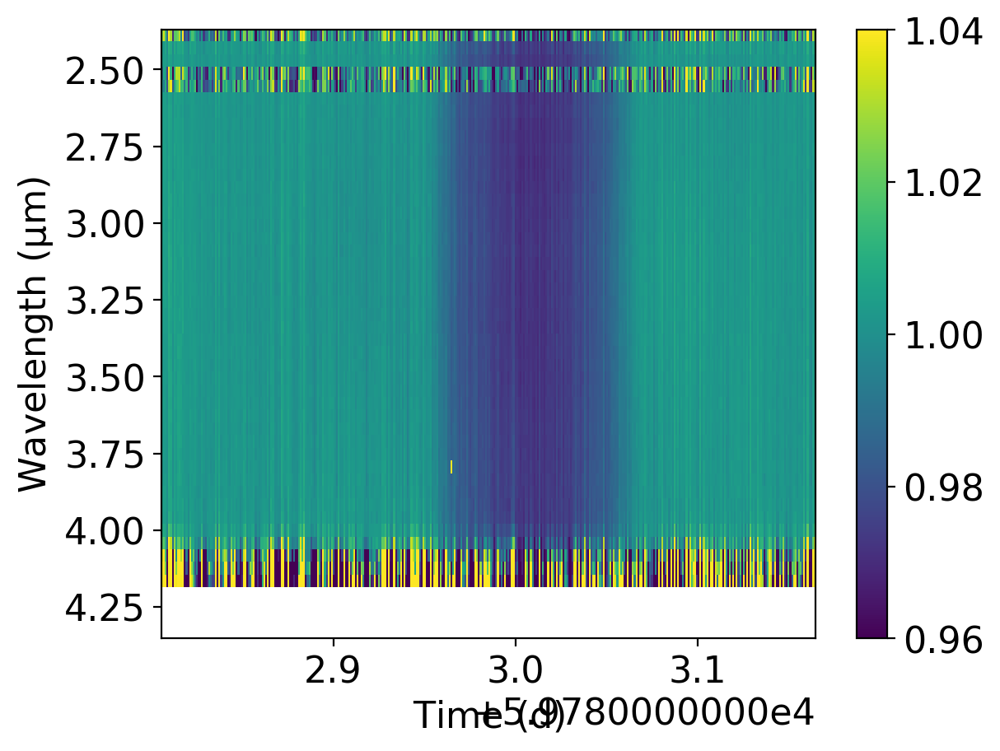

In [143]:
b = normcr.bin(wavelength=bincentres)
b.imshow(vmin=0.96,vmax=1.04);

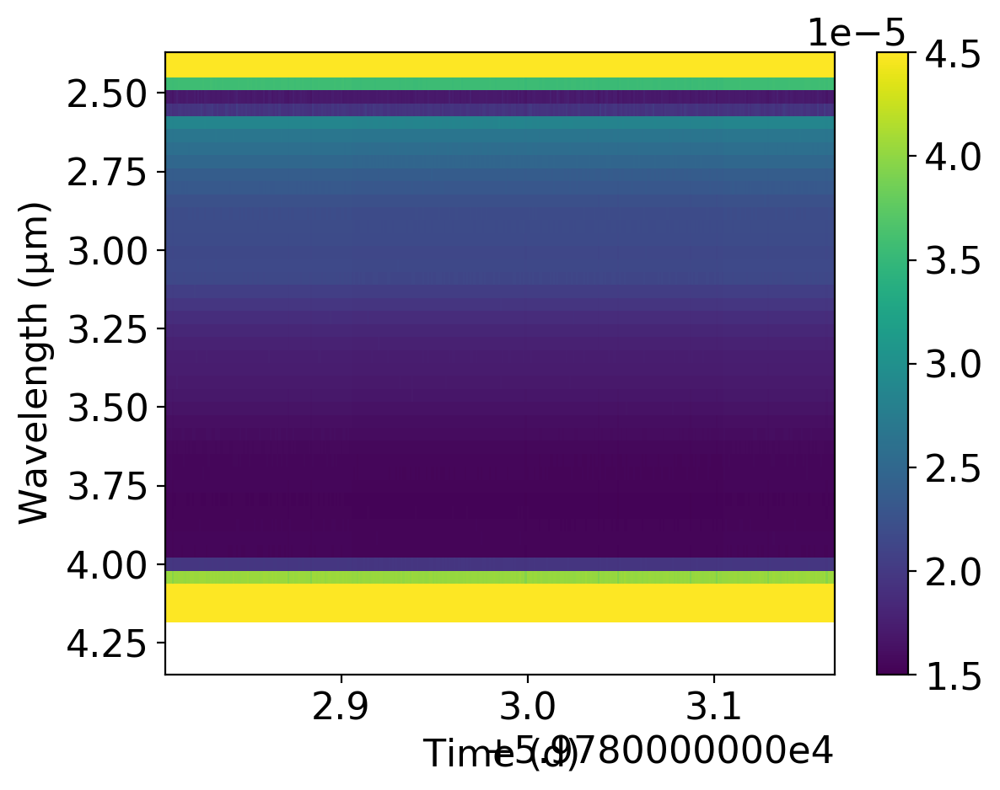

In [159]:
b.imshow(quantity='uncertainty',vmin=0.000015,vmax=0.000045);

Compare unbinned and binned errors:

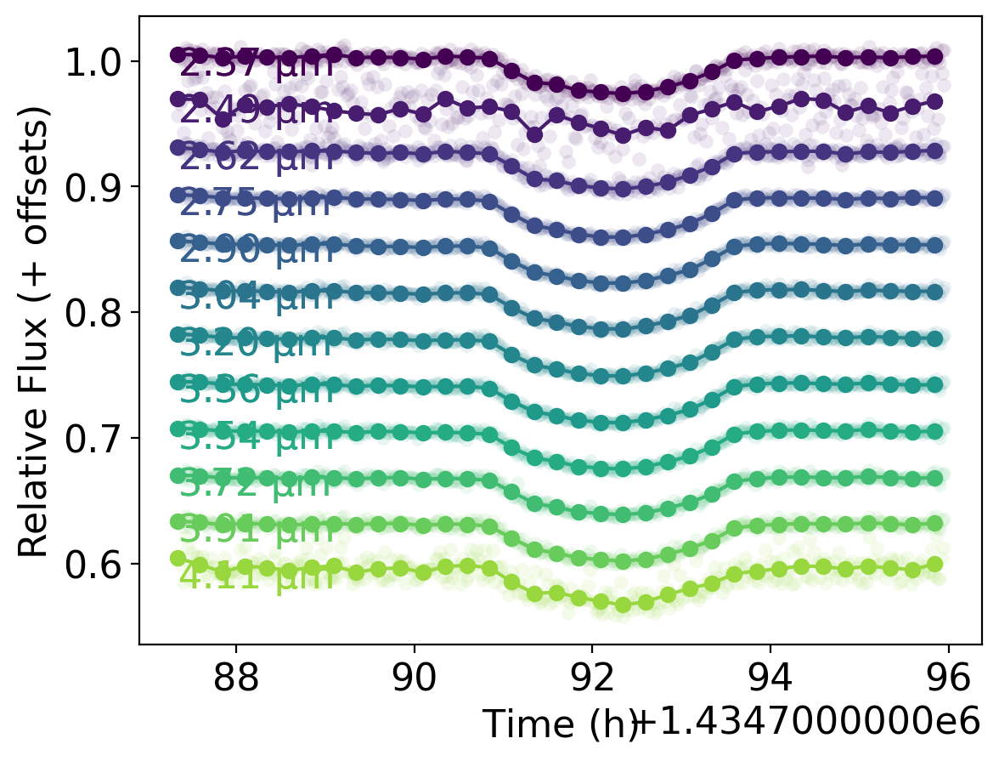

In [145]:
b.bin(R=20).plot(plotkw=dict(alpha=0.1, markeredgecolor='none', linewidth=0))
b.bin(R=20, dt=15*u.minute).plot()

On average, 42.666666666666664 wavelengths in each bin.


(0.0, 0.00025)

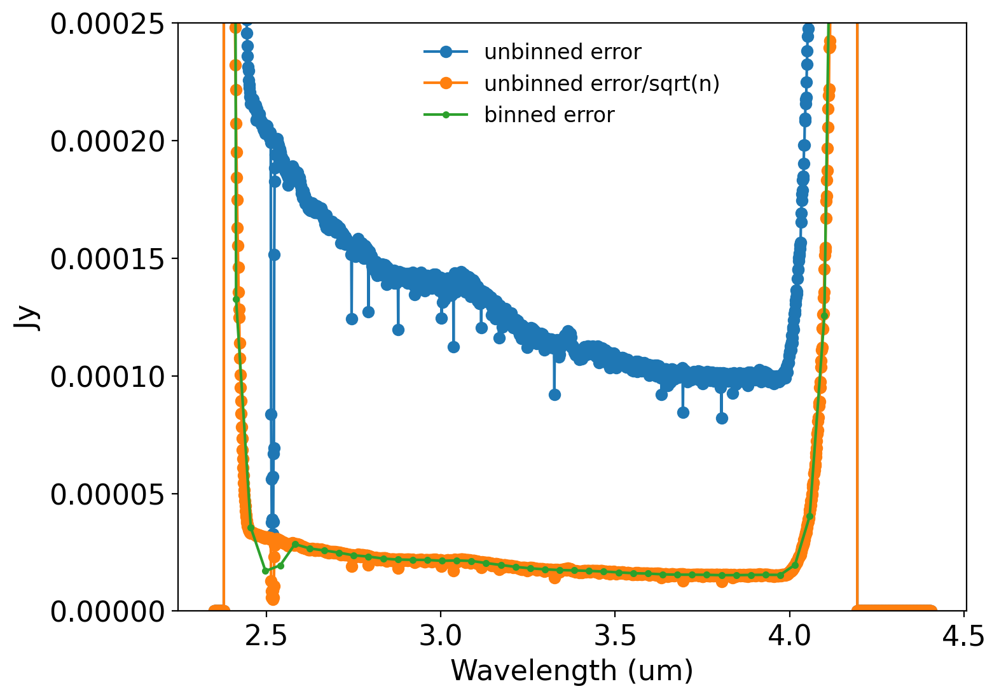

In [146]:
num_in_bin = len(normcr.flux)/len(b.flux)
print("On average, " +str(num_in_bin)+ " wavelengths in each bin.")
plt.figure(figsize=(8,6))
plt.plot(normcr.wavelength, normcr.get_typical_uncertainty(),  marker='o', label='unbinned error');
plt.plot(normcr.wavelength, normcr.get_typical_uncertainty()/np.sqrt(num_in_bin),  marker='o', label='unbinned error/sqrt(n)');
plt.plot(b.wavelength, b.get_typical_uncertainty(), marker='.', label='binned error')
plt.legend(fontsize=12, frameon=False)
plt.xlabel(f'Wavelength ({normcr.wavelength.unit})')
plt.ylim(0,0.00025)


### Extract 1 and 2D vector from rainbow objects

In [147]:
def extract_vectors(r):
    # r: rainbow object
    rflux = r.fluxlike['flux']         # flux (MJy/sr)        : [n_wavelengths x n_integrations]
    try:
        rfluxe = r.fluxlike['uncertainty']  # flux error (MJy/sr)  : [n_wavelengths x n_integrations]
    except:
        rfluxe = [np.nan]*len(rflux)
    rtime = r.timelike['time']         # time (BJD_TDB, days) : [n_integrations]
    rwavel = r.wavelike['wavelength']  # wavelength (microns) : [n_wavelengths]
    return rflux,rfluxe,rtime,rwavel

In [148]:
rflux,rfluxe,rtime,rwavel = extract_vectors(combinedrainbow)
rbflux,rbfluxe,rbtime,rbwavel = extract_vectors(b)

# Transit Fitting

In [149]:
import warnings

import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pymc3 as pm
import theano
import theano.tensor as tt
# import pymc3 as pm
import pymc3_ext as pmx
import exoplanet as xo
import corner
# plot the samples from the gp posterior with samples and shading
from pymc3.gp.util import plot_gp_dist

warnings.simplefilter(action="ignore", category=FutureWarning)
%config InlineBackend.figure_format = 'retina'
az.style.use("arviz-darkgrid")
print(f"Running on PyMC3 v{pm.__version__}")
print(f"Running on ArviZ v{az.__version__}")
# print(f"Running on Theano v{tt.__version__}")
xo.utils.docs_setup()
print(f"exoplanet.__version__ = '{xo.__version__}'")

Running on PyMC3 v3.11.4
Running on ArviZ v0.11.2
exoplanet.__version__ = '0.5.2'


In [150]:
def fit_transit(x,y,yerr,init_r,init_t0,init_period,init_b,init_mean,init_u,fixed_var=[]):

    with pm.Model() as model:

        # The baseline flux
        if 'mean' in fixed_var:
            mean = pm.Normal("mean", mu=init_mean, sigma=0.1,observed=init_mean)
        else:
            mean = pm.Normal("mean", mu=init_mean, sigma=0.1)

        # The time of a reference transit for each planet
        if 't0' in fixed_var:
            t0 = pm.Normal("t0", mu=init_t0, sigma=1.0,observed=init_t0)
        else:
            t0 = pm.Normal("t0", mu=init_t0, sigma=1.0)

        # The log period; also tracking the period itself
#         constrain the period as we only have 1 transit
        if 'period' in fixed_var:
            logP = pm.Normal("logP", mu=np.log(init_period), sigma=0.000009, observed=np.log(init_period))
        else:
            logP = pm.Normal("logP", mu=np.log(init_period), sigma=0.000009)
        period = pm.Deterministic("period", pm.math.exp(logP))

        # The Kipping (2013) parameterization for quadratic limb darkening paramters
        if 'u' in fixed_var:
            u_ld = xo.distributions.QuadLimbDark("u", testval=np.array(init_u), observed=np.array(init_u))
        else:
            u_ld = xo.distributions.QuadLimbDark("u", testval=np.array(init_u))

#         r = pm.Uniform(
#             "r", lower=init_r-0.00138, upper=init_r+0.001, testval=np.array(init_r)
#         )
        if 'r' in fixed_var:
            r = pm.Uniform("r", lower=0.01, upper=0.5, testval=np.array(init_r), observed=np.array(init_r))
        else:
            r = pm.Uniform("r", lower=0.01, upper=0.5, testval=np.array(init_r))
            
        if 'b' in fixed_var:
            b = xo.distributions.ImpactParameter("b", ror=r, testval=np.array(init_b), observed=np.array(init_b))
        else:
            b = xo.distributions.ImpactParameter("b", ror=r, testval=np.array(init_b))

        # Set up a Keplerian orbit for the planets
        orbit = xo.orbits.KeplerianOrbit(period=period, t0=t0, b=b)

        # Compute the model light curve using starry
        light_curves = xo.LimbDarkLightCurve(u_ld[0], u_ld[1]).get_light_curve(
            orbit=orbit, r=r, t=list(x)
        )
        light_curve = pm.math.sum(light_curves, axis=-1) + mean

        # Here we track the value of the model light curve for plotting
        # purposes
        pm.Deterministic("light_curves", light_curves)

        # ******************************************************************* #
        # On the folowing lines, we simulate the dataset that we will fit     #
        #                                                                     #
        # NOTE: if you are fitting real data, you shouldn't include this line #
        #       because you already have data!                                #
        # ******************************************************************* #
    #     y = pmx.eval_in_model(light_curve)
    #     y += yerr * np.random.randn(len(y))
        # ******************************************************************* #
        # End of fake data creation; you want to include the following lines  #
        # ******************************************************************* #

        # The likelihood function assuming known Gaussian uncertainty
        pm.Normal("obs", mu=light_curve, sd=yerr, observed=y)

        # Fit for the maximum a posteriori parameters given the simuated
        # dataset
        map_soln = pmx.optimize(start=model.test_point)
        
        return map_soln, model, [period,r,t0,b,u_ld,mean]

In [151]:
def plot_fit(x,y,yerr,map_soln):
    plt.plot(x, y, ".k", ms=4, label="data")
    plt.plot(x, map_soln["light_curves"], lw=1)
    
    # plot 50 chains from MCMC:
#     for i in np.random.randint(len(trace) * trace.nchains, size=50):
#         # Set up a Keplerian orbit for the planets
#         orbit = xo.orbits.KeplerianOrbit(period=trace['period'][i], t0=trace['t0'][i], b=trace['b'][i])
#         # Compute the model light curve using starry
#         light_curves = xo.LimbDarkLightCurve(trace['u[0]'][i], trace['u[1]']).get_light_curve(
#             orbit=orbit, r=trace['r'], t=list(x)
#         )
#         light_curve = pm.math.sum(light_curves, axis=-1) + trace['mean'][i]
#         plt.plot(x, light_curve, color="C1", lw=1, alpha=0.3)
        
    plt.errorbar(x,y,yerr,c='k',alpha=0.2)
    plt.xlim(x.min(), x.max())
    plt.ylabel("relative flux")
    plt.xlabel("time [days]")
    plt.legend(fontsize=10)
    _ = plt.title("map model")
    plt.show()
    plt.close()

In [346]:
def sample(map_soln, model):
    np.random.seed(42)
    with model:
        trace = pmx.sample(
            tune=6000,
            draws=8000,
            start=map_soln,
            cores=8,
            chains=4,
            target_accept=0.9,
        )
        return trace

In [153]:
def summarise(model,trace,fixed_var=[]):
    all_varnames = ["period", "r","t0","b","u","mean"]
    nonfixed_varnames = [a for a in all_varnames if a not in fixed_var]
    
    with model:
        summary = az.summary(
            trace, var_names=nonfixed_varnames, round_to=7, fmt='wide'
        )
    return summary

In [154]:
def cornerplot(model,trace,period,r,t0,b,u,mean,fixed_var=[]):
    all_varnames = ["period", "r","t0","b","u","mean"]
    nonfixed_varnames = [a for a in all_varnames if a not in fixed_var]
    all_vars = [period, r,t0,b,u,mean]
    to_del = []
    if 'period' in fixed_var:
        to_del.append(0)
    if 'r' in fixed_var:
        to_del.append(1)
    if 't0' in fixed_var:
        to_del.append(2)
    if 'b' in fixed_var:
        to_del.append(3)
    if 'u' in fixed_var:
        to_del.append(4)
    if 'mean' in fixed_var:
        to_del.append(5)
    print(np.delete(all_vars,to_del))
    nonfixed_vars = list(np.delete(all_vars,to_del))
    
    
    truth = dict(
        zip(
            nonfixed_varnames,
            pmx.eval_in_model(nonfixed_vars, model.test_point, model=model),
        )
    )
    _ = corner.corner(
        trace,
        var_names=nonfixed_varnames,
        truths=truth,
    )

Create Weighted LC for MCMC fixed params

## Weighted average lightcurve 

= $\frac{\sum_{\lambda}{F_{\lambda}(t)/\sigma^{2}}}{\sum_{\lambda}{1/\sigma^{2}}}$

In [315]:
def running_box(x,y,boxsize,operation):
    def clipped_std(x):
        return np.ma.std(sigma_clip(x,sigma=3))

    if operation == "std":
        op = np.nanstd
    elif operation == 'median':
        op = np.nanmedian
    elif operation == 'mean':
        op = np.nanmean
    elif operation == "clipped_std":
        op = clipped_std
    else:
        print("No running function selected - choose std, median or mean.")
        return np.nan

    l = len(x)
    boxsize = boxsize / 2
    dy = np.zeros((np.size(x)))

    for i in range(0, l):
        s = x[i]
        box_s = utils.find_nearest(x, (s - boxsize).to_value())
        box_e = utils.find_nearest(x, (s + boxsize).to_value())

        # calculate [OPERATION] for the current window
        try:
            y_ext = y[box_s:box_e + 1]
            d = op(y_ext)
            if not np.isnan(d):
                dy[i] = d

        except Exception as e:
            print(e)

    dy = np.ma.masked_where(dy == 0, dy)
    # dy = np.ma.masked_where(np.isnan(dy), dy)
    dy = np.ma.masked_invalid(dy)
    # dy = dy.filled(np.nanmedian(dy))
    # print("RUNNING " + operation)
    # print("FILL VALUE = " + str(np.nanmedian(dy)))
    return dy

In [332]:
def weighted_avg_lc(time,flux,fluxe,wavelength,wavelength_range):
#     mask bad wavelength
#     fluxe = np.divide(fluxe,flux)
#     flux = flux[~((wavelength>2.51*u.Unit("um"))&(wavelength<2.525*u.Unit("um")))]
#     fluxe = fluxe[~((wavelength>2.51*u.Unit("um"))&(wavelength<2.525*u.Unit("um")))]
#     wavelength = wavelength[~((wavelength>2.51*u.Unit("um"))&(wavelength<2.525*u.Unit("um")))]
    
    i_start = utils.find_nearest(wavelength,wavelength_range[0])
    i_end = utils.find_nearest(wavelength,wavelength_range[1])
    print(i_start,i_end,wavelength[i_start],wavelength[i_end])
    shapes = [np.shape(i) for i in flux]
    inv_var = [np.ma.divide(1,fe.to_value()**2) for fe in fluxe[i_start:i_end]]
    inv_var = inv_var / np.nansum(inv_var)
    
    sigma_sq = np.nanmedian(inv_var,axis=1)
    sclip_sigma_sq = sigma_clip(sigma_sq,3)
    running_median = running_box(wavelength[i_start:i_end],sigma_sq,0.05*u.Unit("um"),'median')
    running_std = running_box(wavelength[i_start:i_end],sigma_sq,0.05*u.Unit("um"),'clipped_std')
    new_sigma_sq = sigma_sq[sigma_sq<(running_median + (5*running_std))]
    new_wav = wavelength[i_start:i_end][sigma_sq<(running_median + (5*running_std))]
    new_flux = flux[i_start:i_end][sigma_sq<(running_median + (5*running_std))]
    new_fluxe = fluxe[i_start:i_end][sigma_sq<(running_median + (5*running_std))]
    new_inv_var = [np.ma.divide(1,fe.to_value()**2) for fe in new_fluxe]
    new_inv_var = new_inv_var / np.nansum(new_inv_var)
    
    weighted_flux = np.nansum([f*iv for f,iv in zip(new_flux,new_inv_var)],axis=0)
    sum_inv_var = np.nansum(new_inv_var,axis=0)
    sum_inv_var = sum_inv_var/np.nansum(sum_inv_var)  
    weighted_lc = weighted_flux / sum_inv_var
    weighted_lc = weighted_lc/np.nanmedian(weighted_lc)
    print(np.shape(weighted_lc))
    mad = median_abs_deviation(weighted_lc)
    print("MAD (entire LC) =",1000000*mad,"ppm")
    mad = median_abs_deviation(weighted_lc[-50:])
    print("MAD (Last 50 points) =",1000000*mad,"ppm")

    # bin data in 5 minute time bins
    bt, bf, bdf = utils.bin_data(time,weighted_lc,mins_jd=5/1440.)
    bmad = median_abs_deviation(bf)
    print("MAD (5-min binned) =",1000000*bmad,"ppm")
    
    plt.plot(wavelength[i_start:i_end],np.nanmedian(fluxe[i_start:i_end],axis=1))
    plt.show()
    plt.close()
    
    plt.plot(wavelength[i_start:i_end],sigma_sq,c='orange')
#     plt.plot(wavelength[i_start:i_end],sclip_sigma_sq,c='orange')
    plt.plot(wavelength[i_start:i_end],running_median,c='green')
#     plt.plot(wavelength[i_start:i_end],running_median + (5*running_std),c='green')
    plt.plot(new_wav,new_sigma_sq,c='b')
#     plt.plot(wavelength[i_start:i_end],np.nanstd(flux[i_start:i_end],axis=1),c='c')
    plt.ylabel("Time-averaged (1/sigma)^2")
    plt.xlabel("Wavelength")
#     plt.xlim(2.5,2.55)
    plt.ylim(0.0000001,0.000004)
    plt.show();
    plt.close()
    
    sigma_sq = np.nanmedian(inv_var,axis=0)
    sclip_sigma_sq = sigma_clip(sigma_sq,3)
    plt.plot(time,sigma_sq)
    plt.plot(time,sclip_sigma_sq,c='orange')
    plt.ylabel("Wavelength-averaged (1/sigma)^2")
    plt.xlabel("Time")
#     plt.xlim(2.5,2.55)
    plt.show();
    plt.close()
    
    # plot weighted average LC
    plt.plot(time,weighted_lc,'c.')
    plt.plot(time[-50:],weighted_lc[-50:],c="orange",marker='.',linestyle="None",label="Last 50 points")
    plt.plot(bt,bf,'k.')
    plt.errorbar(bt,bf,bdf,linestyle="None",c='k',alpha=0.3)
    plt.ylabel("Flux")
    plt.xlabel("Time (BJD_TDB)")
    plt.title("Weighted Mean of Wavelength Flux from %.3f to %.3f microns"%(wavelength_range[0],wavelength_range[1]))
    plt.legend()
    plt.ylim(0.965,1.01)
    plt.tight_layout()
    plt.show();
    
    norm_err = rfluxe[i_start:i_end]/rflux[i_start:i_end]
    weighted_err = 1.253*np.nanstd([r.to_value() for r in rflux[i_start:i_end]],axis=0)/np.sqrt(len(wavelength[i_start:i_end]))
    
    return weighted_lc, weighted_err

0 2047 2.3496756553649902 um 4.404863357543945 um
(378,)
MAD (entire LC) = 2500.316549183035 ppm
MAD (Last 50 points) = 1189.9974728538655 ppm
MAD (5-min binned) = 1349.861404367436 ppm


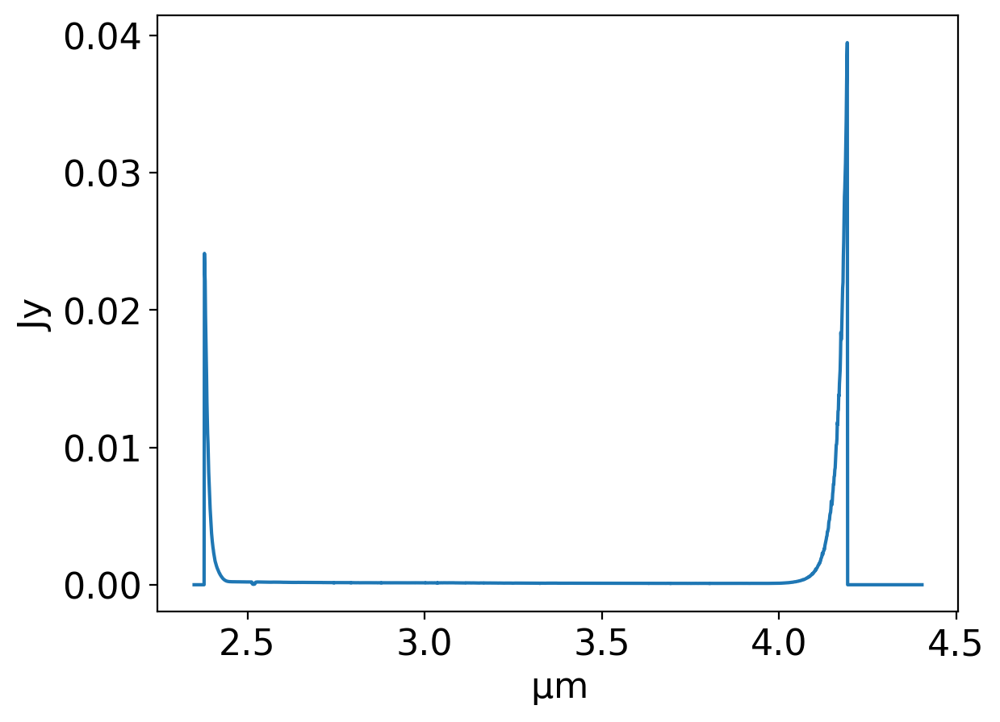

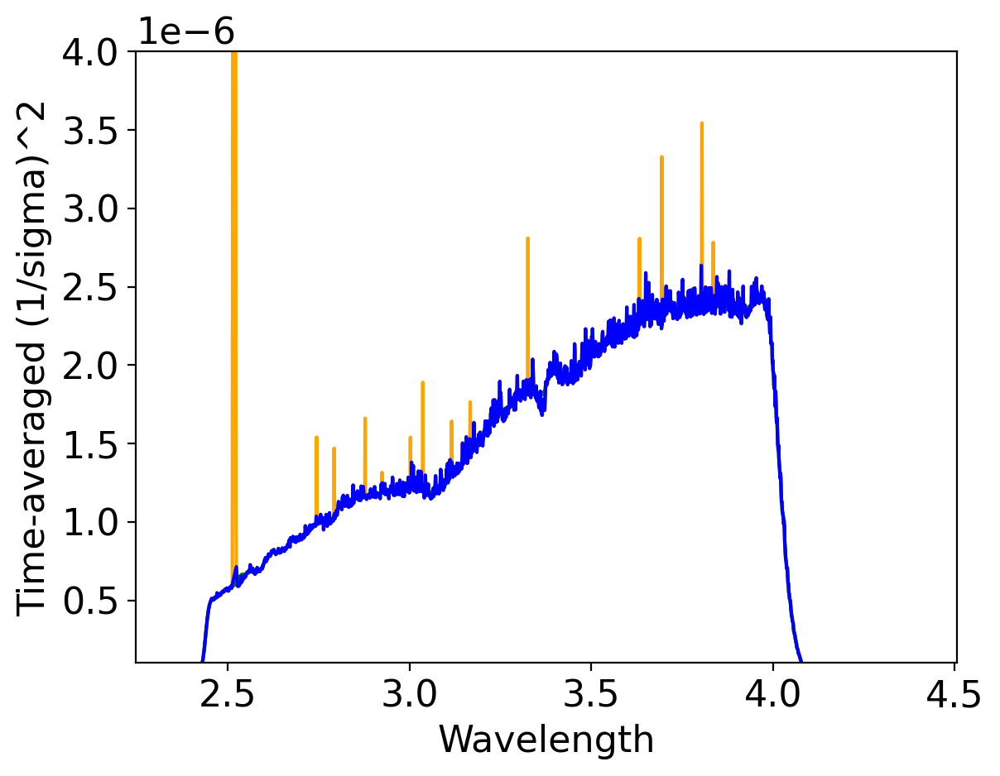

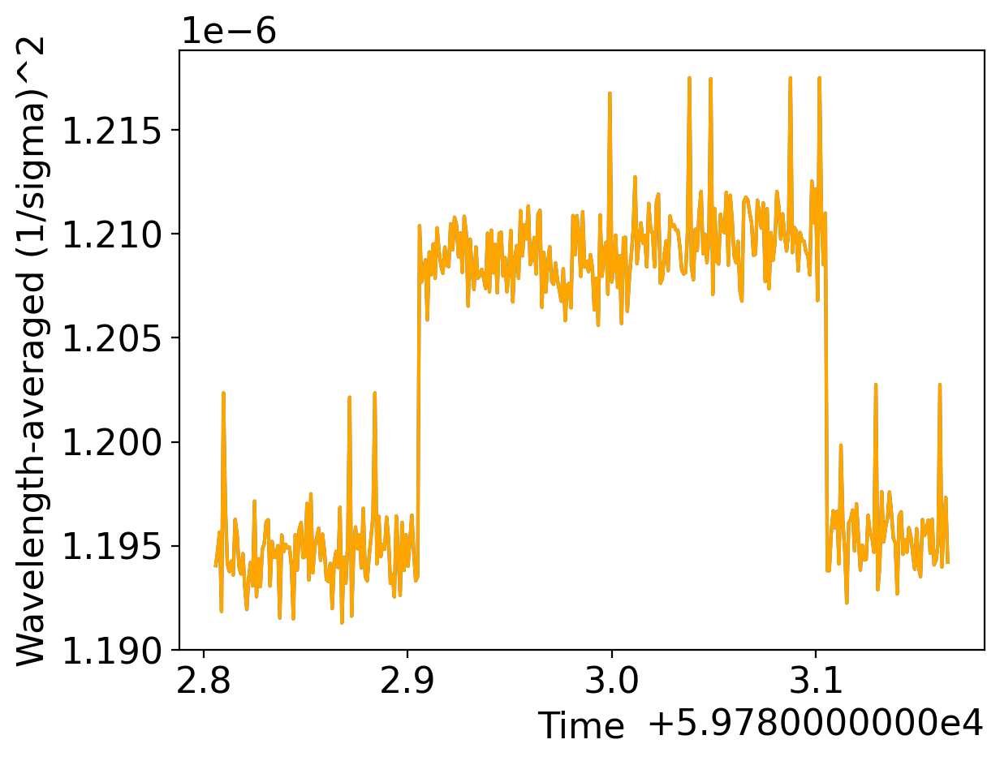

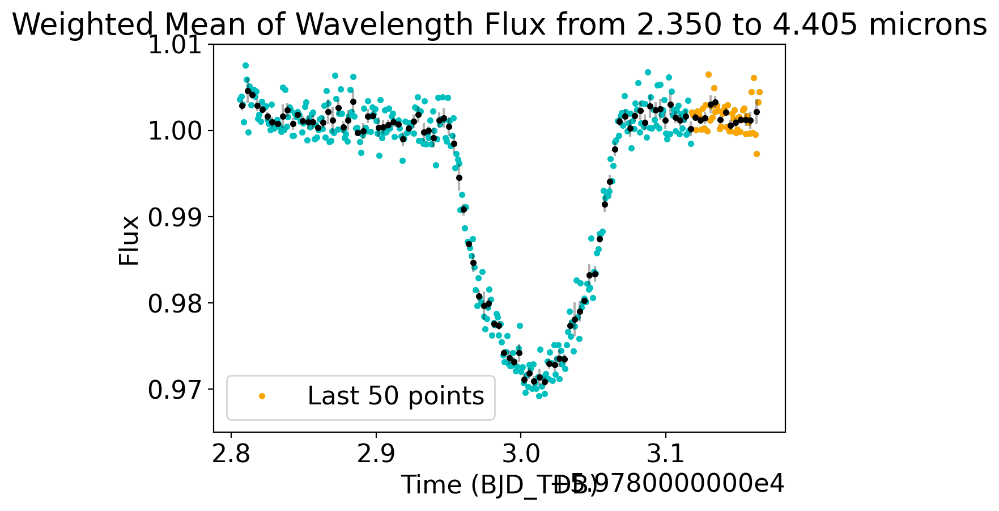

249 1644 2.599670886993408 um 4.000247955322266 um
(378,)
MAD (entire LC) = 2327.716189140738 ppm
MAD (Last 50 points) = 1174.3303774052195 ppm
MAD (5-min binned) = 1235.226804974232 ppm


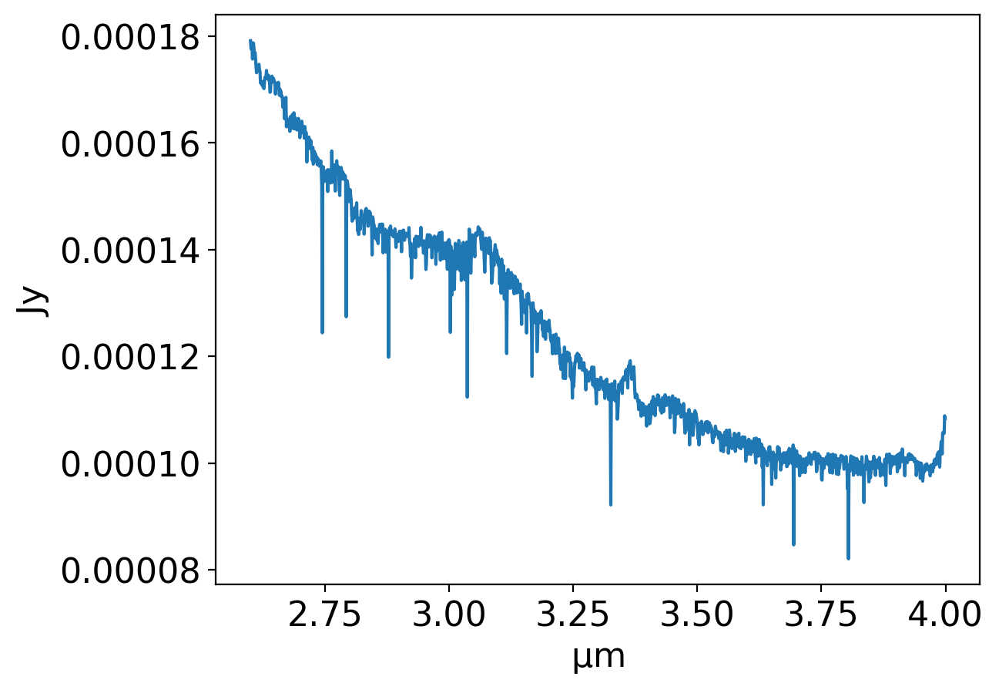

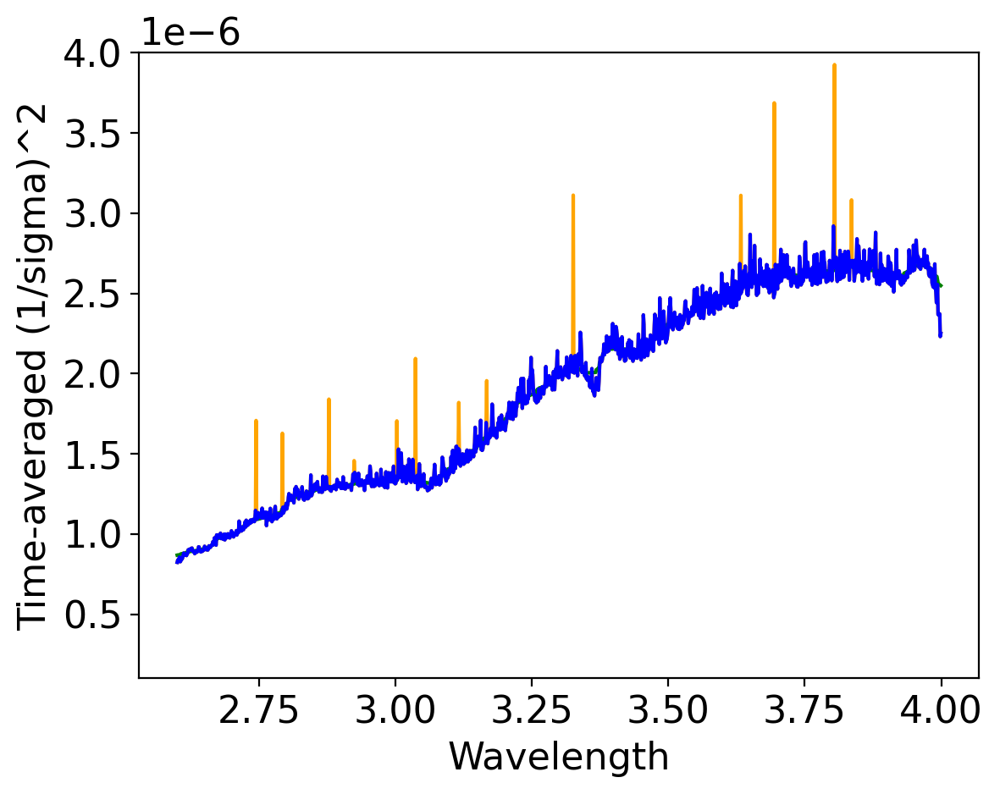

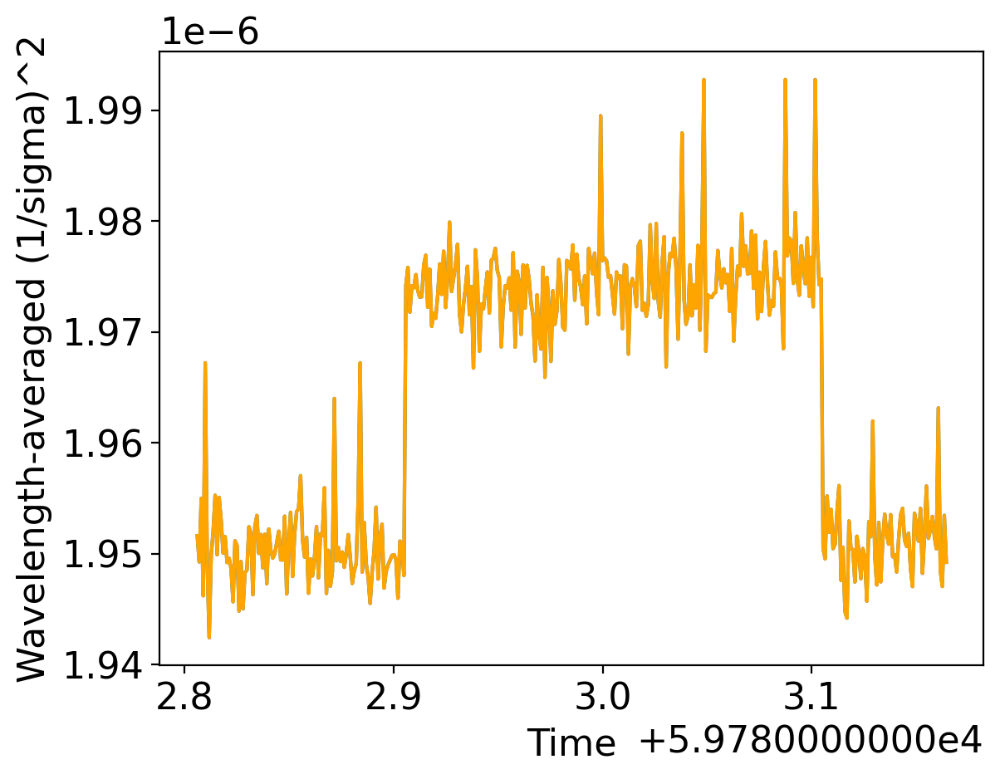

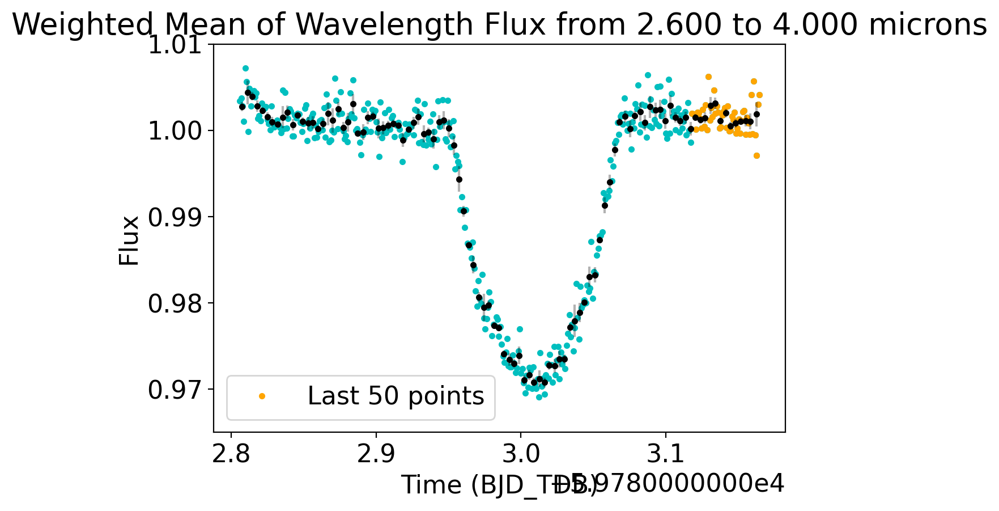

90 1644 2.4400343894958496 um 4.000247955322266 um
(378,)
MAD (entire LC) = 2349.920902963154 ppm
MAD (Last 50 points) = 1125.367656909737 ppm
MAD (5-min binned) = 1259.722749050507 ppm


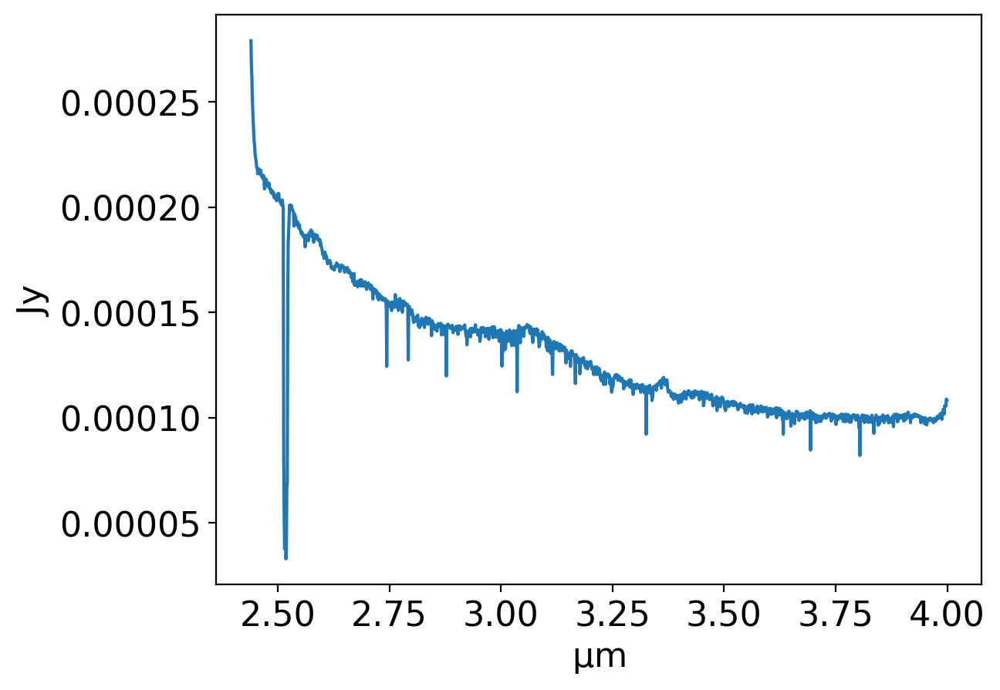

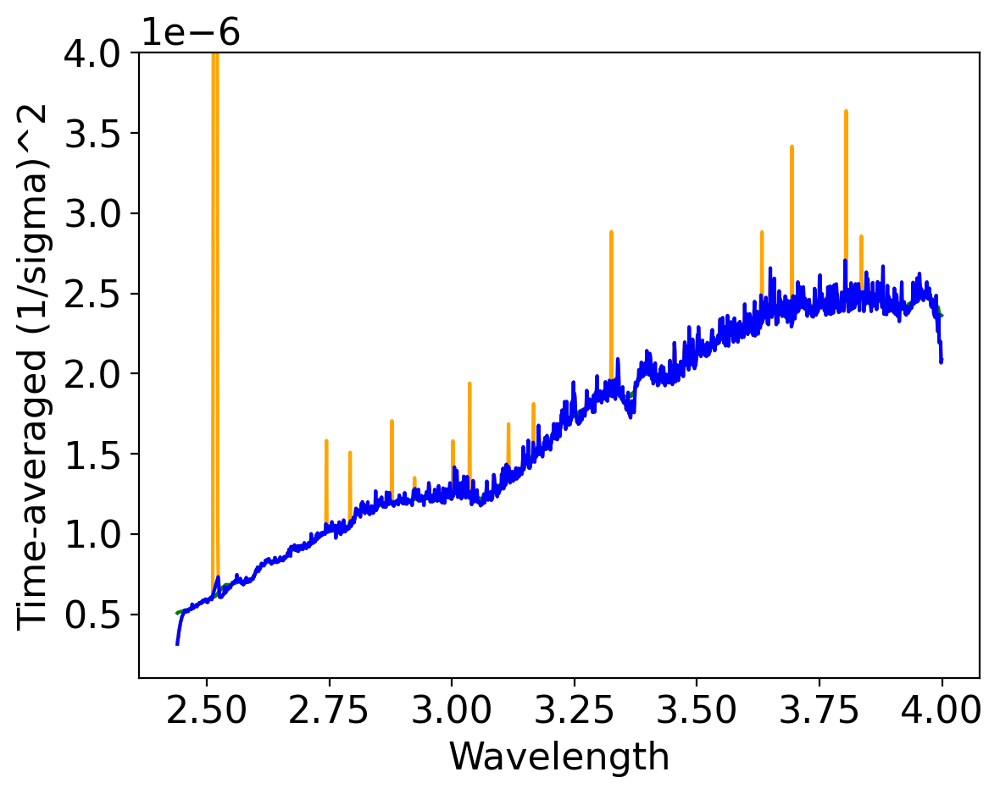

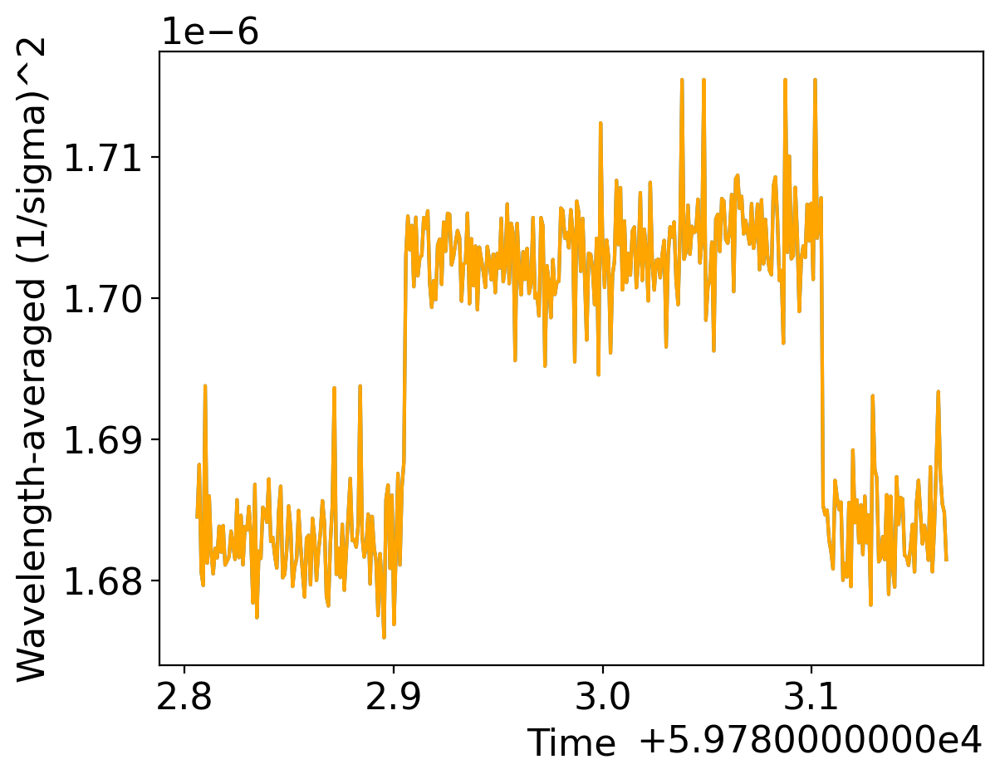

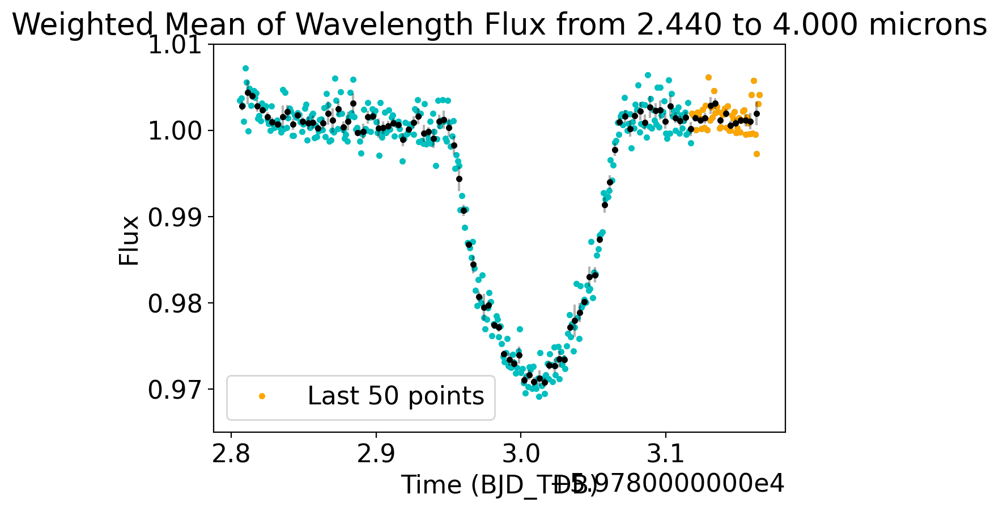

In [333]:
weighted_lc,weighted_err = weighted_avg_lc(rtime,rflux,rfluxe,rwavel,[rwavel.min().to_value(),rwavel.max().to_value()])
weighted_lc,weighted_err = weighted_avg_lc(rtime,rflux,rfluxe,rwavel,[2.6,4.0])
weighted_lc,weighted_err = weighted_avg_lc(rtime,rflux,rfluxe,rwavel,[2.44,4.0])

## Fit Transit Model to average LC with MCMC

(378,) (378,) (378,)
<class 'numpy.ndarray'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>


optimizing logp for variables: [b, r, u, logP, t0, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -10867.034417416124 -> -899.0186832867931


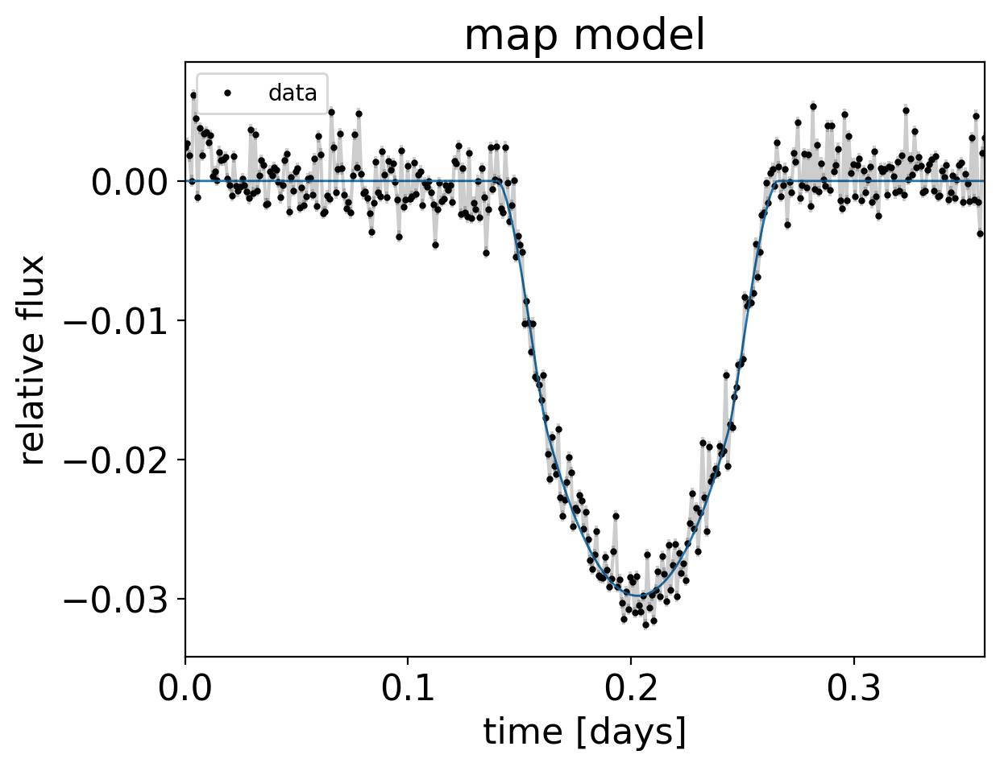

Multiprocess sampling (6 chains in 8 jobs)
NUTS: [b, r, u, logP, t0, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 6 chains for 6_000 tune and 8_000 draw iterations (36_000 + 48_000 draws total) took 90 seconds.
There were 12 divergences after tuning. Increase `target_accept` or reparameterize.
There were 11 divergences after tuning. Increase `target_accept` or reparameterize.
There were 12 divergences after tuning. Increase `target_accept` or reparameterize.
There were 72 divergences after tuning. Increase `target_accept` or reparameterize.
There were 9 divergences after tuning. Increase `target_accept` or reparameterize.


[period ~ Deterministic r ~ Uniform t0 ~ Normal b ~ ImpactParameter
 u ~ QuadLimbDark mean ~ Normal]
            mean        sd    hdi_3%   hdi_97%     mcse_mean       mcse_sd  \
period  4.055259  0.000037  4.055191  4.055328  2.000000e-07  1.000000e-07   
r       0.154336  0.000553  0.153275  0.155333  3.400000e-06  2.400000e-06   
t0      0.202986  0.000062  0.202867  0.203103  3.000000e-07  2.000000e-07   
b       0.509401  0.005119  0.499748  0.518783  3.120000e-05  2.200000e-05   
u[0]    1.408130  0.016177  1.378596  1.439029  7.990000e-05  5.650000e-05   
u[1]   -0.694411  0.014263 -0.718158 -0.666844  1.085000e-04  7.670000e-05   
mean    0.000292  0.000026  0.000242  0.000341  1.000000e-07  1.000000e-07   

            ess_bulk      ess_tail     r_hat  
period  34774.265297  26481.899059  1.000133  
r       27483.223680  17065.438501  1.000188  
t0      39852.212334  31827.294429  1.000223  
b       28671.693914  17390.557988  1.000163  
u[0]    41113.335974  35393.341547  1.0

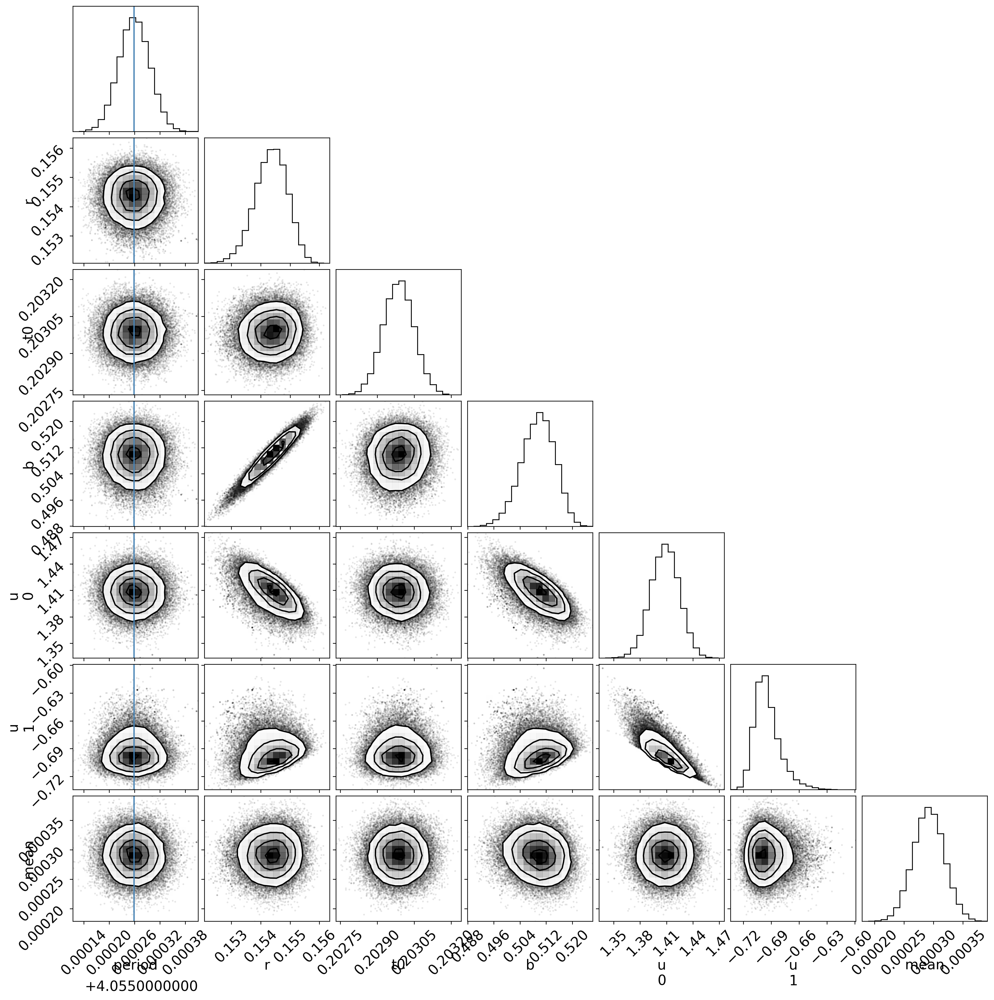

In [344]:
# set initial parameter estimates:
init_t0=0.2
init_period = 4.055259
init_b=0.44
init_r=0.13
init_mean = 0.0
init_u = [1.3,-0.5]

# set up x, y, yerr vectors:
x = rtime - min(rtime)
y = weighted_lc - np.nanmedian(weighted_lc[:130])
yerr = weighted_err #medflux*meddflux
x=np.array([i.to_value() for i in x])
print(np.shape(x),np.shape(y),np.shape(yerr))
print(type(x),type(y),type(yerr))

# fit MCMC transit
map_soln, model,[period,r,t0,b_ip,u_ld,mean] = fit_transit(x,y,yerr,init_r,init_t0, init_period,init_b,init_mean,init_u)
# plot the fit
plot_fit(x,y,yerr,map_soln)
# sample the posterior
trace = sample(map_soln, model)
# plot corner plot (posterior distribution for each variable)
cornerplot(model,trace,period,r,t0,b_ip,u_ld,mean)
# plot summary (mean, std etc.)
summary = summarise(model,trace)
print(summary)

In [347]:
mcmcresults = summary['mean']
mcmcresults

period    4.055259
r         0.154336
t0        0.202986
b         0.509401
u[0]      1.408130
u[1]     -0.694411
mean      0.000292
Name: mean, dtype: float64


🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈

🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 W

🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 W

🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 W

🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 W

🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 W

🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 W

🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 W

🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 W

🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 W

🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 Warning: divide by zero encountered in true_divide
🌈 Warning: invalid value encountered in true_divide
🌈 W

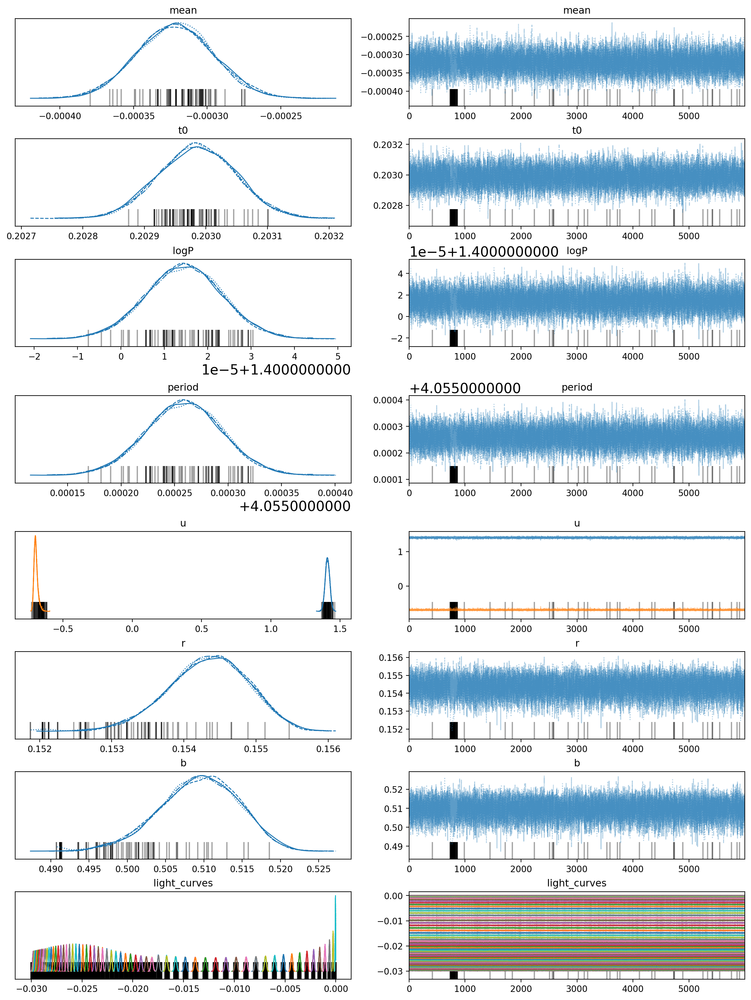

In [336]:
az.plot_trace(trace);

## Run MCMC for each wavelength bin (keep b/P/t0 const)

2.370760440826416 um


optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -6687.221768086481 -> -5990.320480489963


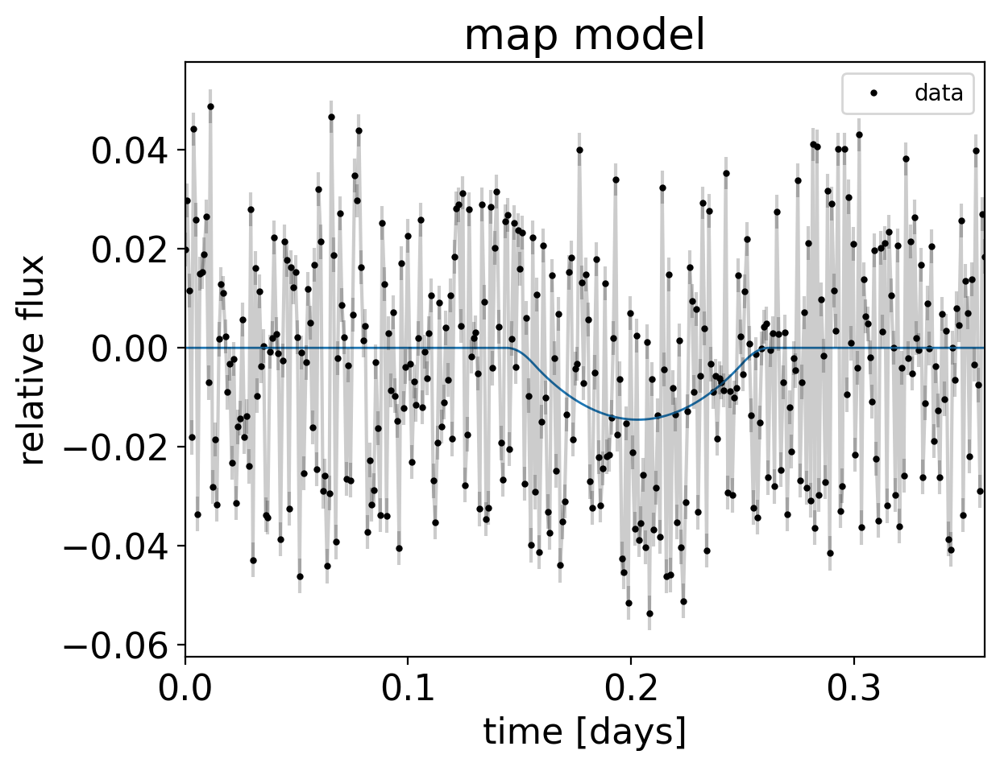

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 37 seconds.
The acceptance probability does not match the target. It is 0.9607575251408929, but should be close to 0.9. Try to increase the number of tuning steps.


          mean        sd    hdi_3%   hdi_97%  mcse_mean       mcse_sd  \
r     0.100340  0.001811  0.097031  0.103795   0.000010  7.300000e-06   
u[0]  1.906956  0.060126  1.796061  1.994556   0.000330  2.335000e-04   
u[1] -0.928522  0.050967 -0.998493 -0.836897   0.000277  1.960000e-04   
mean -0.001200  0.000205 -0.001575 -0.000804   0.000001  8.000000e-07   

          ess_bulk      ess_tail     r_hat  
r     31008.504284  21347.912180  1.000646  
u[0]  30375.959083  20415.562048  1.000069  
u[1]  29749.341373  19861.744369  1.000058  
mean  30550.399908  22396.343181  1.000028   <class 'pandas.core.frame.DataFrame'>
r= 0.1003398 , mean= -0.0011998 , u= 1.9069558 -0.9285217
{'wavelength': [2.370760440826416], 'r': [0.1003398], 'r_err': [0.0018113], 'u0': [1.9069558], 'u1': [-0.9285217], 'u0_err': [0.0601258], 'u1_err': [0.0509666], 'mean': [-0.0011998], 'mean_err': [0.0002046], 't0': [0.2029856], 'period': [4.055259], 'b': [0.5094012]}
2.4129284620285034 um


optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -104092.91841893757 -> -101065.45371713447


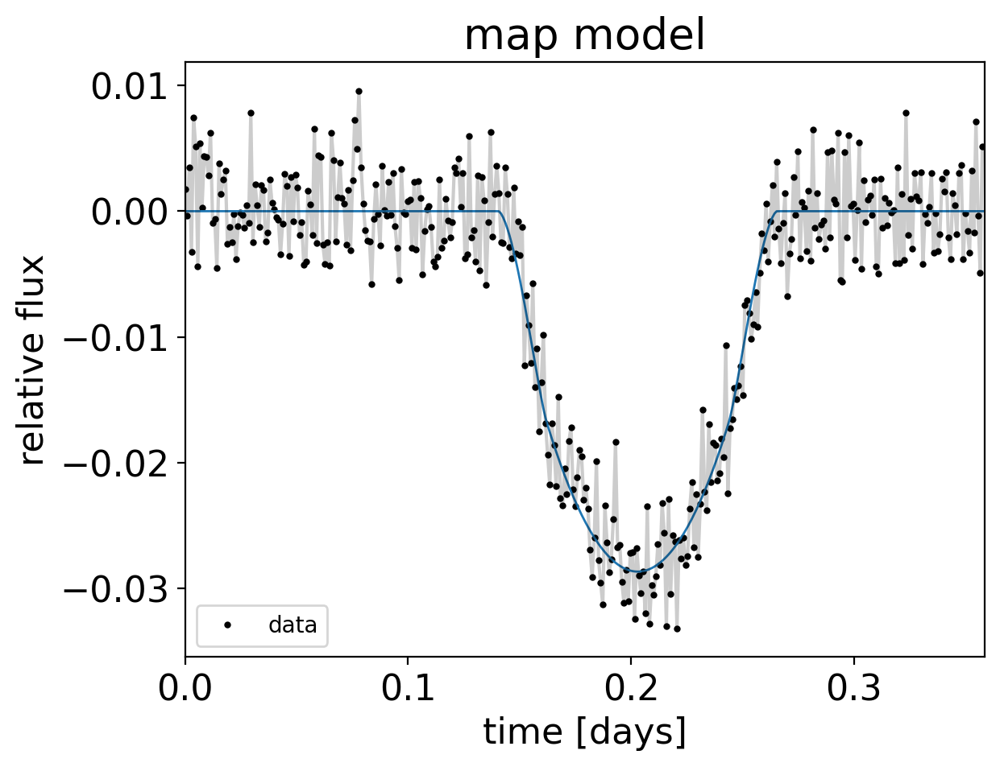

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 37 seconds.
The acceptance probability does not match the target. It is 0.9627183382370194, but should be close to 0.9. Try to increase the number of tuning steps.


          mean        sd    hdi_3%   hdi_97%     mcse_mean       mcse_sd  \
r     0.150630  0.000053  0.150528  0.150730  3.000000e-07  2.000000e-07   
u[0]  1.456004  0.002771  1.450843  1.461174  1.480000e-05  1.050000e-05   
u[1] -0.727144  0.001827 -0.730477 -0.723722  9.900000e-06  7.000000e-06   
mean  0.000173  0.000008  0.000157  0.000188  0.000000e+00  0.000000e+00   

          ess_bulk      ess_tail     r_hat  
r     30931.003375  22039.770217  1.000111  
u[0]  35083.556399  24278.264783  0.999958  
u[1]  33868.853673  25692.613780  0.999970  
mean  31791.099837  21521.177919  1.000150   <class 'pandas.core.frame.DataFrame'>
r= 0.1506304 , mean= 0.0001728 , u= 1.4560037 -0.7271443
{'wavelength': [2.370760440826416, 2.4129284620285034], 'r': [0.1003398, 0.1506304], 'r_err': [0.0018113, 5.35e-05], 'u0': [1.9069558, 1.4560037], 'u1': [-0.9285217, -0.7271443], 'u0_err': [0.0601258, 0.0027708], 'u1_err': [0.0509666, 0.0018268], 'mean': [-0.0011998, 0.0001728], 'mean_err': [0.0002

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -563770.1489732738 -> -552096.9929223257


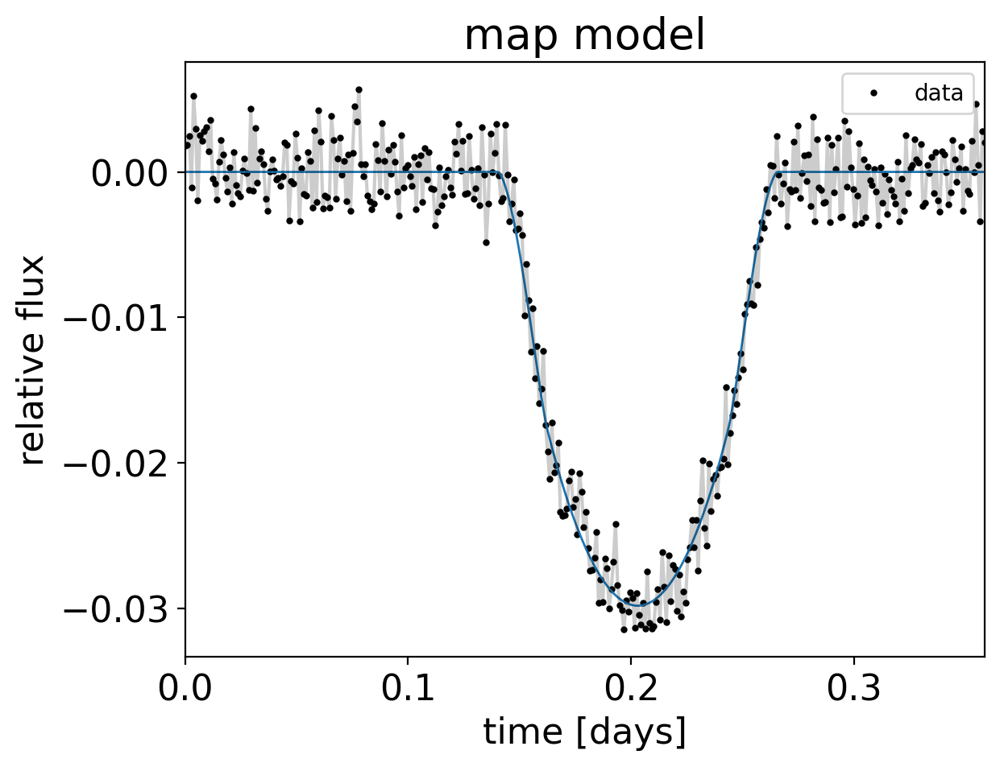

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 32 seconds.


          mean        sd    hdi_3%   hdi_97%     mcse_mean       mcse_sd  \
r     0.153696  0.000018  0.153661  0.153730  1.000000e-07  1.000000e-07   
u[0]  1.416109  0.002726  1.410945  1.421180  1.580000e-05  1.120000e-05   
u[1] -0.669509  0.004037 -0.676925 -0.661838  2.360000e-05  1.670000e-05   
mean -0.000019  0.000002 -0.000023 -0.000014  0.000000e+00  0.000000e+00   

          ess_bulk      ess_tail     r_hat  
r     31196.732011  23573.703741  1.000146  
u[0]  29629.997110  20649.369753  0.999998  
u[1]  29117.126294  21419.353941  1.000009  
mean  33454.918551  23530.547035  1.000123   <class 'pandas.core.frame.DataFrame'>
r= 0.1536956 , mean= -1.86e-05 , u= 1.4161087 -0.6695088
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117], 'r': [0.1003398, 0.1506304, 0.1536956], 'r_err': [0.0018113, 5.35e-05, 1.85e-05], 'u0': [1.9069558, 1.4560037, 1.4161087], 'u1': [-0.9285217, -0.7271443, -0.6695088], 'u0_err': [0.0601258, 0.0027708, 0.0027261], 'u1_err': [

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -425305851.6681981 -> -399476789.0554878


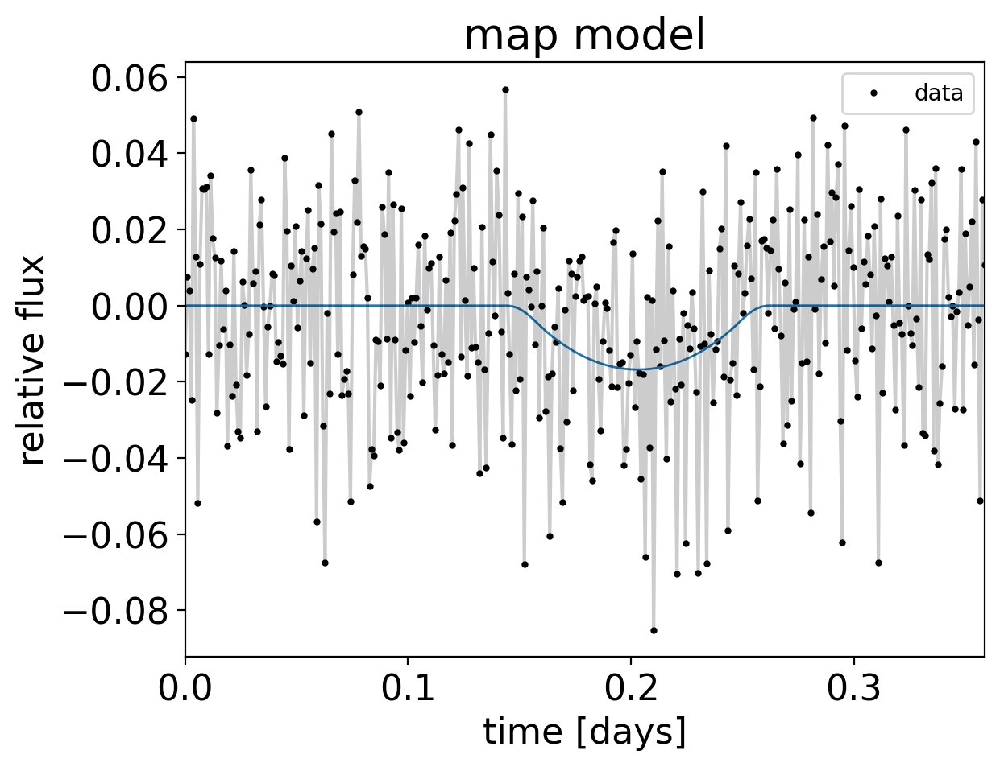

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 37 seconds.


          mean        sd    hdi_3%   hdi_97%  mcse_mean   mcse_sd  \
r     0.107941  0.000009  0.107925  0.107959   0.000000  0.000000   
u[0]  1.879002  0.000782  1.877551  1.880491   0.000004  0.000003   
u[1] -0.879003  0.000782 -0.880504 -0.877563   0.000004  0.000003   
mean  0.000301  0.000001  0.000299  0.000303   0.000000  0.000000   

          ess_bulk      ess_tail     r_hat  
r     36132.786223  23153.275594  1.000004  
u[0]  34560.081489  22439.186862  1.000366  
u[1]  34562.045596  22439.441187  1.000364  
mean  34896.006308  21626.755595  0.999974   <class 'pandas.core.frame.DataFrame'>
r= 0.1079415 , mean= 0.0003013 , u= 1.8790016 -0.8790032
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305], 'r': [0.1003398, 0.1506304, 0.1536956, 0.1079415], 'r_err': [0.0018113, 5.35e-05, 1.85e-05, 8.8e-06], 'u0': [1.9069558, 1.4560037, 1.4161087, 1.8790016], 'u1': [-0.9285217, -0.7271443, -0.6695088, -0.8790032], 'u0_err': [0.0601258, 0.0027

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -231416827.1812181 -> -212738305.69876012


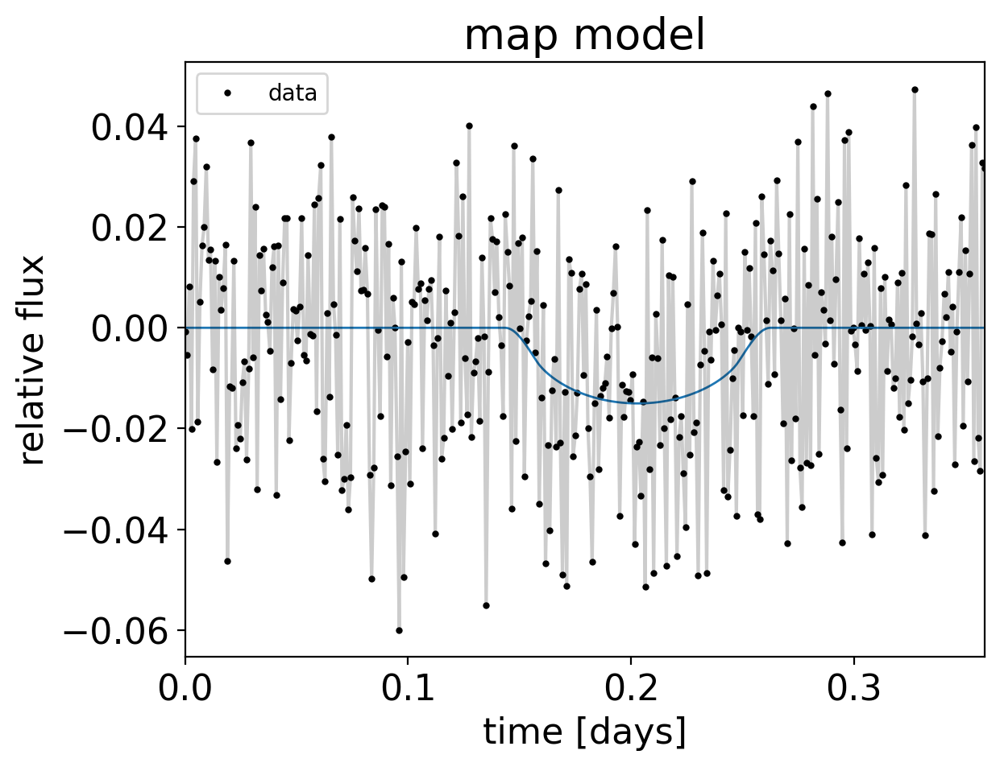

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 38 seconds.


          mean        sd    hdi_3%   hdi_97%     mcse_mean   mcse_sd  \
r     0.107692  0.000010  0.107673  0.107711  1.000000e-07  0.000000   
u[0]  1.070611  0.001379  1.068024  1.073209  7.700000e-06  0.000005   
u[1] -0.070614  0.001379 -0.073180 -0.067994  7.700000e-06  0.000005   
mean -0.000264  0.000001 -0.000267 -0.000262  0.000000e+00  0.000000   

          ess_bulk      ess_tail     r_hat  
r     31244.168138  21932.886488  1.000025  
u[0]  31907.272485  21766.576483  0.999958  
u[1]  31896.425709  21924.363339  0.999958  
mean  32975.654831  21302.007791  1.000100   <class 'pandas.core.frame.DataFrame'>
r= 0.1076921 , mean= -0.0002645 , u= 1.070611 -0.0706144
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305, 2.539431571960449], 'r': [0.1003398, 0.1506304, 0.1536956, 0.1079415, 0.1076921], 'r_err': [0.0018113, 5.35e-05, 1.85e-05, 8.8e-06, 9.9e-06], 'u0': [1.9069558, 1.4560037, 1.4161087, 1.8790016, 1.070611], 'u1': [-0.9285217, -

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -736269.4825378786 -> -719226.5944801669


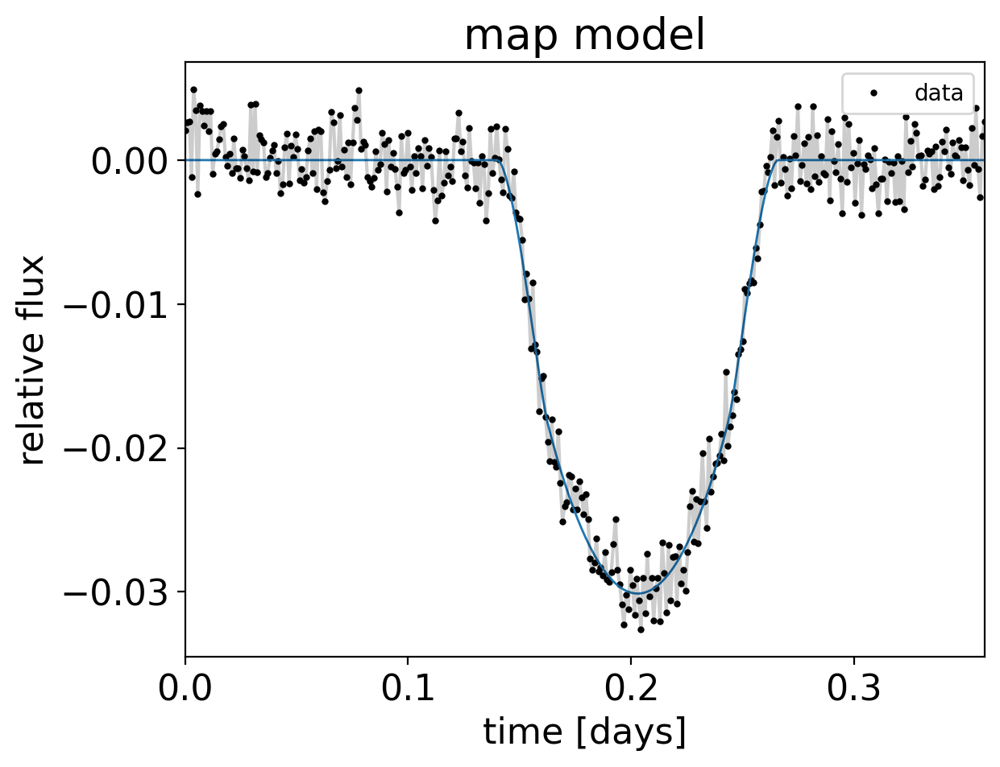

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 33 seconds.


          mean        sd    hdi_3%   hdi_97%     mcse_mean       mcse_sd  \
r     0.154977  0.000015  0.154950  0.155006  1.000000e-07  1.000000e-07   
u[0]  1.368859  0.002221  1.364650  1.372968  1.240000e-05  8.800000e-06   
u[1] -0.626252  0.003276 -0.632390 -0.620101  1.840000e-05  1.300000e-05   
mean  0.000126  0.000002  0.000122  0.000129  0.000000e+00  0.000000e+00   

          ess_bulk      ess_tail     r_hat  
r     34673.235859  24332.851144  1.000181  
u[0]  31932.765133  21750.542200  1.000100  
u[1]  31834.045982  22454.654011  1.000198  
mean  34233.865908  25061.829444  1.000164   <class 'pandas.core.frame.DataFrame'>
r= 0.1549775 , mean= 0.0001257 , u= 1.3688592 -0.626252
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305, 2.539431571960449, 2.581600785255432], 'r': [0.1003398, 0.1506304, 0.1536956, 0.1079415, 0.1076921, 0.1549775], 'r_err': [0.0018113, 5.35e-05, 1.85e-05, 8.8e-06, 9.9e-06, 1.47e-05], 'u0': [1.9069558, 1.456

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -861298.6600231974 -> -853538.75689984


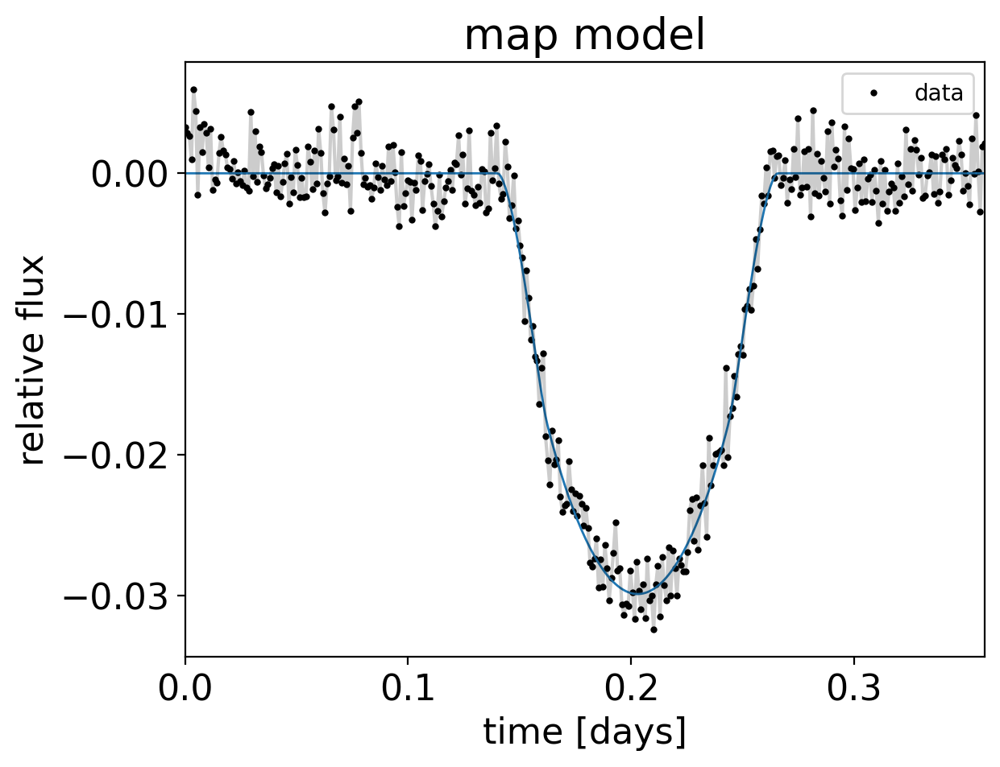

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 33 seconds.


          mean        sd    hdi_3%   hdi_97%     mcse_mean       mcse_sd  \
r     0.154020  0.000014  0.153994  0.154046  1.000000e-07  1.000000e-07   
u[0]  1.384776  0.002096  1.380899  1.388786  1.160000e-05  8.200000e-06   
u[1] -0.630547  0.003107 -0.636433 -0.624753  1.730000e-05  1.220000e-05   
mean  0.000127  0.000002  0.000124  0.000130  0.000000e+00  0.000000e+00   

          ess_bulk      ess_tail     r_hat  
r     32614.575479  24341.819568  1.000053  
u[0]  32368.666860  21870.895762  1.000185  
u[1]  32335.716004  21783.774199  1.000200  
mean  33303.198464  23914.327579  1.000272   <class 'pandas.core.frame.DataFrame'>
r= 0.1540198 , mean= 0.0001271 , u= 1.3847763 -0.6305473
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305, 2.539431571960449, 2.581600785255432, 2.62376868724823], 'r': [0.1003398, 0.1506304, 0.1536956, 0.1079415, 0.1076921, 0.1549775, 0.1540198], 'r_err': [0.0018113, 5.35e-05, 1.85e-05, 8.8e-06, 9.9e-06, 1.47

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -934091.5599550947 -> -823183.6330191833


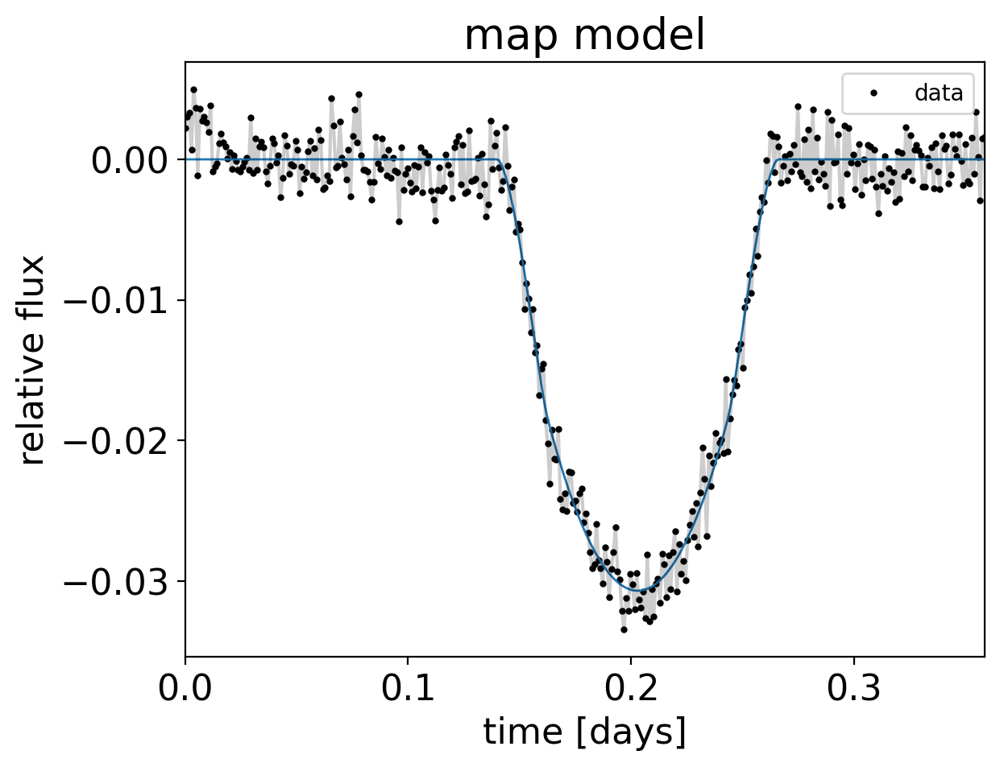

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 57 seconds.
There were 23 divergences after tuning. Increase `target_accept` or reparameterize.
There were 615 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.7602565326709227, but should be close to 0.9. Try to increase the number of tuning steps.
There were 9 divergences after tuning. Increase `target_accept` or reparameterize.
There were 246 divergences after tuning. Increase `target_accept` or reparameterize.
The number of effective samples is smaller than 10% for some parameters.


          mean        sd    hdi_3%   hdi_97%     mcse_mean       mcse_sd  \
r     0.156374  0.000011  0.156354  0.156395  2.000000e-07  2.000000e-07   
u[0]  1.435086  0.001027  1.433055  1.436767  4.240000e-05  3.000000e-05   
u[1] -0.716494  0.001430 -0.718426 -0.713796  7.080000e-05  5.010000e-05   
mean -0.000079  0.000002 -0.000082 -0.000076  0.000000e+00  0.000000e+00   

         ess_bulk     ess_tail     r_hat  
r     2206.927030  2923.952028  1.001484  
u[0]   994.252805   291.277540  1.003888  
u[1]   850.787365   257.716066  1.003809  
mean  7623.183254  6390.333606  1.000455   <class 'pandas.core.frame.DataFrame'>
r= 0.1563738 , mean= -7.89e-05 , u= 1.4350862 -0.7164937
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305, 2.539431571960449, 2.581600785255432, 2.62376868724823, 2.6659367084503174], 'r': [0.1003398, 0.1506304, 0.1536956, 0.1079415, 0.1076921, 0.1549775, 0.1540198, 0.1563738], 'r_err': [0.0018113, 5.35e-05, 1.85e-05, 8

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -843562.264732456 -> -733680.9077807635


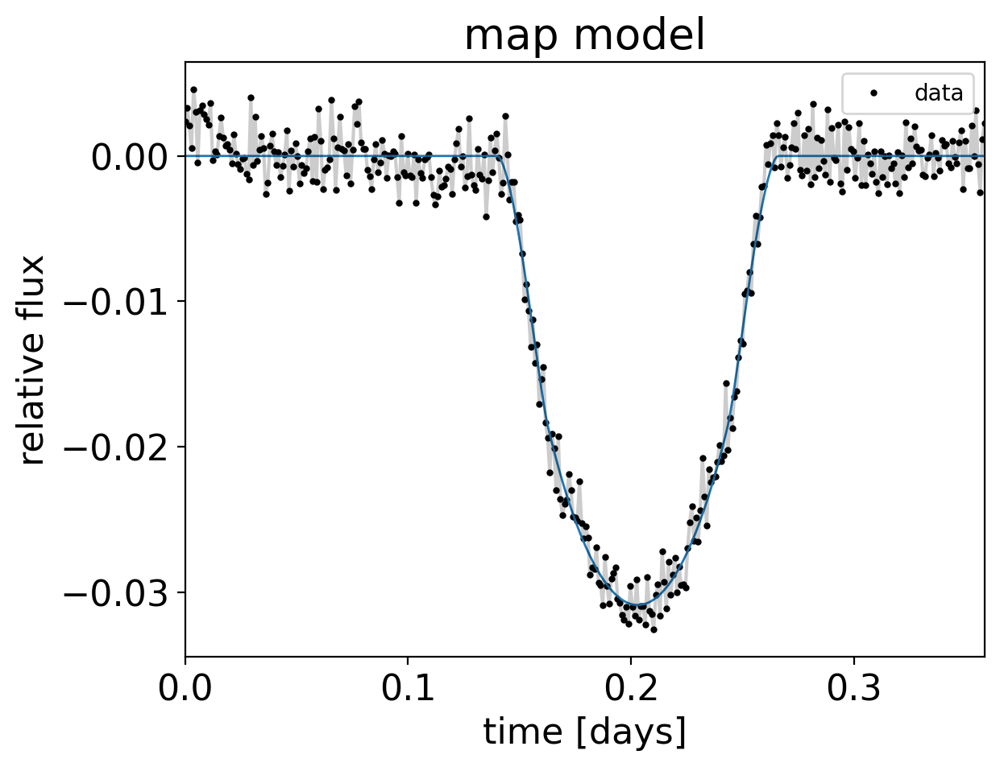

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 34 seconds.


          mean        sd    hdi_3%   hdi_97%     mcse_mean   mcse_sd  \
r     0.156555  0.000013  0.156531  0.156579  1.000000e-07  0.000000   
u[0]  1.372717  0.001903  1.369201  1.376328  1.030000e-05  0.000007   
u[1] -0.609506  0.002819 -0.614833 -0.604286  1.530000e-05  0.000011   
mean  0.000055  0.000002  0.000052  0.000058  0.000000e+00  0.000000   

          ess_bulk      ess_tail     r_hat  
r     34148.566805  24314.207790  1.000059  
u[0]  33981.934219  23987.396728  1.000101  
u[1]  34002.534125  24443.756098  1.000097  
mean  34942.603417  23604.019837  1.000009   <class 'pandas.core.frame.DataFrame'>
r= 0.156555 , mean= 5.46e-05 , u= 1.3727172 -0.6095064
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305, 2.539431571960449, 2.581600785255432, 2.62376868724823, 2.6659367084503174, 2.708104372024536], 'r': [0.1003398, 0.1506304, 0.1536956, 0.1079415, 0.1076921, 0.1549775, 0.1540198, 0.1563738, 0.156555], 'r_err': [0.0018113, 5.35

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -1075078.4809924935 -> -966015.1690777674


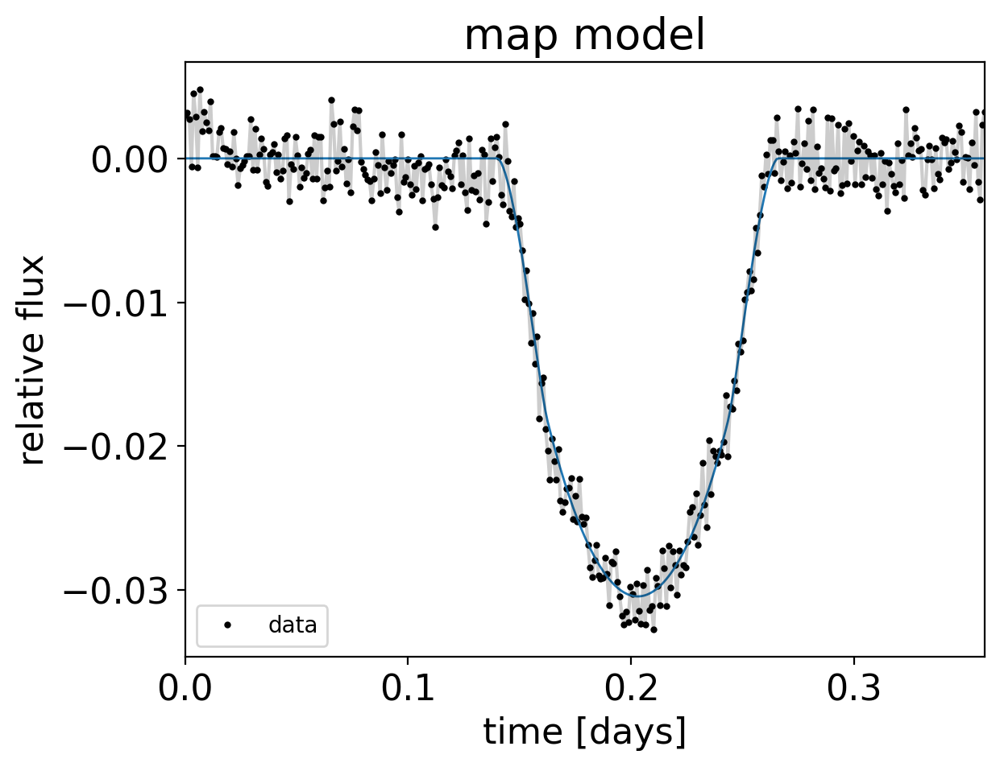

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 33 seconds.


          mean        sd    hdi_3%   hdi_97%     mcse_mean   mcse_sd  \
r     0.155503  0.000012  0.155480  0.155526  1.000000e-07  0.000000   
u[0]  1.397072  0.001819  1.393649  1.400479  1.020000e-05  0.000007   
u[1] -0.651776  0.002693 -0.656867 -0.646793  1.500000e-05  0.000011   
mean -0.000121  0.000002 -0.000123 -0.000118  0.000000e+00  0.000000   

          ess_bulk      ess_tail     r_hat  
r     32373.025918  23027.899733  1.000247  
u[0]  32094.902388  21167.825693  1.000009  
u[1]  32019.607282  21870.121575  1.000005  
mean  33329.534057  23069.481515  1.000223   <class 'pandas.core.frame.DataFrame'>
r= 0.1555034 , mean= -0.0001208 , u= 1.3970717 -0.6517759
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305, 2.539431571960449, 2.581600785255432, 2.62376868724823, 2.6659367084503174, 2.708104372024536, 2.7502721548080444], 'r': [0.1003398, 0.1506304, 0.1536956, 0.1079415, 0.1076921, 0.1549775, 0.1540198, 0.1563738, 0.156555, 0.1

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -1085463.3838911094 -> -942015.9805424374


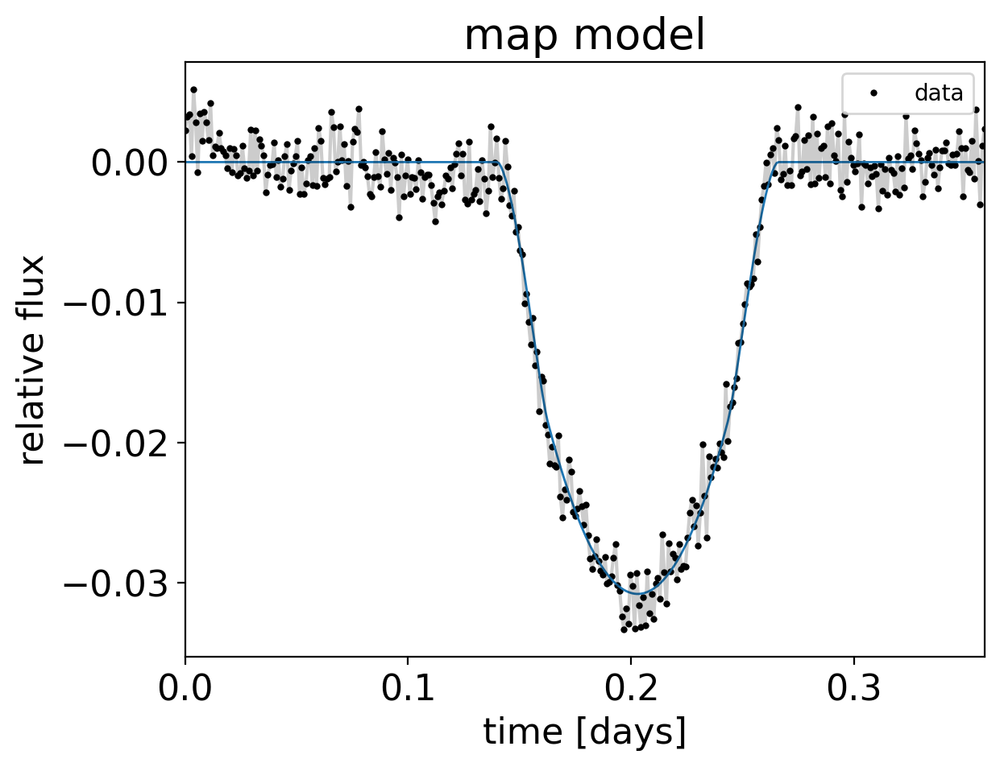

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 36 seconds.


          mean        sd    hdi_3%   hdi_97%     mcse_mean       mcse_sd  \
r     0.156595  0.000009  0.156578  0.156612  1.000000e-07  0.000000e+00   
u[0]  1.437808  0.000443  1.436984  1.438641  2.400000e-06  1.700000e-06   
u[1] -0.718859  0.000230 -0.719282 -0.718422  1.300000e-06  9.000000e-07   
mean -0.000057  0.000002 -0.000060 -0.000054  0.000000e+00  0.000000e+00   

          ess_bulk      ess_tail     r_hat  
r     32055.451832  22512.314055  1.000211  
u[0]  33681.197412  21620.406939  1.000137  
u[1]  33913.986624  22723.333866  1.000108  
mean  32458.688658  21873.176049  1.000025   <class 'pandas.core.frame.DataFrame'>
r= 0.1565949 , mean= -5.68e-05 , u= 1.437808 -0.7188594
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305, 2.539431571960449, 2.581600785255432, 2.62376868724823, 2.6659367084503174, 2.708104372024536, 2.7502721548080444, 2.7924399375915527], 'r': [0.1003398, 0.1506304, 0.1536956, 0.1079415, 0.1076921, 0.154977

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -1472600.352378087 -> -1135648.4373732498


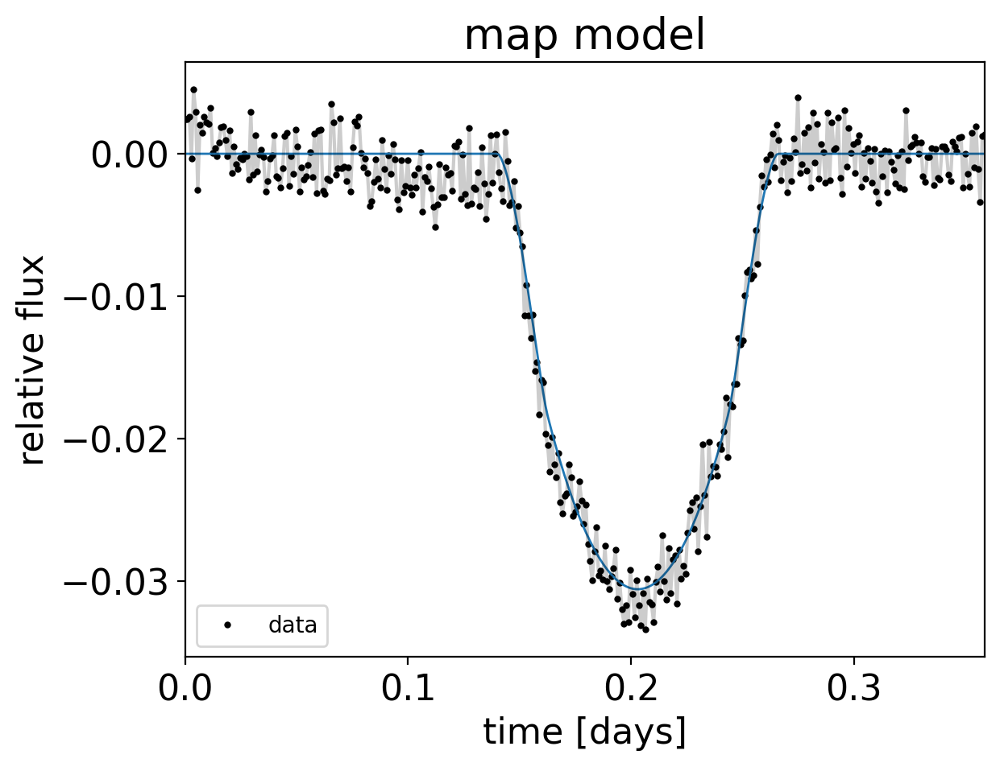

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 34 seconds.


          mean        sd    hdi_3%   hdi_97%     mcse_mean   mcse_sd  \
r     0.156019  0.000012  0.155998  0.156041  1.000000e-07  0.000000   
u[0]  1.409216  0.001708  1.405998  1.412401  9.700000e-06  0.000007   
u[1] -0.676100  0.002529 -0.680888 -0.671429  1.450000e-05  0.000010   
mean -0.000460  0.000001 -0.000463 -0.000458  0.000000e+00  0.000000   

          ess_bulk      ess_tail     r_hat  
r     32833.173123  23713.354202  1.000182  
u[0]  30799.754207  20297.631647  1.000046  
u[1]  30368.410136  21455.443788  1.000055  
mean  35465.537622  24638.244194  1.000083   <class 'pandas.core.frame.DataFrame'>
r= 0.156019 , mean= -0.0004601 , u= 1.4092163 -0.6761005
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305, 2.539431571960449, 2.581600785255432, 2.62376868724823, 2.6659367084503174, 2.708104372024536, 2.7502721548080444, 2.7924399375915527, 2.834607720375061], 'r': [0.1003398, 0.1506304, 0.1536956, 0.1079415, 0.1076921, 0.154977

optimizing logp for variables: [r, u, mean]


message: Optimization terminated successfully.
logp: -1362094.1626679446 -> -1246803.9884937878


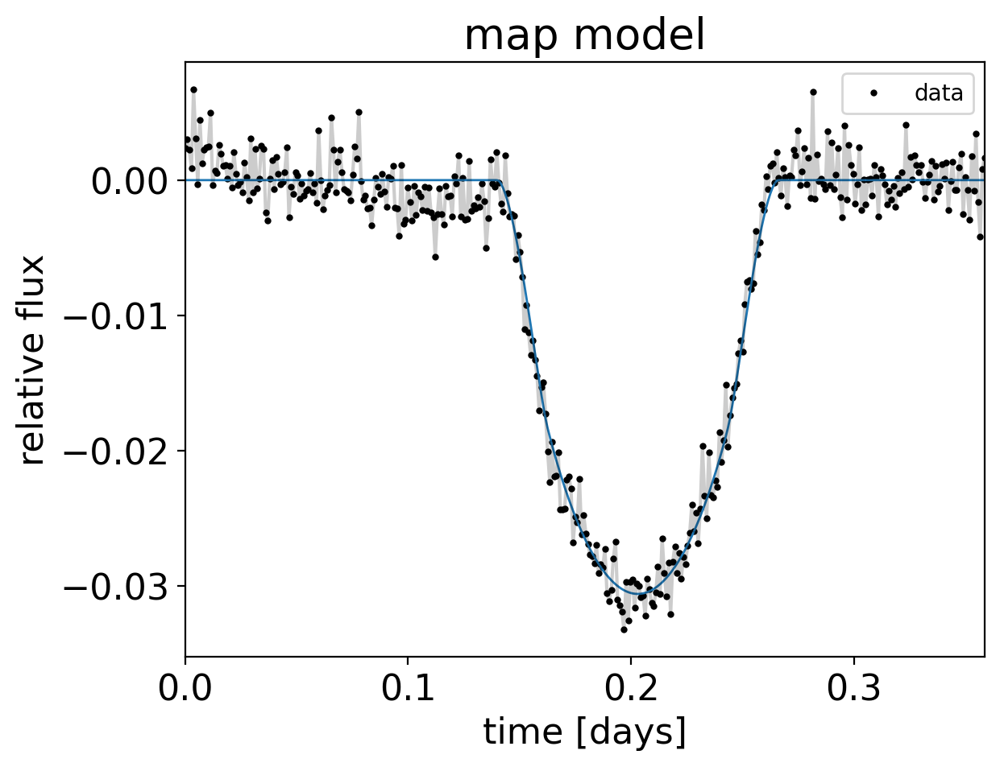

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 31 seconds.


          mean        sd    hdi_3%   hdi_97%     mcse_mean   mcse_sd  \
r     0.155779  0.000011  0.155758  0.155801  1.000000e-07  0.000000   
u[0]  1.358056  0.001705  1.354932  1.361346  9.400000e-06  0.000007   
u[1] -0.584879  0.002525 -0.589749 -0.580288  1.390000e-05  0.000010   
mean -0.000006  0.000001 -0.000009 -0.000003  0.000000e+00  0.000000   

          ess_bulk      ess_tail     r_hat  
r     34032.433255  24573.669174  1.000113  
u[0]  33007.666678  22881.332838  0.999976  
u[1]  33198.145817  23318.031411  0.999936  
mean  35398.817695  24843.315745  1.000050   <class 'pandas.core.frame.DataFrame'>
r= 0.1557792 , mean= -5.9e-06 , u= 1.3580565 -0.5848787
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305, 2.539431571960449, 2.581600785255432, 2.62376868724823, 2.6659367084503174, 2.708104372024536, 2.7502721548080444, 2.7924399375915527, 2.834607720375061, 2.8767757415771484], 'r': [0.1003398, 0.1506304, 0.1536956, 0.1079415, 

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -1399329.0586280671 -> -1334267.104576303


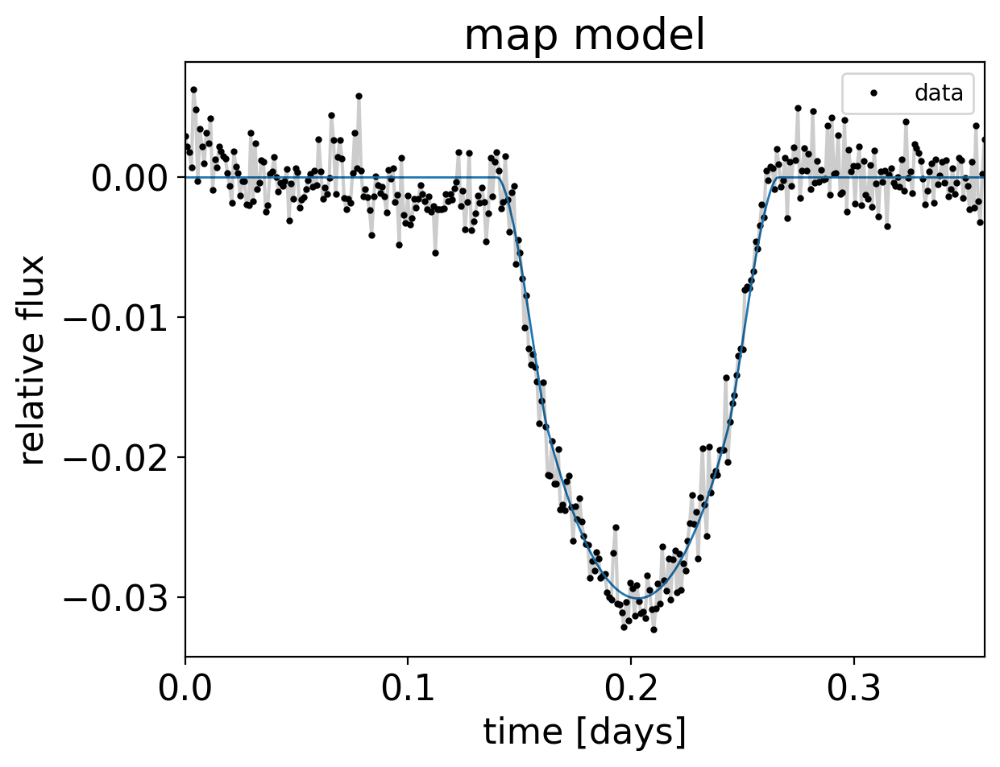

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 35 seconds.


          mean        sd    hdi_3%   hdi_97%     mcse_mean   mcse_sd  \
r     0.154529  0.000011  0.154507  0.154550  1.000000e-07  0.000000   
u[0]  1.418586  0.001687  1.415380  1.421703  9.500000e-06  0.000007   
u[1] -0.680829  0.002497 -0.685456 -0.676149  1.420000e-05  0.000010   
mean -0.000080  0.000001 -0.000083 -0.000078  0.000000e+00  0.000000   

          ess_bulk      ess_tail     r_hat  
r     32109.150983  23973.511324  1.000053  
u[0]  31297.539088  21579.665641  1.000006  
u[1]  31010.656361  22456.683630  1.000025  
mean  33022.122473  24908.454411  1.000071   <class 'pandas.core.frame.DataFrame'>
r= 0.1545285 , mean= -8.02e-05 , u= 1.4185859 -0.6808292
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305, 2.539431571960449, 2.581600785255432, 2.62376868724823, 2.6659367084503174, 2.708104372024536, 2.7502721548080444, 2.7924399375915527, 2.834607720375061, 2.8767757415771484, 2.9189438819885254], 'r': [0.1003398, 0.1506304, 0

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -1494021.2099110533 -> -1448054.0941384982


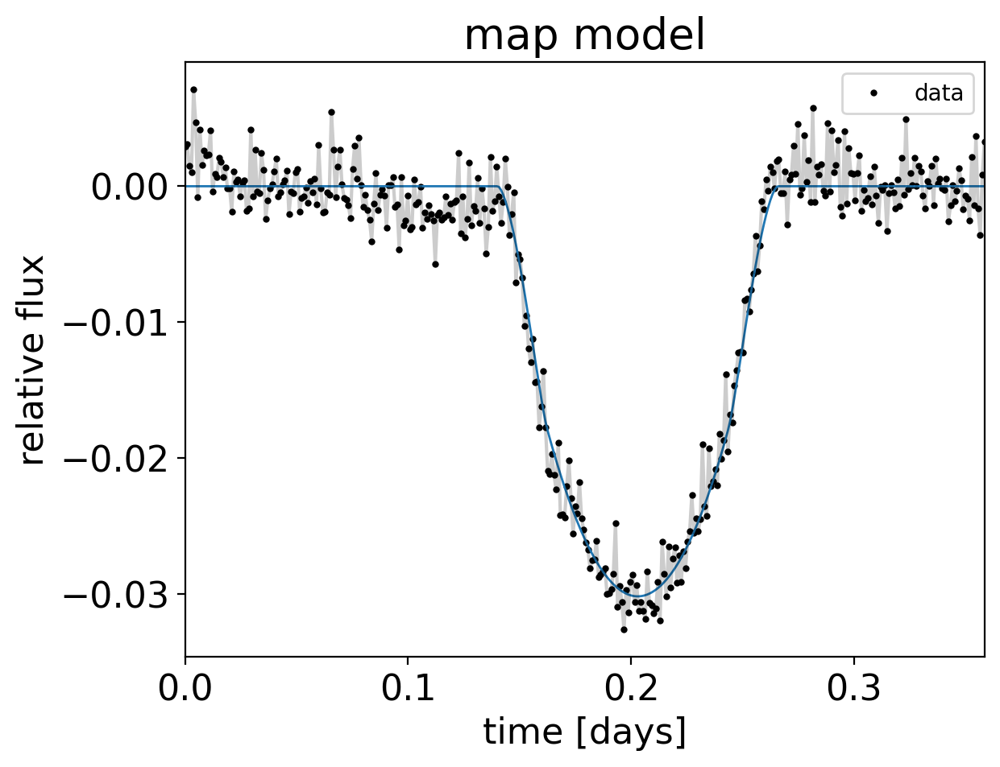

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 42 seconds.
There were 4 divergences after tuning. Increase `target_accept` or reparameterize.
There were 4 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.9627976122231814, but should be close to 0.9. Try to increase the number of tuning steps.
There were 4 divergences after tuning. Increase `target_accept` or reparameterize.


          mean        sd    hdi_3%   hdi_97%     mcse_mean   mcse_sd  \
r     0.154762  0.000009  0.154746  0.154779  1.000000e-07  0.000000   
u[0]  1.450517  0.000465  1.449622  1.451367  2.700000e-06  0.000002   
u[1] -0.725037  0.000384 -0.725665 -0.724285  2.400000e-06  0.000002   
mean  0.000008  0.000001  0.000006  0.000011  0.000000e+00  0.000000   

          ess_bulk      ess_tail     r_hat  
r     28180.136242  21479.468969  1.000092  
u[0]  30606.429238  24001.089458  1.000028  
u[1]  24428.817591  22437.079546  0.999979  
mean  28299.122104  20778.419846  1.000030   <class 'pandas.core.frame.DataFrame'>
r= 0.1547623 , mean= 8.2e-06 , u= 1.4505171 -0.7250372
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305, 2.539431571960449, 2.581600785255432, 2.62376868724823, 2.6659367084503174, 2.708104372024536, 2.7502721548080444, 2.7924399375915527, 2.834607720375061, 2.8767757415771484, 2.9189438819885254, 2.961111545562744], 'r': [0.1003

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -1615985.869020902 -> -1541572.2039350343


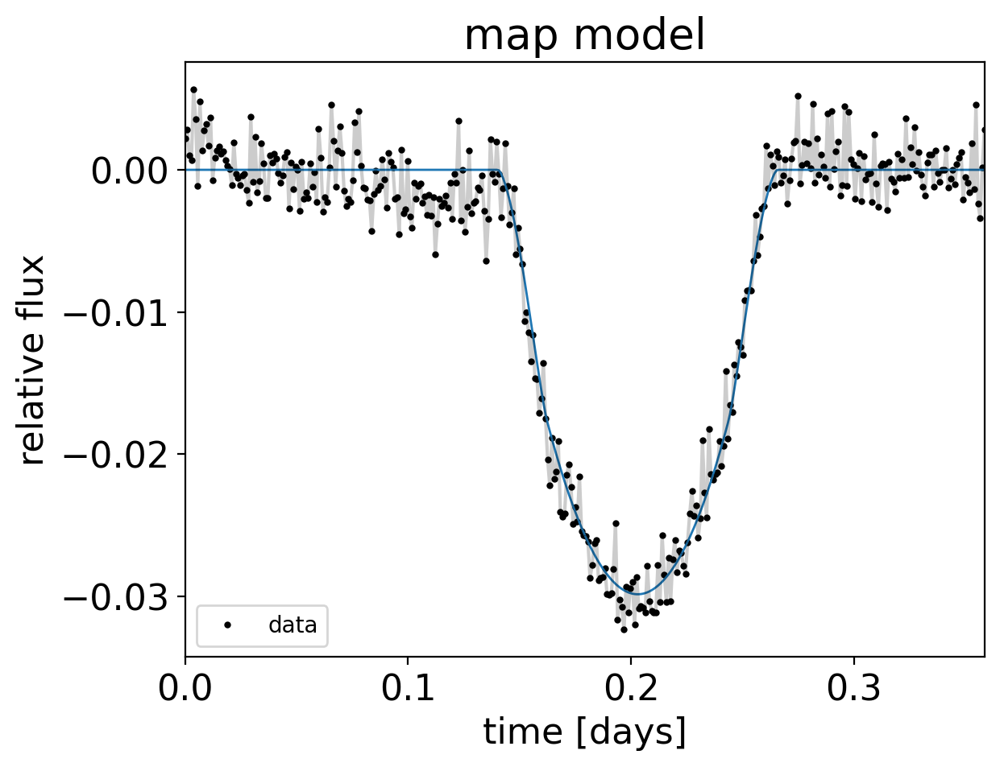

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 38 seconds.
The acceptance probability does not match the target. It is 0.9666547908609316, but should be close to 0.9. Try to increase the number of tuning steps.


          mean        sd    hdi_3%   hdi_97%  mcse_mean       mcse_sd  \
r     0.153934  0.000008  0.153918  0.153949   0.000000  0.000000e+00   
u[0]  1.448202  0.000414  1.447415  1.448980   0.000002  1.600000e-06   
u[1] -0.724057  0.000216 -0.724461 -0.723644   0.000001  8.000000e-07   
mean -0.000164  0.000001 -0.000166 -0.000161   0.000000  0.000000e+00   

          ess_bulk      ess_tail     r_hat  
r     32801.815977  23056.832816  1.000482  
u[0]  32336.068872  22115.033593  1.000460  
u[1]  32908.347754  22815.531303  1.000287  
mean  32482.063266  22310.456083  1.000246   <class 'pandas.core.frame.DataFrame'>
r= 0.1539337 , mean= -0.0001639 , u= 1.4482023 -0.7240568
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305, 2.539431571960449, 2.581600785255432, 2.62376868724823, 2.6659367084503174, 2.708104372024536, 2.7502721548080444, 2.7924399375915527, 2.834607720375061, 2.8767757415771484, 2.9189438819885254, 2.961111545562744, 3.003

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -1875987.9074707644 -> -1851603.3870196238


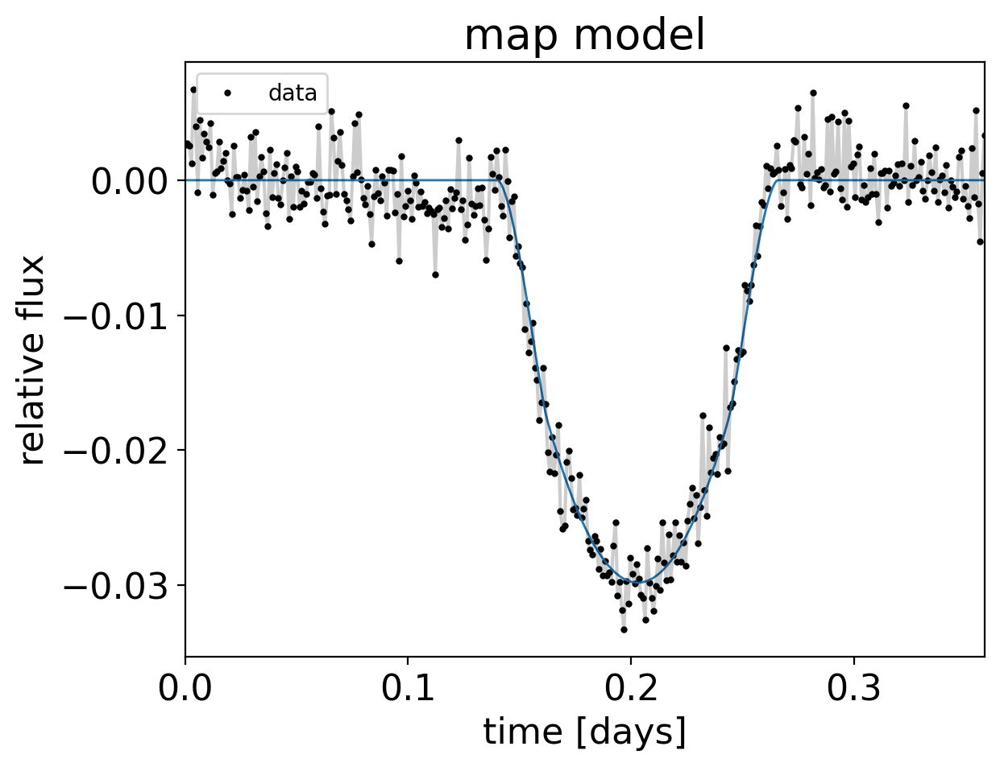

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 38 seconds.
There were 3 divergences after tuning. Increase `target_accept` or reparameterize.


          mean        sd    hdi_3%   hdi_97%  mcse_mean   mcse_sd  \
r     0.153971  0.000008  0.153955  0.153987   0.000000  0.000000   
u[0]  1.441532  0.000428  1.440734  1.442342   0.000002  0.000002   
u[1] -0.720666  0.000255 -0.721147 -0.720197   0.000001  0.000001   
mean  0.000022  0.000001  0.000019  0.000024   0.000000  0.000000   

          ess_bulk      ess_tail     r_hat  
r     30904.751586  21840.663614  1.000058  
u[0]  34219.361655  22782.452547  1.000317  
u[1]  34877.388897  24449.724806  1.000206  
mean  32439.910282  21381.157017  1.000592   <class 'pandas.core.frame.DataFrame'>
r= 0.1539713 , mean= 2.15e-05 , u= 1.4415321 -0.7206661
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305, 2.539431571960449, 2.581600785255432, 2.62376868724823, 2.6659367084503174, 2.708104372024536, 2.7502721548080444, 2.7924399375915527, 2.834607720375061, 2.8767757415771484, 2.9189438819885254, 2.961111545562744, 3.0032793283462524, 3.04544

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -2079522.259647954 -> -2001547.234831159


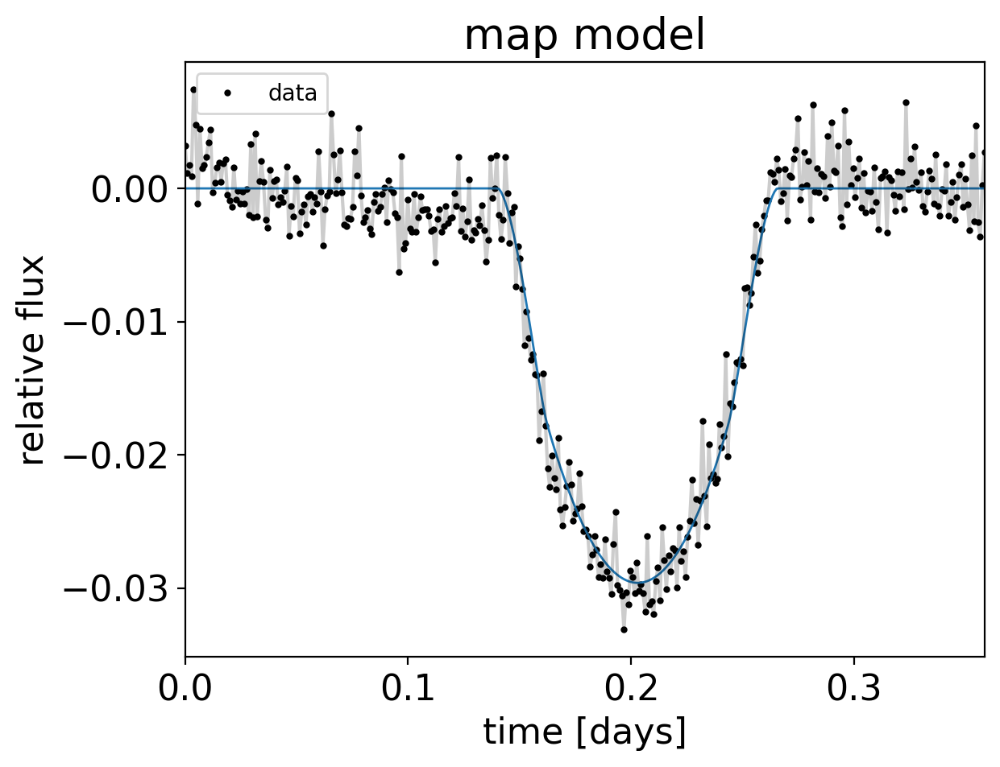

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 52 seconds.
There were 3 divergences after tuning. Increase `target_accept` or reparameterize.


          mean        sd    hdi_3%   hdi_97%     mcse_mean       mcse_sd  \
r     0.153567  0.000011  0.153547  0.153588  1.000000e-07  1.000000e-07   
u[0]  1.428707  0.001640  1.425619  1.431786  1.680000e-05  1.190000e-05   
u[1] -0.708610  0.002429 -0.713178 -0.704089  2.560000e-05  1.810000e-05   
mean -0.000200  0.000001 -0.000202 -0.000198  0.000000e+00  0.000000e+00   

          ess_bulk      ess_tail     r_hat  
r     13782.293905  15863.340783  1.000096  
u[0]   9476.231560   7010.371384  1.000346  
u[1]   8880.083778   7110.386079  1.000506  
mean  21931.195919  20511.616709  1.000365   <class 'pandas.core.frame.DataFrame'>
r= 0.1535674 , mean= -0.0002 , u= 1.4287066 -0.70861
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305, 2.539431571960449, 2.581600785255432, 2.62376868724823, 2.6659367084503174, 2.708104372024536, 2.7502721548080444, 2.7924399375915527, 2.834607720375061, 2.8767757415771484, 2.9189438819885254, 2.961111545562

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -2308107.576212773 -> -2098114.5052932873


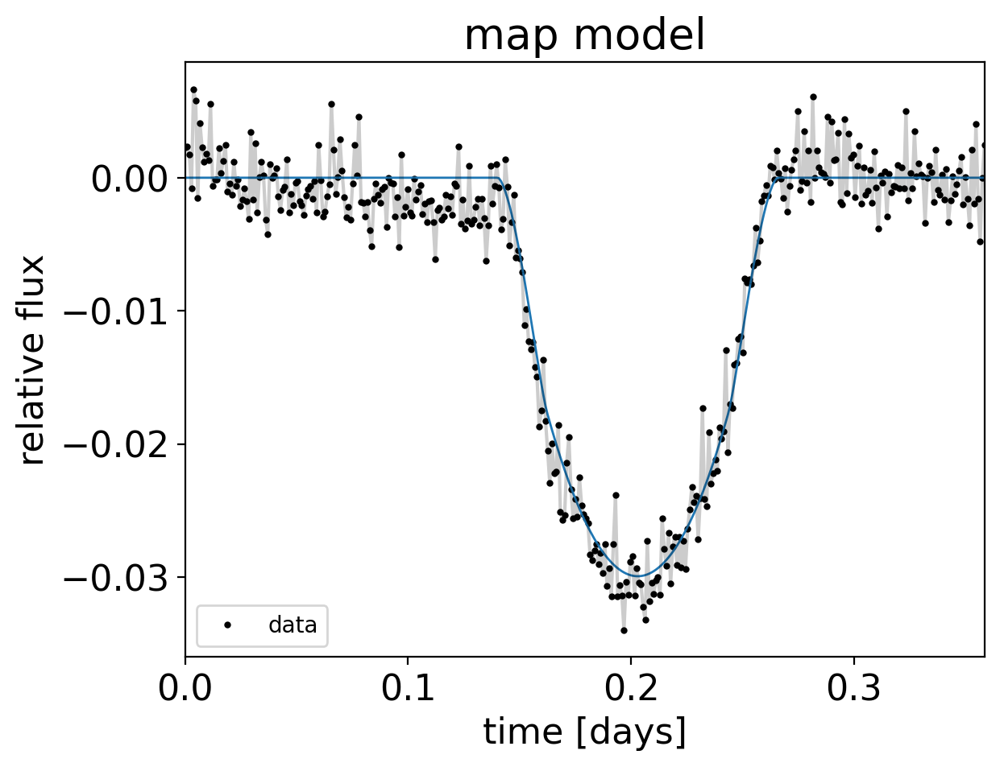

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 54 seconds.
There were 7 divergences after tuning. Increase `target_accept` or reparameterize.
There was 1 divergence after tuning. Increase `target_accept` or reparameterize.
There was 1 divergence after tuning. Increase `target_accept` or reparameterize.
The number of effective samples is smaller than 25% for some parameters.


          mean        sd    hdi_3%   hdi_97%     mcse_mean       mcse_sd  \
r     0.154064  0.000010  0.154044  0.154084  1.000000e-07  1.000000e-07   
u[0]  1.450808  0.001523  1.447869  1.453572  1.800000e-05  1.270000e-05   
u[1] -0.720798  0.002253 -0.724926 -0.716483  2.760000e-05  1.960000e-05   
mean -0.000411  0.000001 -0.000414 -0.000409  0.000000e+00  0.000000e+00   

          ess_bulk      ess_tail     r_hat  
r     10618.592259  12395.007334  1.000199  
u[0]   7056.293906   4832.251490  1.000061  
u[1]   6509.712465   4782.263177  1.000083  
mean  19560.563243  16563.106157  1.000115   <class 'pandas.core.frame.DataFrame'>
r= 0.1540642 , mean= -0.000411 , u= 1.4508079 -0.7207981
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305, 2.539431571960449, 2.581600785255432, 2.62376868724823, 2.6659367084503174, 2.708104372024536, 2.7502721548080444, 2.7924399375915527, 2.834607720375061, 2.8767757415771484, 2.9189438819885254, 2.96111154

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -2108684.332458895 -> -2028017.8918655838


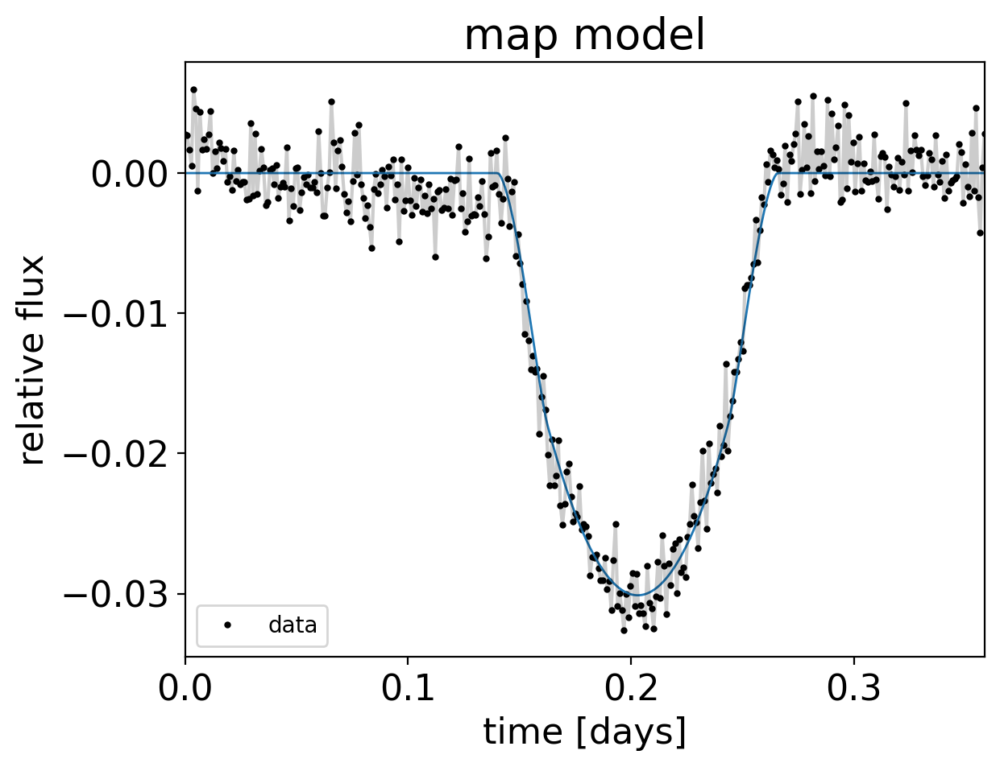

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 50 seconds.
There were 2 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.975921109751168, but should be close to 0.9. Try to increase the number of tuning steps.
There were 42 divergences after tuning. Increase `target_accept` or reparameterize.
There were 16 divergences after tuning. Increase `target_accept` or reparameterize.
There were 30 divergences after tuning. Increase `target_accept` or reparameterize.


          mean        sd    hdi_3%   hdi_97%     mcse_mean   mcse_sd  \
r     0.154719  0.000008  0.154704  0.154733  1.000000e-07  0.000000   
u[0]  1.443689  0.000482  1.442787  1.444586  3.400000e-06  0.000002   
u[1] -0.721522  0.000500 -0.722301 -0.720576  5.100000e-06  0.000004   
mean -0.000072  0.000001 -0.000074 -0.000070  0.000000e+00  0.000000   

          ess_bulk      ess_tail     r_hat  
r     17301.291130  11071.509644  1.000159  
u[0]  21255.875203  19520.254477  1.000069  
u[1]  12481.366767  10260.858471  1.000182  
mean  24137.327923  17994.800013  1.000240   <class 'pandas.core.frame.DataFrame'>
r= 0.1547188 , mean= -7.2e-05 , u= 1.4436893 -0.7215223
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305, 2.539431571960449, 2.581600785255432, 2.62376868724823, 2.6659367084503174, 2.708104372024536, 2.7502721548080444, 2.7924399375915527, 2.834607720375061, 2.8767757415771484, 2.9189438819885254, 2.961111545562744, 3.0032793283

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -2478494.716516923 -> -2333391.475042963


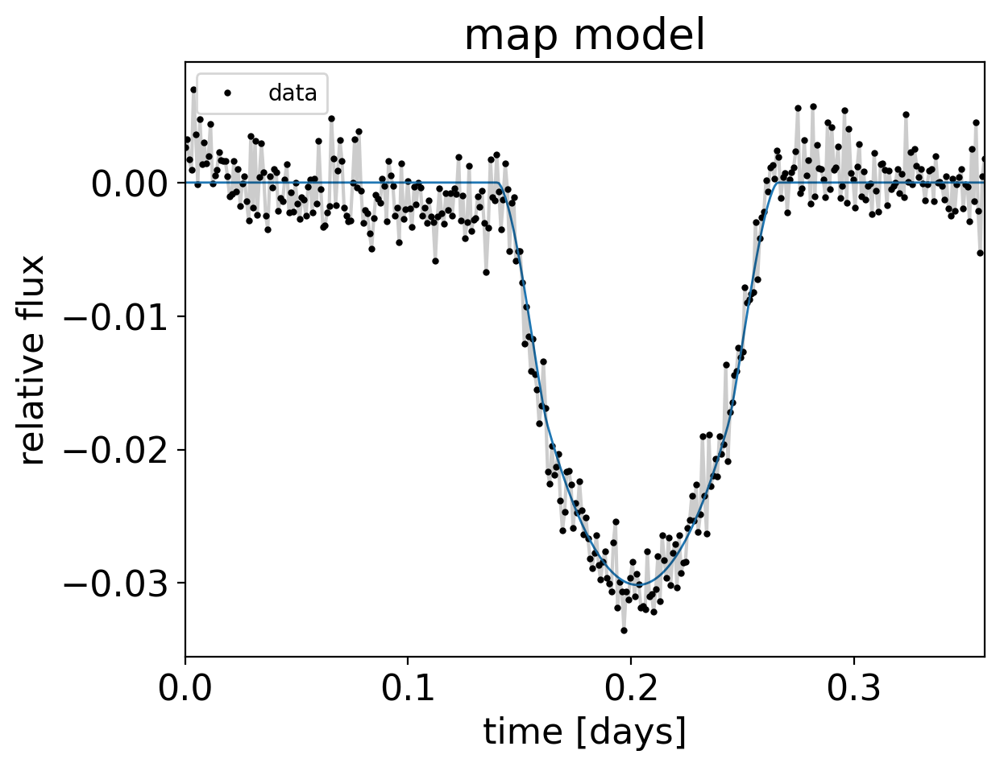

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 45 seconds.
There were 11 divergences after tuning. Increase `target_accept` or reparameterize.
There were 44 divergences after tuning. Increase `target_accept` or reparameterize.
There were 26 divergences after tuning. Increase `target_accept` or reparameterize.
There were 31 divergences after tuning. Increase `target_accept` or reparameterize.


          mean        sd    hdi_3%   hdi_97%     mcse_mean   mcse_sd  \
r     0.155089  0.000008  0.155075  0.155103  1.000000e-07  0.000000   
u[0]  1.426065  0.000537  1.425010  1.427012  4.200000e-06  0.000003   
u[1] -0.712590  0.000625 -0.713519 -0.711391  6.400000e-06  0.000005   
mean -0.000155  0.000001 -0.000158 -0.000153  0.000000e+00  0.000000   

          ess_bulk      ess_tail     r_hat  
r     17561.944163  15698.931743  1.000132  
u[0]  16251.167497  16762.719005  1.000072  
u[1]   9730.250637  12107.871191  1.000131  
mean  19710.211587  19358.088659  1.000197   <class 'pandas.core.frame.DataFrame'>
r= 0.1550891 , mean= -0.0001554 , u= 1.4260654 -0.7125903
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305, 2.539431571960449, 2.581600785255432, 2.62376868724823, 2.6659367084503174, 2.708104372024536, 2.7502721548080444, 2.7924399375915527, 2.834607720375061, 2.8767757415771484, 2.9189438819885254, 2.961111545562744, 3.00327932

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -2310817.3949389034 -> -2151236.9746935302


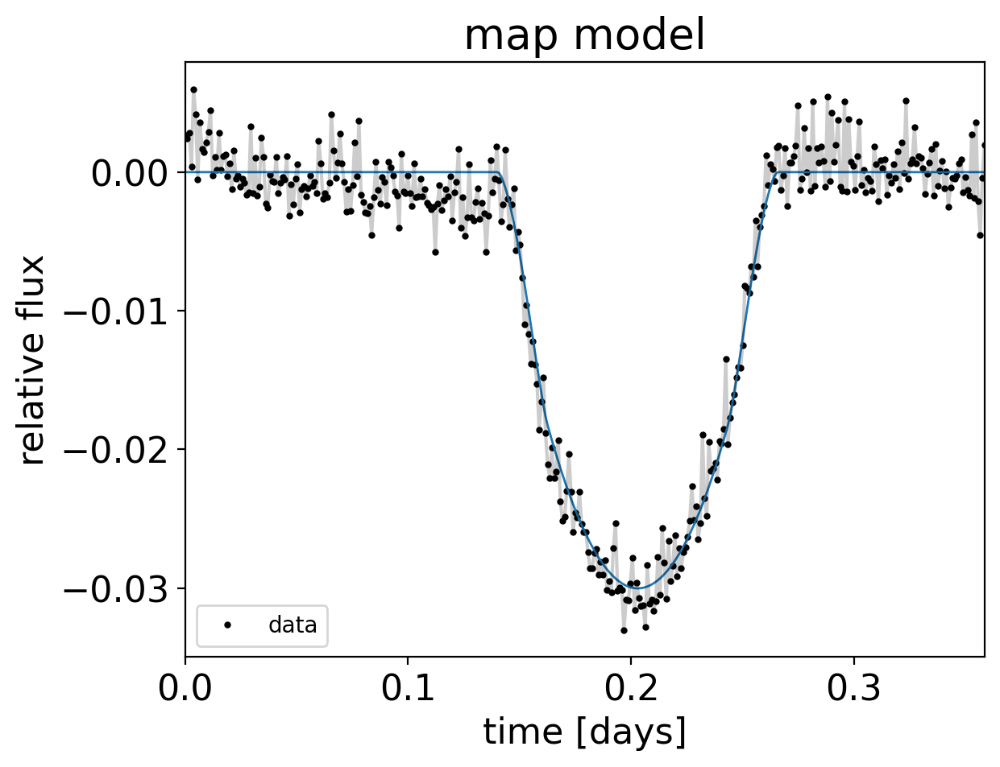

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 42 seconds.
The acceptance probability does not match the target. It is 0.9640679597767225, but should be close to 0.9. Try to increase the number of tuning steps.
There were 3 divergences after tuning. Increase `target_accept` or reparameterize.
There was 1 divergence after tuning. Increase `target_accept` or reparameterize.


          mean        sd    hdi_3%   hdi_97%  mcse_mean   mcse_sd  \
r     0.154962  0.000007  0.154949  0.154976   0.000000  0.000000   
u[0]  1.415395  0.000386  1.414670  1.416116   0.000002  0.000002   
u[1] -0.707544  0.000286 -0.708039 -0.706993   0.000002  0.000001   
mean -0.000180  0.000001 -0.000182 -0.000178   0.000000  0.000000   

          ess_bulk      ess_tail     r_hat  
r     29332.606279  20896.654303  1.000128  
u[0]  30756.253749  23986.210373  1.000193  
u[1]  28184.738079  24052.325130  1.000097  
mean  30282.509304  21735.622257  1.000060   <class 'pandas.core.frame.DataFrame'>
r= 0.1549624 , mean= -0.0001796 , u= 1.4153949 -0.7075441
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305, 2.539431571960449, 2.581600785255432, 2.62376868724823, 2.6659367084503174, 2.708104372024536, 2.7502721548080444, 2.7924399375915527, 2.834607720375061, 2.8767757415771484, 2.9189438819885254, 2.961111545562744, 3.0032793283462524, 3.045

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -2222901.714312569 -> -2122989.2770025125


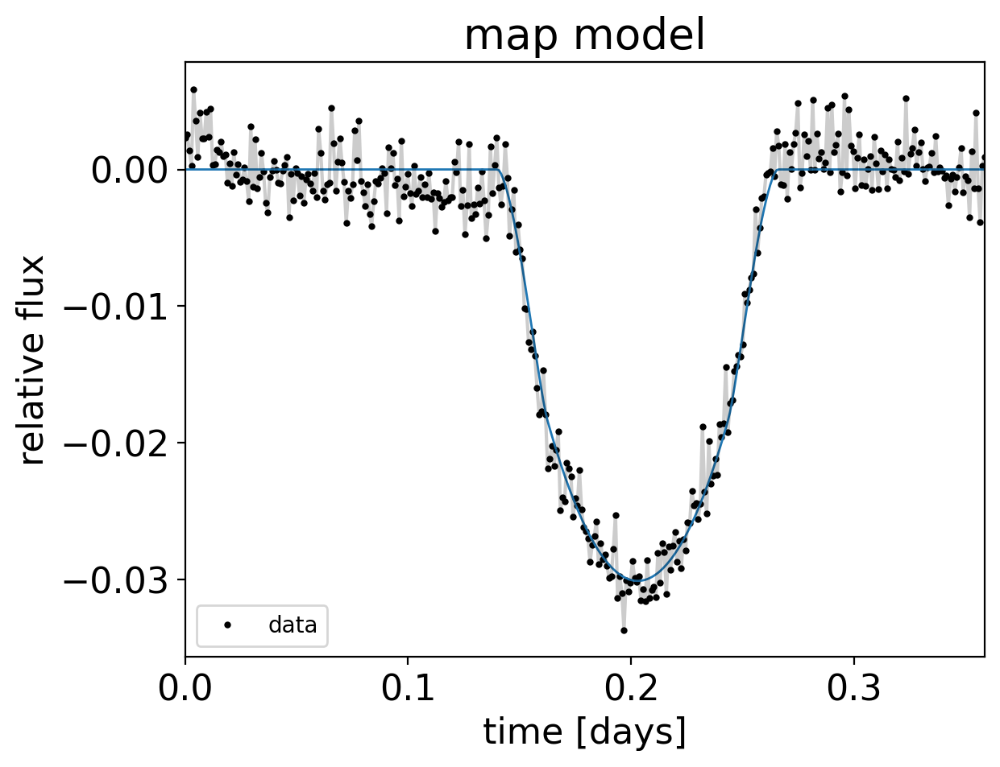

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 37 seconds.
The acceptance probability does not match the target. It is 0.9628152448025585, but should be close to 0.9. Try to increase the number of tuning steps.
The acceptance probability does not match the target. It is 0.9621008675891926, but should be close to 0.9. Try to increase the number of tuning steps.


          mean        sd    hdi_3%   hdi_97%  mcse_mean       mcse_sd  \
r     0.155340  0.000007  0.155327  0.155353   0.000000  0.000000e+00   
u[0]  1.405359  0.000353  1.404706  1.406031   0.000002  1.400000e-06   
u[1] -0.702650  0.000181 -0.703008 -0.702327   0.000001  7.000000e-07   
mean -0.000010  0.000001 -0.000012 -0.000008   0.000000  0.000000e+00   

          ess_bulk      ess_tail     r_hat  
r     33781.431188  22881.853189  1.000469  
u[0]  33046.984202  20198.959402  1.000085  
u[1]  33545.287604  21045.009943  1.000110  
mean  35042.869959  22324.707172  1.000114   <class 'pandas.core.frame.DataFrame'>
r= 0.1553398 , mean= -1e-05 , u= 1.4053589 -0.7026499
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305, 2.539431571960449, 2.581600785255432, 2.62376868724823, 2.6659367084503174, 2.708104372024536, 2.7502721548080444, 2.7924399375915527, 2.834607720375061, 2.8767757415771484, 2.9189438819885254, 2.961111545562744, 3.0032793

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -2462017.0543499133 -> -2341781.6985894935


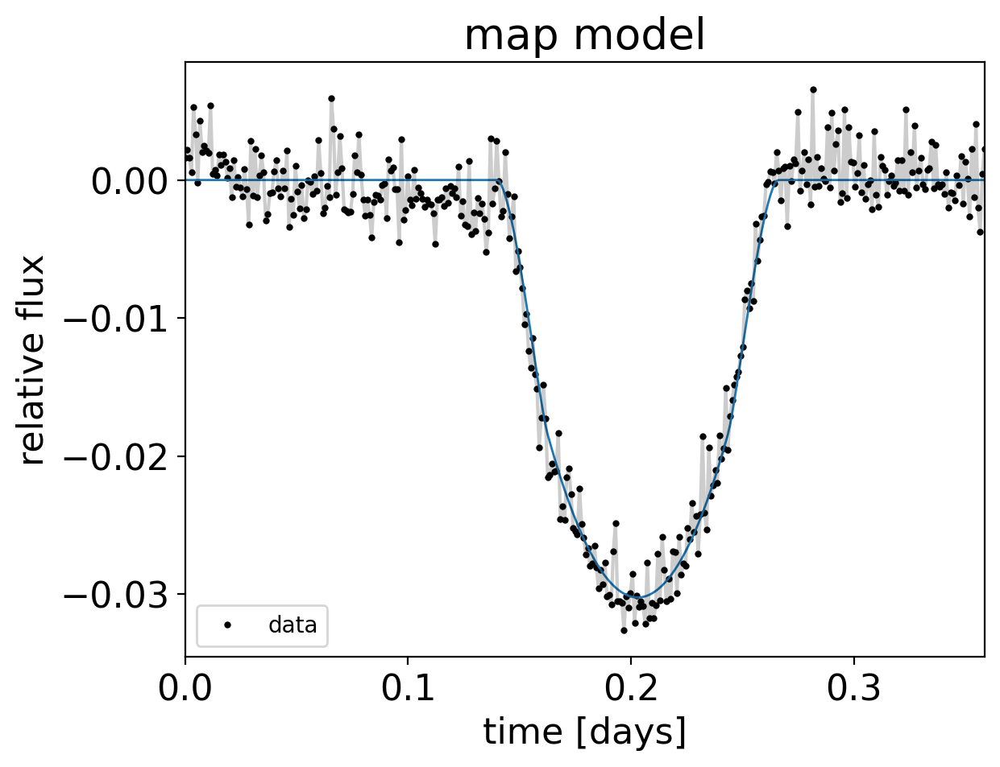

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 36 seconds.


          mean        sd    hdi_3%   hdi_97%  mcse_mean       mcse_sd  \
r     0.155581  0.000007  0.155568  0.155594   0.000000  0.000000e+00   
u[0]  1.412260  0.000344  1.411605  1.412903   0.000002  1.300000e-06   
u[1] -0.706104  0.000176 -0.706438 -0.705778   0.000001  7.000000e-07   
mean -0.000010  0.000001 -0.000012 -0.000008   0.000000  0.000000e+00   

          ess_bulk      ess_tail     r_hat  
r     31697.638605  22447.786791  1.000476  
u[0]  32625.923352  22662.555417  1.000181  
u[1]  32915.845936  23400.782048  1.000094  
mean  30275.784982  22496.126876  1.000251   <class 'pandas.core.frame.DataFrame'>
r= 0.155581 , mean= -1e-05 , u= 1.4122604 -0.706104
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305, 2.539431571960449, 2.581600785255432, 2.62376868724823, 2.6659367084503174, 2.708104372024536, 2.7502721548080444, 2.7924399375915527, 2.834607720375061, 2.8767757415771484, 2.9189438819885254, 2.961111545562744, 3.003279328

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -2581403.729528209 -> -2280834.538296854


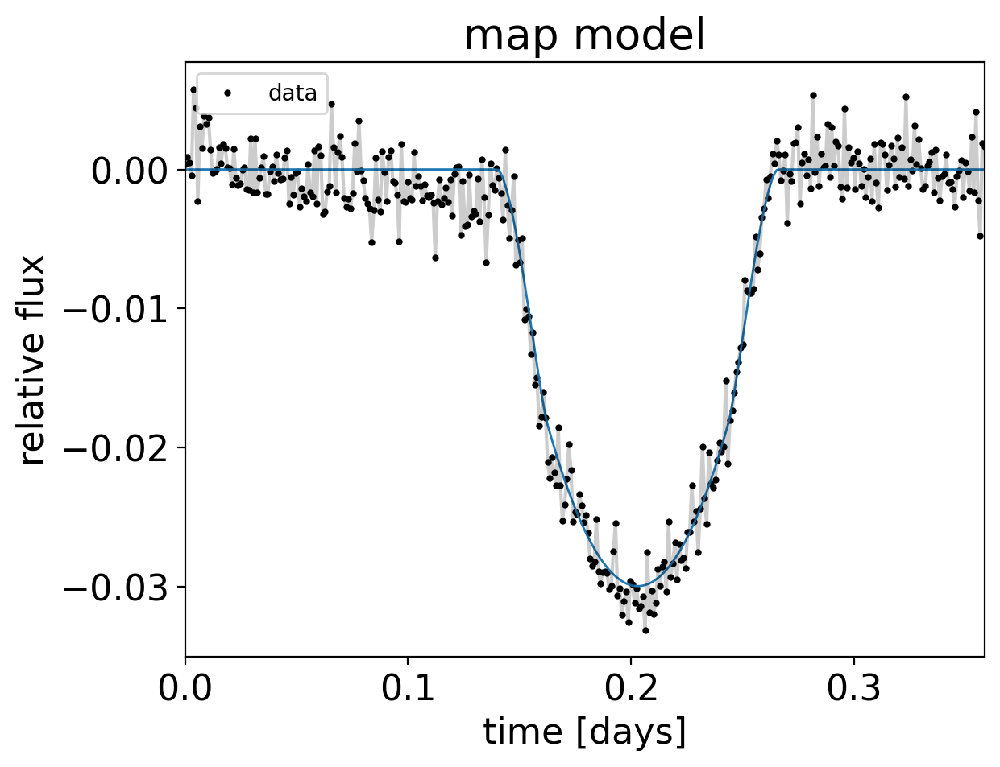

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 36 seconds.


          mean        sd    hdi_3%   hdi_97%     mcse_mean       mcse_sd  \
r     0.155093  0.000007  0.155080  0.155105  0.000000e+00  0.000000e+00   
u[0]  1.400953  0.000338  1.400329  1.401598  1.900000e-06  1.300000e-06   
u[1] -0.700461  0.000170 -0.700787 -0.700148  9.000000e-07  7.000000e-07   
mean -0.000328  0.000001 -0.000330 -0.000326  0.000000e+00  0.000000e+00   

          ess_bulk      ess_tail     r_hat  
r     32045.592784  22323.414833  1.000277  
u[0]  32959.954150  23322.109542  1.000227  
u[1]  32973.466022  23275.072106  1.000149  
mean  31050.062320  21870.863484  1.000059   <class 'pandas.core.frame.DataFrame'>
r= 0.1550928 , mean= -0.0003276 , u= 1.4009533 -0.7004609
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305, 2.539431571960449, 2.581600785255432, 2.62376868724823, 2.6659367084503174, 2.708104372024536, 2.7502721548080444, 2.7924399375915527, 2.834607720375061, 2.8767757415771484, 2.9189438819885254, 2.9611115

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -2532235.1013432257 -> -2385228.719870417


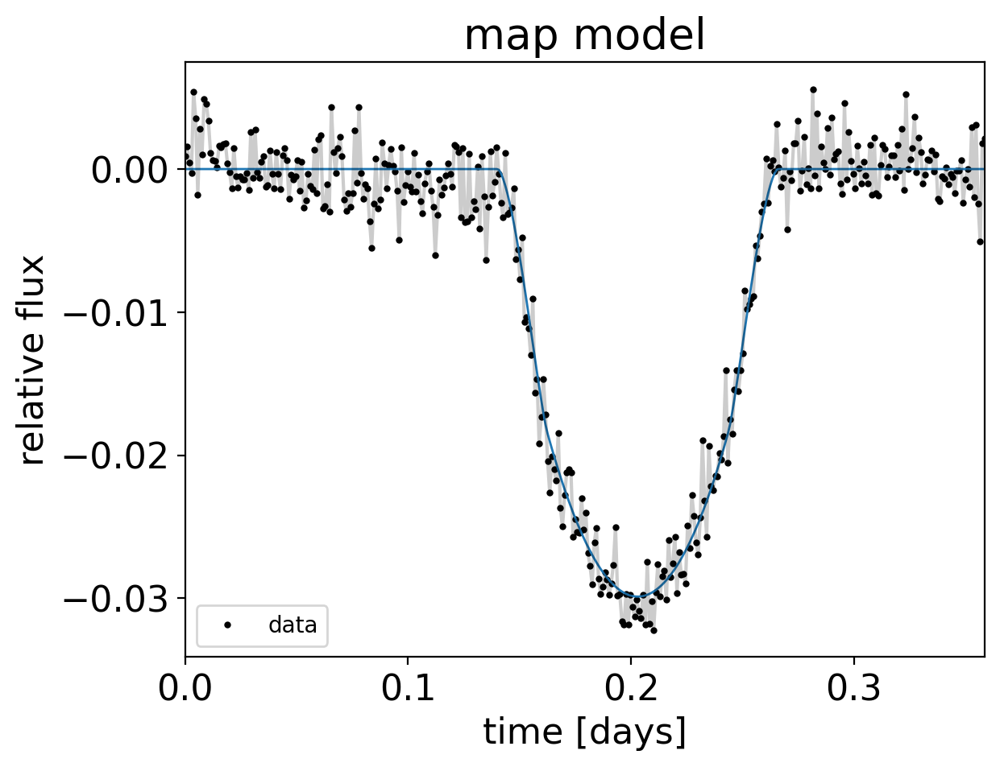

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 37 seconds.


          mean        sd    hdi_3%   hdi_97%     mcse_mean       mcse_sd  \
r     0.155157  0.000007  0.155144  0.155169  0.000000e+00  0.000000e+00   
u[0]  1.383045  0.000343  1.382396  1.383681  1.900000e-06  1.300000e-06   
u[1] -0.691511  0.000172 -0.691829 -0.691183  9.000000e-07  7.000000e-07   
mean -0.000098  0.000001 -0.000100 -0.000096  0.000000e+00  0.000000e+00   

          ess_bulk      ess_tail     r_hat  
r     30909.411951  21118.736210  1.000199  
u[0]  33197.045831  22174.573156  1.000231  
u[1]  33214.096117  22152.571993  1.000203  
mean  34013.932394  23330.470205  1.000033   <class 'pandas.core.frame.DataFrame'>
r= 0.1551565 , mean= -9.81e-05 , u= 1.3830454 -0.6915115
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305, 2.539431571960449, 2.581600785255432, 2.62376868724823, 2.6659367084503174, 2.708104372024536, 2.7502721548080444, 2.7924399375915527, 2.834607720375061, 2.8767757415771484, 2.9189438819885254, 2.96111154

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -2974674.952213237 -> -2669935.2296783472


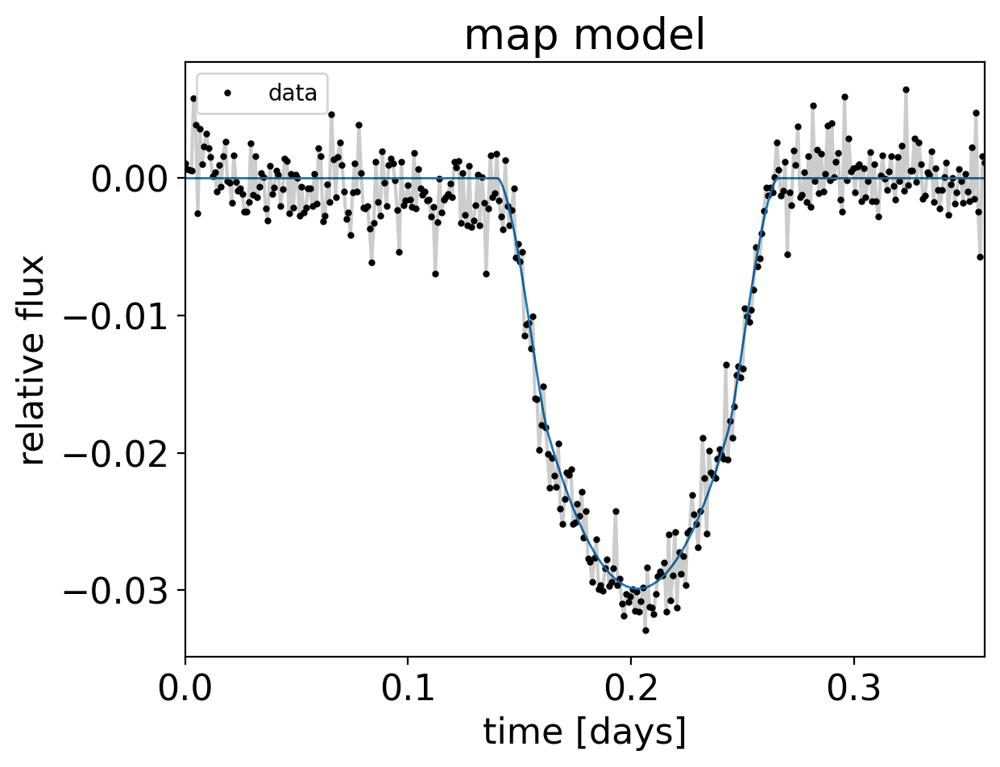

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 37 seconds.


          mean        sd    hdi_3%   hdi_97%     mcse_mean       mcse_sd  \
r     0.155118  0.000007  0.155105  0.155130  0.000000e+00  0.000000e+00   
u[0]  1.385285  0.000332  1.384644  1.385894  1.900000e-06  1.300000e-06   
u[1] -0.692633  0.000167 -0.692945 -0.692319  9.000000e-07  7.000000e-07   
mean -0.000307  0.000001 -0.000308 -0.000304  0.000000e+00  0.000000e+00   

          ess_bulk      ess_tail     r_hat  
r     31492.967888  22614.628227  1.000057  
u[0]  31623.139539  22698.391077  1.000076  
u[1]  31632.844260  23114.098018  1.000058  
mean  31202.118051  22714.569929  1.000250   <class 'pandas.core.frame.DataFrame'>
r= 0.1551178 , mean= -0.0003065 , u= 1.3852854 -0.6926331
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305, 2.539431571960449, 2.581600785255432, 2.62376868724823, 2.6659367084503174, 2.708104372024536, 2.7502721548080444, 2.7924399375915527, 2.834607720375061, 2.8767757415771484, 2.9189438819885254, 2.9611115

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -2970169.269692459 -> -2746717.3321617506


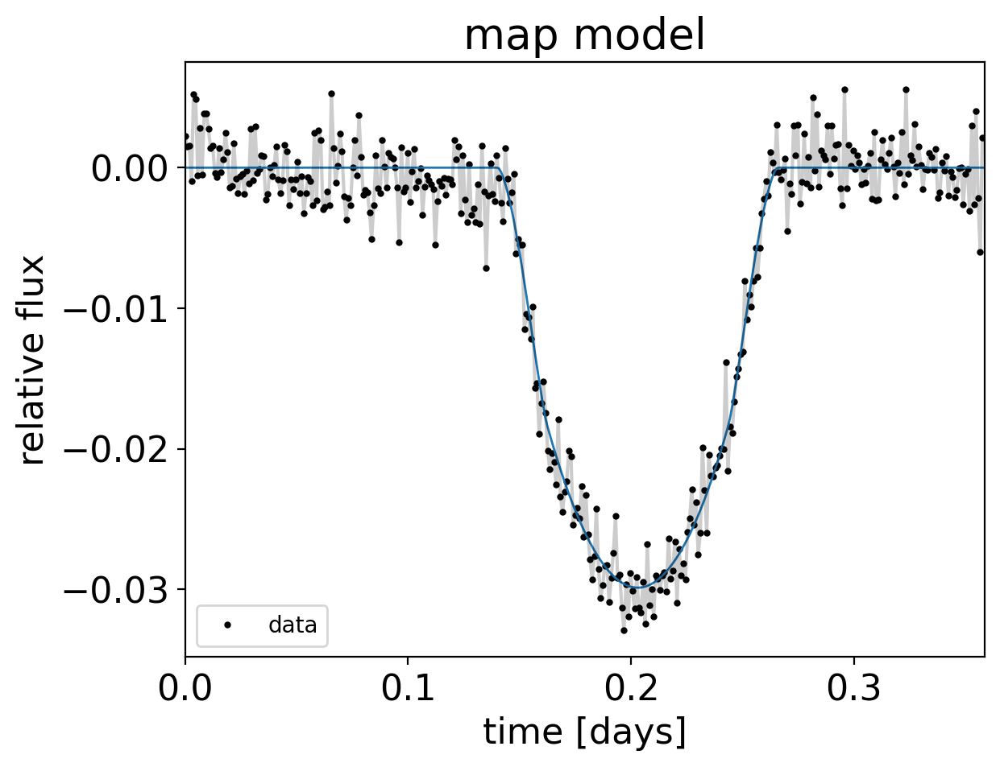

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 36 seconds.


          mean        sd    hdi_3%   hdi_97%     mcse_mean       mcse_sd  \
r     0.155077  0.000006  0.155065  0.155089  0.000000e+00  0.000000e+00   
u[0]  1.387318  0.000327  1.386723  1.387946  1.800000e-06  1.300000e-06   
u[1] -0.693644  0.000165 -0.693944 -0.693328  9.000000e-07  6.000000e-07   
mean -0.000201  0.000001 -0.000203 -0.000199  0.000000e+00  0.000000e+00   

          ess_bulk      ess_tail     r_hat  
r     33323.169625  21527.386212  1.000109  
u[0]  34039.263860  21754.064809  1.000104  
u[1]  34022.303773  22495.404717  1.000093  
mean  32873.710021  22314.890019  1.000128   <class 'pandas.core.frame.DataFrame'>
r= 0.1550771 , mean= -0.0002008 , u= 1.3873178 -0.6936439
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305, 2.539431571960449, 2.581600785255432, 2.62376868724823, 2.6659367084503174, 2.708104372024536, 2.7502721548080444, 2.7924399375915527, 2.834607720375061, 2.8767757415771484, 2.9189438819885254, 2.9611115

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -2936294.7089229673 -> -2691257.3835887243


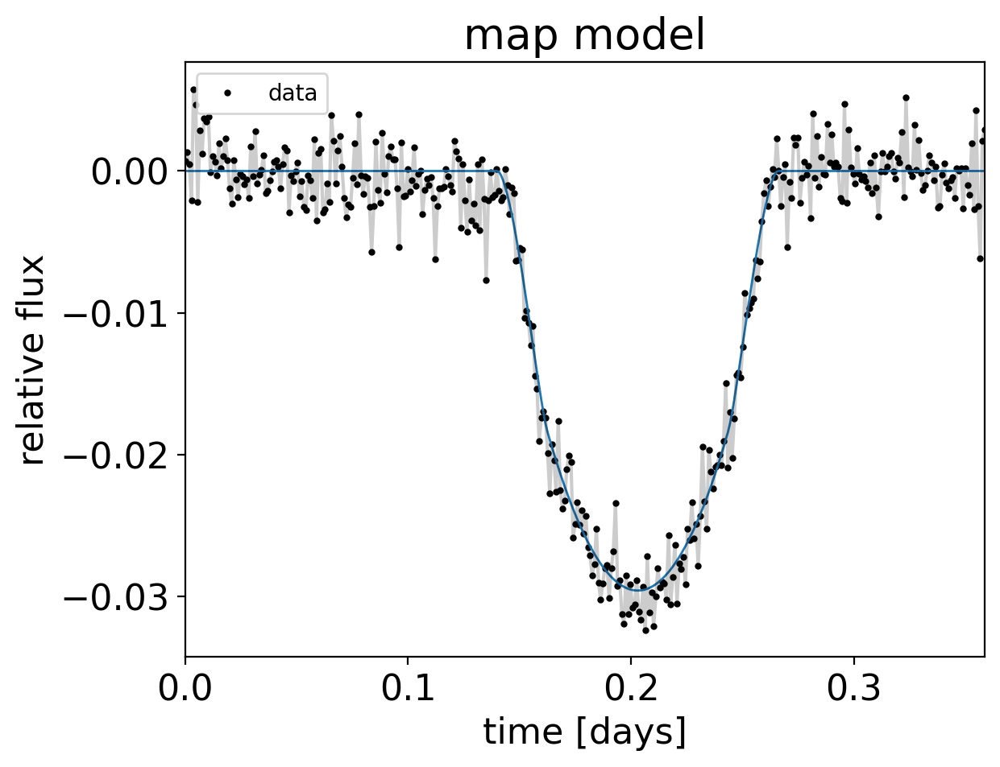

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 37 seconds.


          mean        sd    hdi_3%   hdi_97%     mcse_mean       mcse_sd  \
r     0.154523  0.000006  0.154511  0.154535  0.000000e+00  0.000000e+00   
u[0]  1.371821  0.000330  1.371191  1.372432  1.700000e-06  1.200000e-06   
u[1] -0.685901  0.000165 -0.686211 -0.685590  9.000000e-07  6.000000e-07   
mean -0.000259  0.000001 -0.000261 -0.000257  0.000000e+00  0.000000e+00   

          ess_bulk      ess_tail     r_hat  
r     37051.276843  22246.769253  1.000533  
u[0]  35707.682639  21494.841854  1.000510  
u[1]  35758.938146  21114.914895  1.000586  
mean  36756.099232  21946.279590  0.999956   <class 'pandas.core.frame.DataFrame'>
r= 0.1545232 , mean= -0.0002589 , u= 1.3718208 -0.6859011
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305, 2.539431571960449, 2.581600785255432, 2.62376868724823, 2.6659367084503174, 2.708104372024536, 2.7502721548080444, 2.7924399375915527, 2.834607720375061, 2.8767757415771484, 2.9189438819885254, 2.9611115

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -3344398.9476195304 -> -3025348.411607554


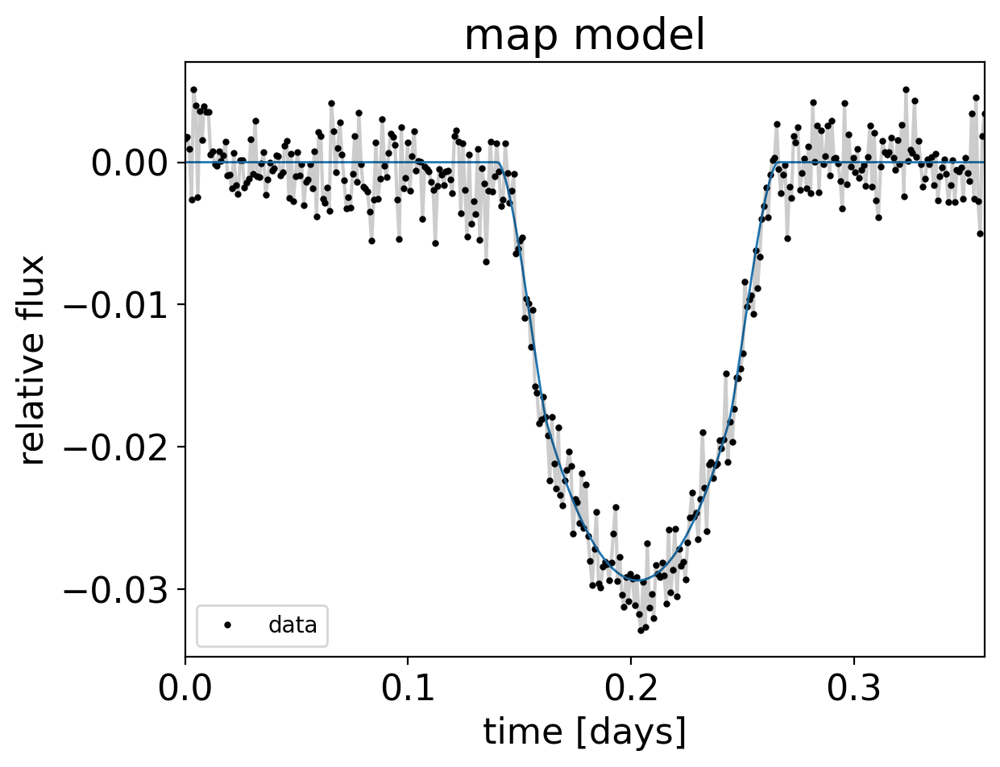

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 38 seconds.


          mean        sd    hdi_3%   hdi_97%     mcse_mean       mcse_sd  \
r     0.154425  0.000006  0.154413  0.154436  0.000000e+00  0.000000e+00   
u[0]  1.349017  0.000330  1.348381  1.349619  1.800000e-06  1.300000e-06   
u[1] -0.674502  0.000165 -0.674806 -0.674185  9.000000e-07  6.000000e-07   
mean -0.000328  0.000001 -0.000330 -0.000326  0.000000e+00  0.000000e+00   

          ess_bulk      ess_tail     r_hat  
r     33665.747519  22176.033918  1.000205  
u[0]  34487.164658  22103.555060  1.000251  
u[1]  34467.723301  22103.831833  1.000276  
mean  34652.588592  22539.157709  1.000281   <class 'pandas.core.frame.DataFrame'>
r= 0.1544246 , mean= -0.000328 , u= 1.3490174 -0.6745019
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305, 2.539431571960449, 2.581600785255432, 2.62376868724823, 2.6659367084503174, 2.708104372024536, 2.7502721548080444, 2.7924399375915527, 2.834607720375061, 2.8767757415771484, 2.9189438819885254, 2.96111154

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -3382516.3894481114 -> -3294604.4998034486


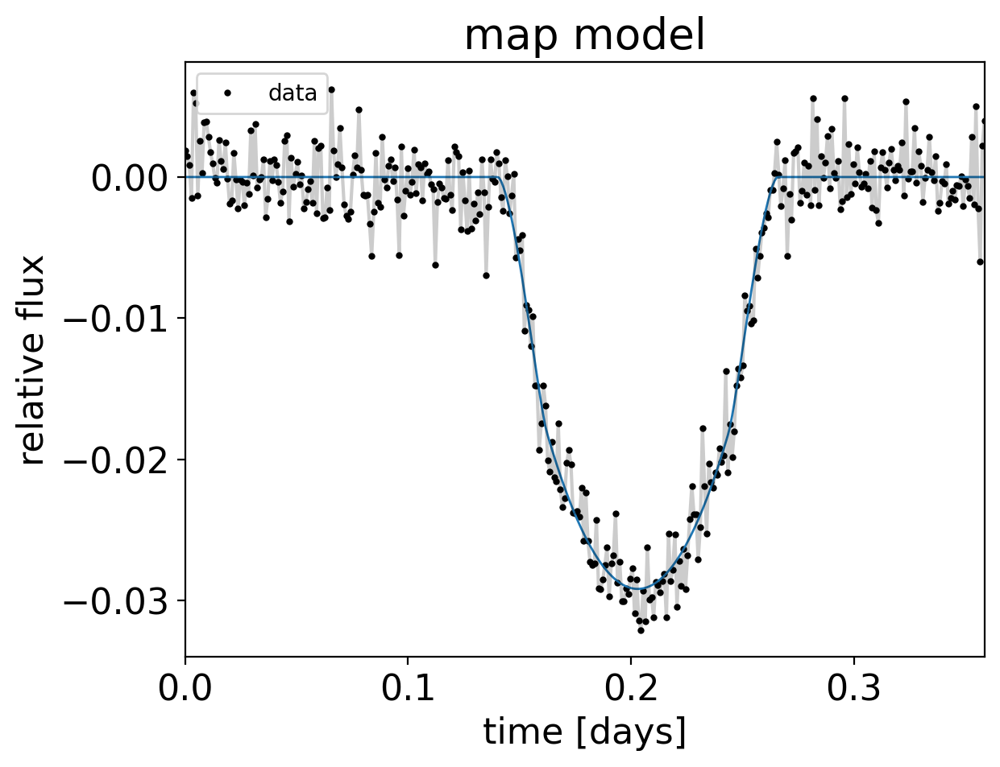

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 39 seconds.


          mean        sd    hdi_3%   hdi_97%     mcse_mean       mcse_sd  \
r     0.153637  0.000006  0.153625  0.153648  0.000000e+00  0.000000e+00   
u[0]  1.360924  0.000317  1.360315  1.361504  1.700000e-06  1.200000e-06   
u[1] -0.680454  0.000159 -0.680744 -0.680150  9.000000e-07  6.000000e-07   
mean -0.000027  0.000001 -0.000029 -0.000025  0.000000e+00  0.000000e+00   

          ess_bulk      ess_tail     r_hat  
r     35929.961133  23090.108211  1.000191  
u[0]  34437.365428  22670.337991  1.000195  
u[1]  34372.449832  22881.221673  1.000208  
mean  33349.374980  20784.314980  1.000050   <class 'pandas.core.frame.DataFrame'>
r= 0.1536368 , mean= -2.73e-05 , u= 1.3609241 -0.6804545
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305, 2.539431571960449, 2.581600785255432, 2.62376868724823, 2.6659367084503174, 2.708104372024536, 2.7502721548080444, 2.7924399375915527, 2.834607720375061, 2.8767757415771484, 2.9189438819885254, 2.96111154

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -3619096.7484640023 -> -3501040.784757094


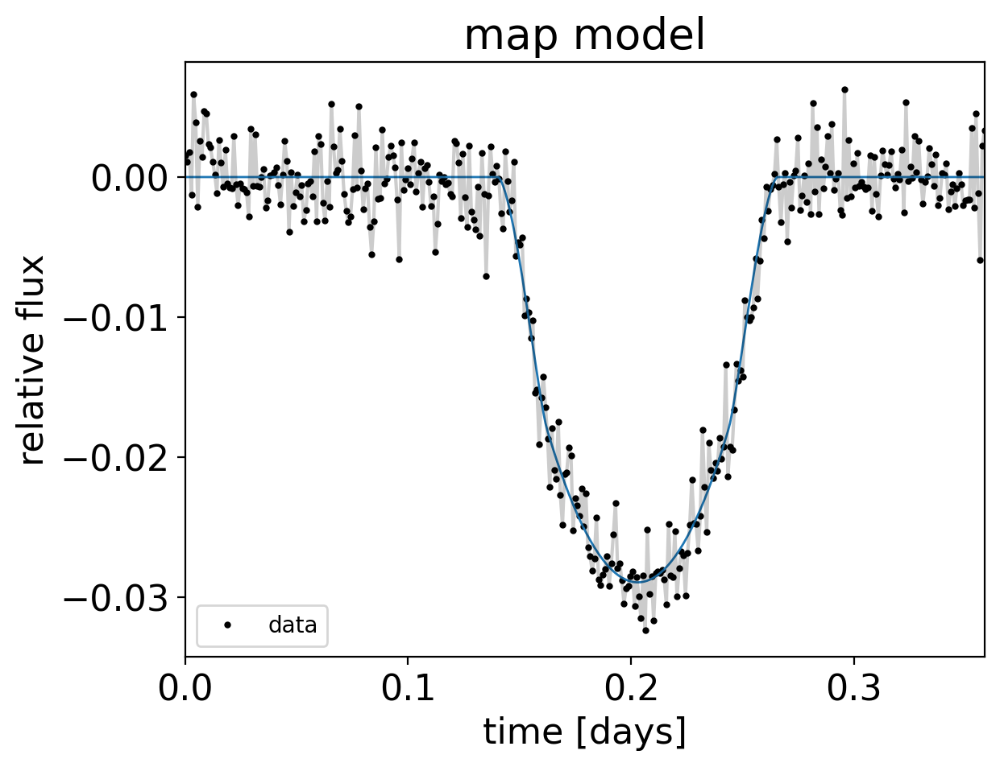

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 37 seconds.
The acceptance probability does not match the target. It is 0.961001532107711, but should be close to 0.9. Try to increase the number of tuning steps.


          mean        sd    hdi_3%   hdi_97%     mcse_mean       mcse_sd  \
r     0.153033  0.000006  0.153022  0.153045  0.000000e+00  0.000000e+00   
u[0]  1.358668  0.000323  1.358044  1.359255  1.900000e-06  1.300000e-06   
u[1] -0.679324  0.000162 -0.679620 -0.679013  9.000000e-07  7.000000e-07   
mean -0.000083  0.000001 -0.000084 -0.000081  0.000000e+00  0.000000e+00   

          ess_bulk      ess_tail     r_hat  
r     32932.168881  22248.759014  1.000165  
u[0]  30419.689639  22000.461225  1.000122  
u[1]  30232.435059  22443.886428  1.000084  
mean  32055.297172  21980.340557  1.000112   <class 'pandas.core.frame.DataFrame'>
r= 0.1530333 , mean= -8.28e-05 , u= 1.3586681 -0.6793243
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305, 2.539431571960449, 2.581600785255432, 2.62376868724823, 2.6659367084503174, 2.708104372024536, 2.7502721548080444, 2.7924399375915527, 2.834607720375061, 2.8767757415771484, 2.9189438819885254, 2.96111154

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -3751021.707701649 -> -3602219.204440939


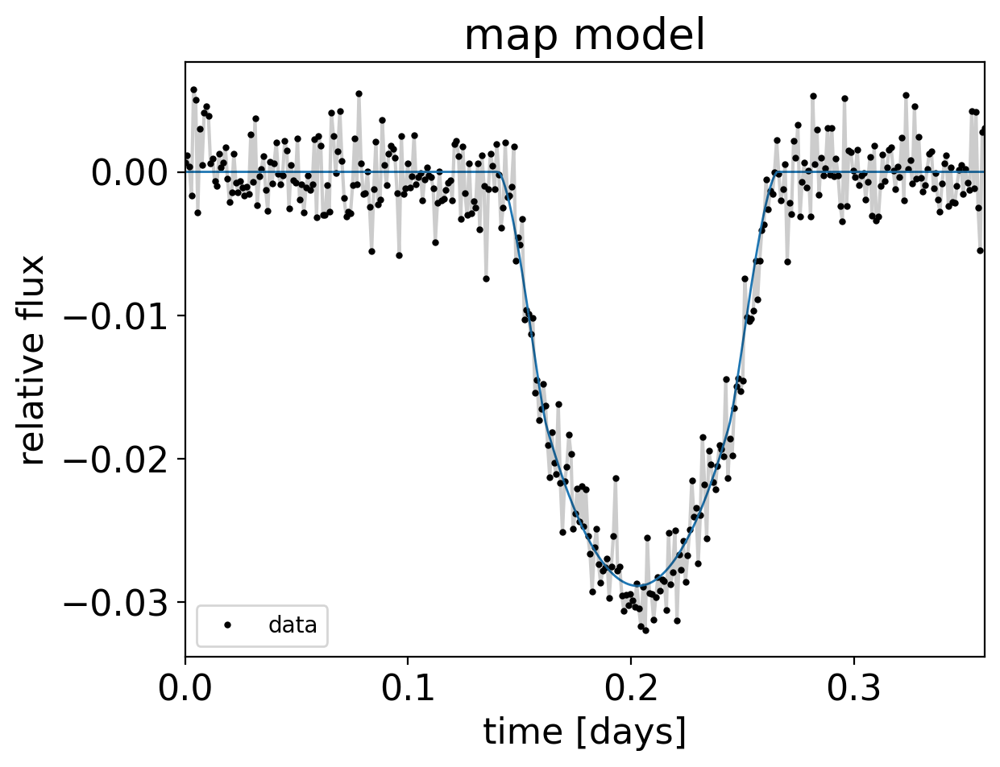

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 36 seconds.


          mean        sd    hdi_3%   hdi_97%     mcse_mean       mcse_sd  \
r     0.152731  0.000006  0.152720  0.152743  0.000000e+00  0.000000e+00   
u[0]  1.368072  0.000321  1.367465  1.368670  1.700000e-06  1.200000e-06   
u[1] -0.684030  0.000160 -0.684333 -0.683729  9.000000e-07  6.000000e-07   
mean -0.000158  0.000001 -0.000160 -0.000156  0.000000e+00  0.000000e+00   

          ess_bulk      ess_tail     r_hat  
r     31839.324087  22019.122290  1.000213  
u[0]  33931.350903  21991.868974  1.000326  
u[1]  33952.730656  22334.442780  1.000347  
mean  32041.053204  21881.201842  1.000177   <class 'pandas.core.frame.DataFrame'>
r= 0.1527312 , mean= -0.0001578 , u= 1.3680719 -0.6840302
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305, 2.539431571960449, 2.581600785255432, 2.62376868724823, 2.6659367084503174, 2.708104372024536, 2.7502721548080444, 2.7924399375915527, 2.834607720375061, 2.8767757415771484, 2.9189438819885254, 2.9611115

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -3705707.322351222 -> -3544260.9439700274


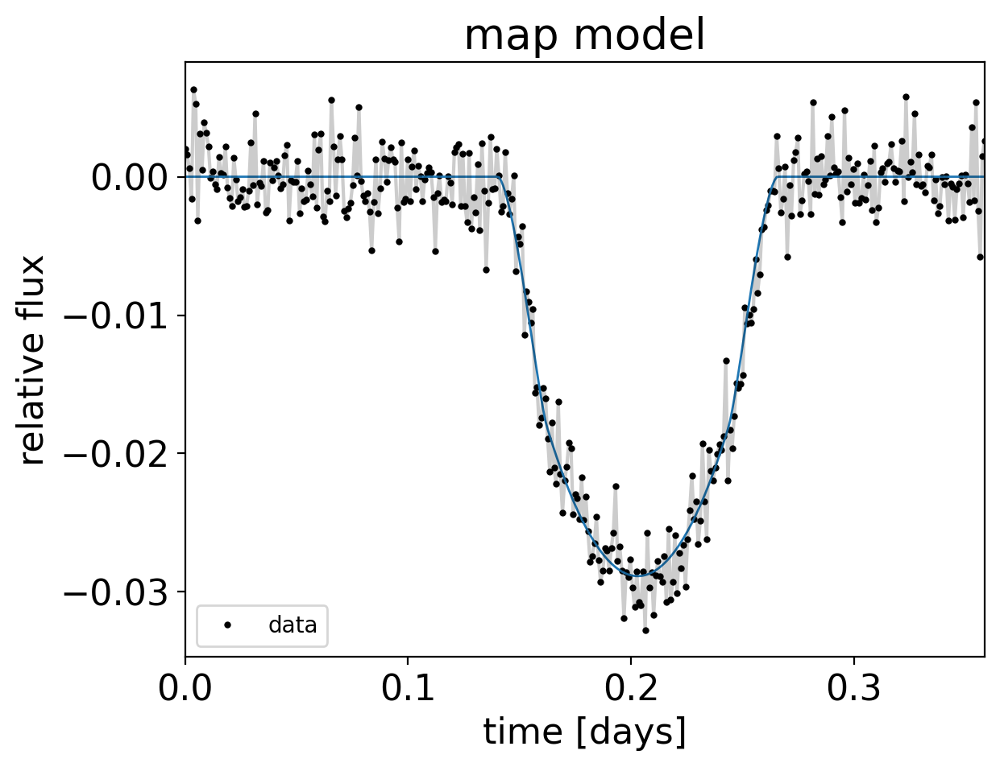

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 36 seconds.


          mean        sd    hdi_3%   hdi_97%     mcse_mean       mcse_sd  \
r     0.153049  0.000006  0.153037  0.153060  0.000000e+00  0.000000e+00   
u[0]  1.345478  0.000320  1.344855  1.346057  1.800000e-06  1.300000e-06   
u[1] -0.672732  0.000160 -0.673029 -0.672427  9.000000e-07  6.000000e-07   
mean -0.000144  0.000001 -0.000146 -0.000142  0.000000e+00  0.000000e+00   

          ess_bulk      ess_tail     r_hat  
r     32991.112576  22807.268201  1.000037  
u[0]  32239.813361  22661.179403  1.000098  
u[1]  32271.052483  22473.011768  1.000127  
mean  32603.811315  22289.035771  1.000096   <class 'pandas.core.frame.DataFrame'>
r= 0.153049 , mean= -0.0001438 , u= 1.3454779 -0.6727325
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305, 2.539431571960449, 2.581600785255432, 2.62376868724823, 2.6659367084503174, 2.708104372024536, 2.7502721548080444, 2.7924399375915527, 2.834607720375061, 2.8767757415771484, 2.9189438819885254, 2.96111154

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -19920368.763544697 -> -19532207.253410634


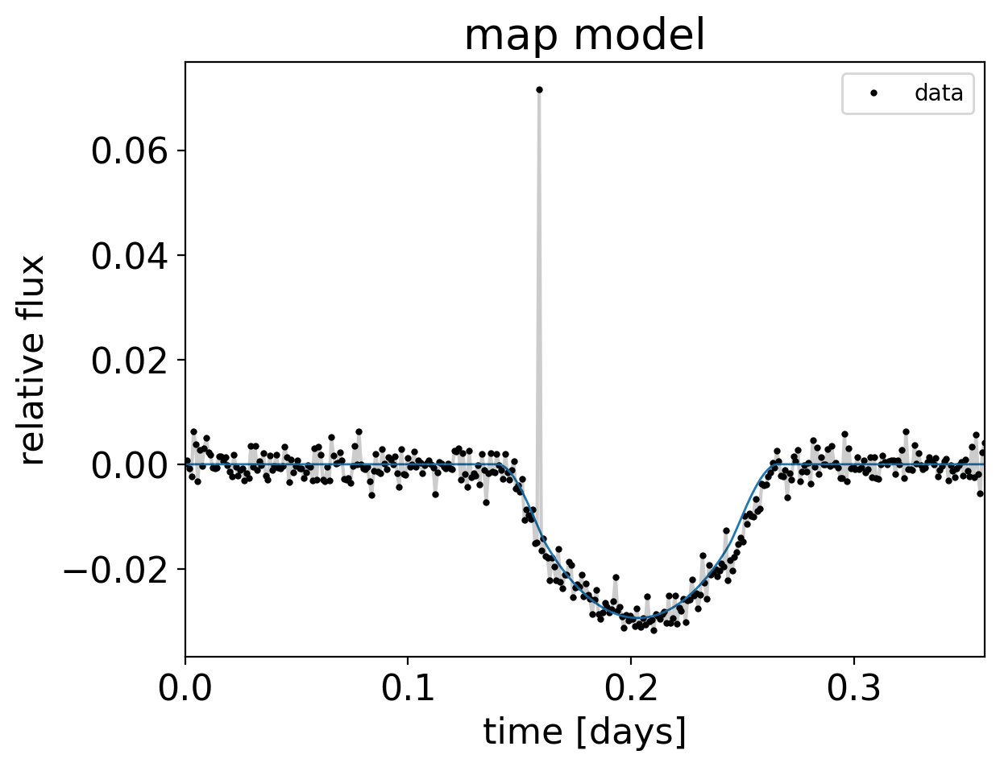

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 33 seconds.


          mean        sd    hdi_3%   hdi_97%  mcse_mean   mcse_sd  \
r     0.149434  0.000008  0.149419  0.149449   0.000000  0.000000   
u[0]  1.538942  0.001126  1.536819  1.541026   0.000006  0.000004   
u[1] -0.682015  0.001703 -0.685188 -0.678848   0.000009  0.000006   
mean -0.000221  0.000001 -0.000223 -0.000219   0.000000  0.000000   

          ess_bulk      ess_tail     r_hat  
r     34758.546988  25358.764392  1.000007  
u[0]  34474.995535  24135.372595  1.000026  
u[1]  34511.184481  24230.338478  1.000081  
mean  33947.790054  25093.161917  1.000231   <class 'pandas.core.frame.DataFrame'>
r= 0.149434 , mean= -0.0002213 , u= 1.5389416 -0.6820151
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305, 2.539431571960449, 2.581600785255432, 2.62376868724823, 2.6659367084503174, 2.708104372024536, 2.7502721548080444, 2.7924399375915527, 2.834607720375061, 2.8767757415771484, 2.9189438819885254, 2.961111545562744, 3.0032793283462524, 3.0454

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -4290194.76213687 -> -4055226.4840893587


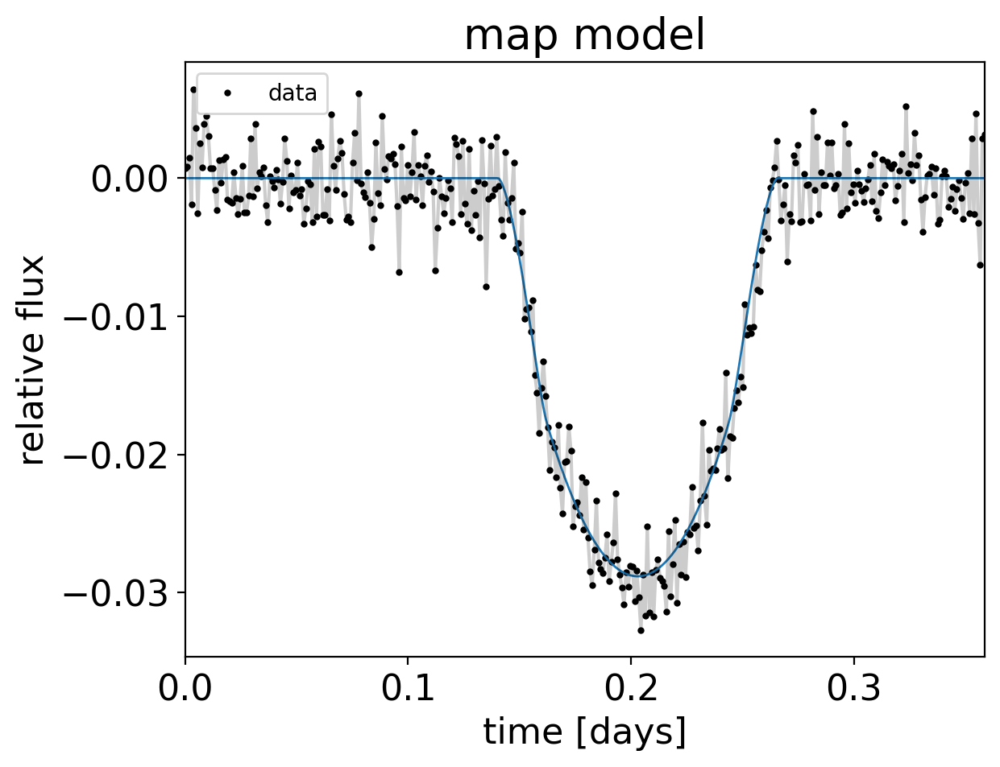

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 41 seconds.
The acceptance probability does not match the target. It is 0.9648119547545047, but should be close to 0.9. Try to increase the number of tuning steps.


          mean        sd    hdi_3%   hdi_97%     mcse_mean       mcse_sd  \
r     0.152474  0.000006  0.152463  0.152486  0.000000e+00  0.000000e+00   
u[0]  1.374994  0.000317  1.374415  1.375608  1.800000e-06  1.200000e-06   
u[1] -0.687492  0.000159 -0.687800 -0.687202  9.000000e-07  6.000000e-07   
mean -0.000302  0.000001 -0.000304 -0.000300  0.000000e+00  0.000000e+00   

          ess_bulk      ess_tail     r_hat  
r     31602.298263  21787.867283  1.000158  
u[0]  32180.795543  22696.499949  1.000104  
u[1]  32229.996589  22622.784590  1.000098  
mean  31892.832094  21712.111219  1.000177   <class 'pandas.core.frame.DataFrame'>
r= 0.1524743 , mean= -0.0003018 , u= 1.374994 -0.6874923
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305, 2.539431571960449, 2.581600785255432, 2.62376868724823, 2.6659367084503174, 2.708104372024536, 2.7502721548080444, 2.7924399375915527, 2.834607720375061, 2.8767757415771484, 2.9189438819885254, 2.96111154

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -3985644.0448571695 -> -3807487.4727384276


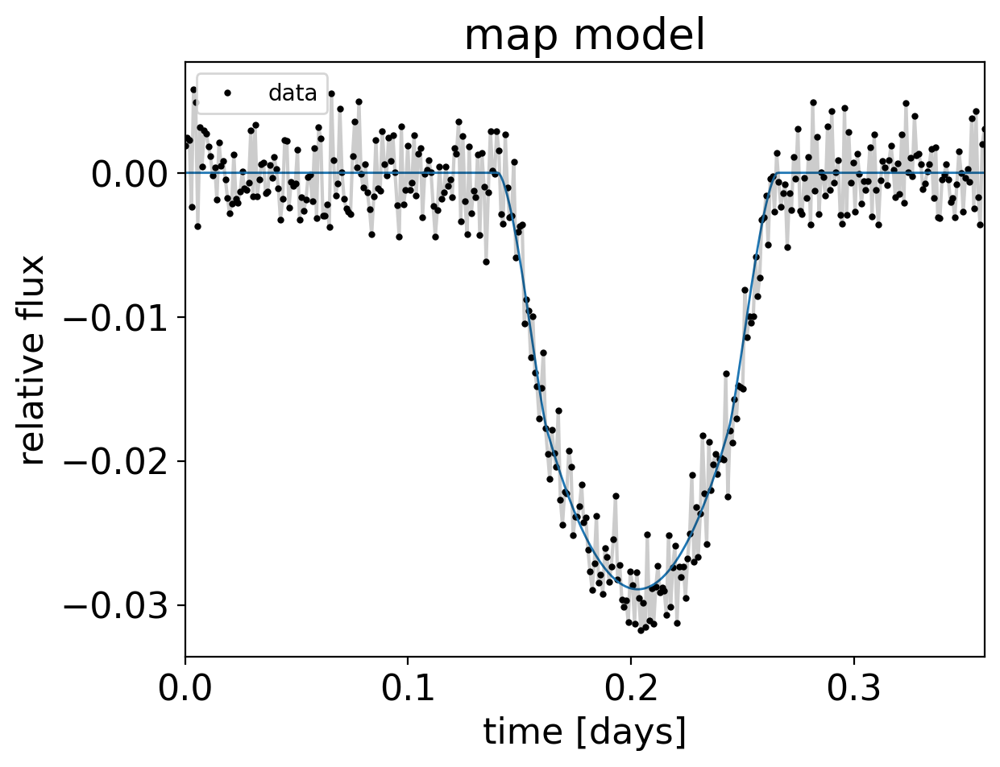

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 37 seconds.


          mean        sd    hdi_3%   hdi_97%     mcse_mean       mcse_sd  \
r     0.152790  0.000006  0.152779  0.152802  0.000000e+00  0.000000e+00   
u[0]  1.371770  0.000318  1.371183  1.372378  1.800000e-06  1.300000e-06   
u[1] -0.685878  0.000159 -0.686181 -0.685583  9.000000e-07  6.000000e-07   
mean -0.000216  0.000001 -0.000218 -0.000215  0.000000e+00  0.000000e+00   

          ess_bulk      ess_tail     r_hat  
r     33238.595271  21503.203466  1.000025  
u[0]  32181.991664  21021.671764  1.000188  
u[1]  32202.410512  21360.958632  1.000185  
mean  32839.124384  22555.043965  0.999996   <class 'pandas.core.frame.DataFrame'>
r= 0.1527904 , mean= -0.0002163 , u= 1.3717701 -0.6858782
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305, 2.539431571960449, 2.581600785255432, 2.62376868724823, 2.6659367084503174, 2.708104372024536, 2.7502721548080444, 2.7924399375915527, 2.834607720375061, 2.8767757415771484, 2.9189438819885254, 2.9611115

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -4355759.351676043 -> -4304622.259174649


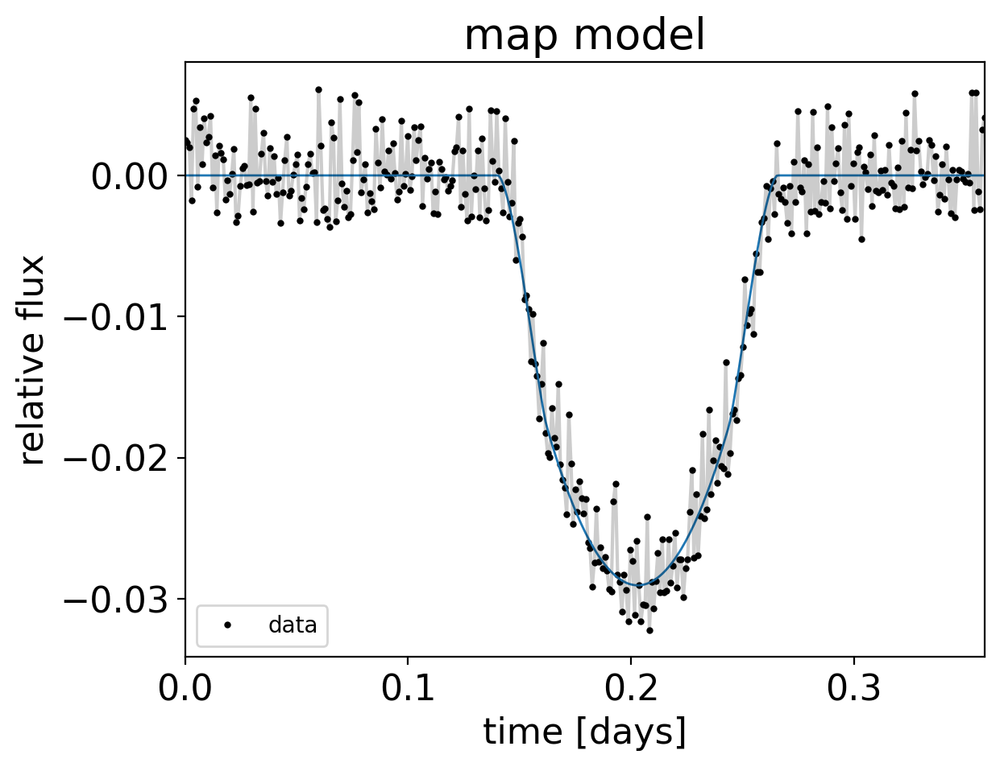

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 37 seconds.


          mean        sd    hdi_3%   hdi_97%     mcse_mean       mcse_sd  \
r     0.152991  0.000006  0.152980  0.153003  0.000000e+00  0.000000e+00   
u[0]  1.381167  0.000315  1.380576  1.381757  1.800000e-06  1.300000e-06   
u[1] -0.690577  0.000158 -0.690868 -0.690276  9.000000e-07  6.000000e-07   
mean  0.000222  0.000001  0.000220  0.000224  0.000000e+00  0.000000e+00   

          ess_bulk      ess_tail     r_hat  
r     31708.207358  21817.906661  1.000129  
u[0]  31755.122331  22321.216934  1.000044  
u[1]  31747.065087  22159.788219  1.000058  
mean  31501.700577  22171.401109  1.000000   <class 'pandas.core.frame.DataFrame'>
r= 0.1529912 , mean= 0.0002223 , u= 1.3811667 -0.6905772
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305, 2.539431571960449, 2.581600785255432, 2.62376868724823, 2.6659367084503174, 2.708104372024536, 2.7502721548080444, 2.7924399375915527, 2.834607720375061, 2.8767757415771484, 2.9189438819885254, 2.96111154

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -5856192.314897598 -> -5651286.454222052


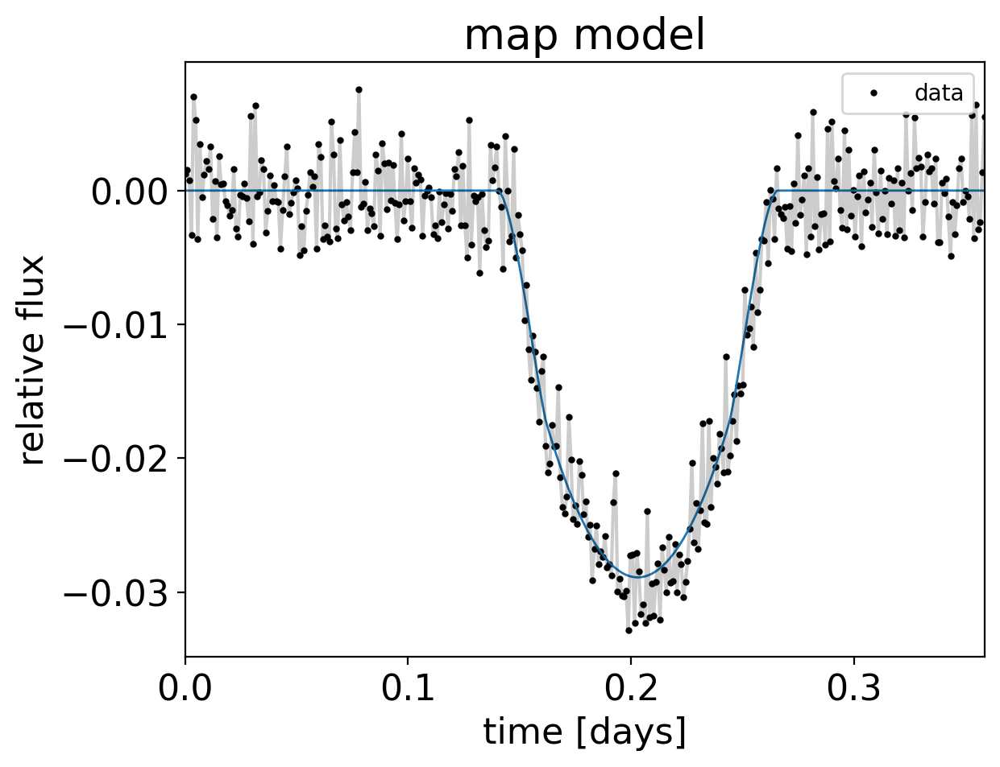

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 36 seconds.


          mean        sd    hdi_3%   hdi_97%     mcse_mean       mcse_sd  \
r     0.152169  0.000006  0.152158  0.152180  0.000000e+00  0.000000e+00   
u[0]  1.404881  0.000312  1.404286  1.405459  1.700000e-06  1.200000e-06   
u[1] -0.702435  0.000156 -0.702727 -0.702139  8.000000e-07  6.000000e-07   
mean -0.000292  0.000001 -0.000294 -0.000290  0.000000e+00  0.000000e+00   

          ess_bulk      ess_tail     r_hat  
r     33384.174741  23339.673596  1.000231  
u[0]  34667.875195  21852.865030  1.000109  
u[1]  34625.802847  21600.555168  1.000081  
mean  32977.564938  21267.364910  1.000059   <class 'pandas.core.frame.DataFrame'>
r= 0.152169 , mean= -0.0002917 , u= 1.4048814 -0.702435
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305, 2.539431571960449, 2.581600785255432, 2.62376868724823, 2.6659367084503174, 2.708104372024536, 2.7502721548080444, 2.7924399375915527, 2.834607720375061, 2.8767757415771484, 2.9189438819885254, 2.961111545

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -12913352.70632371 -> -12650219.657086091


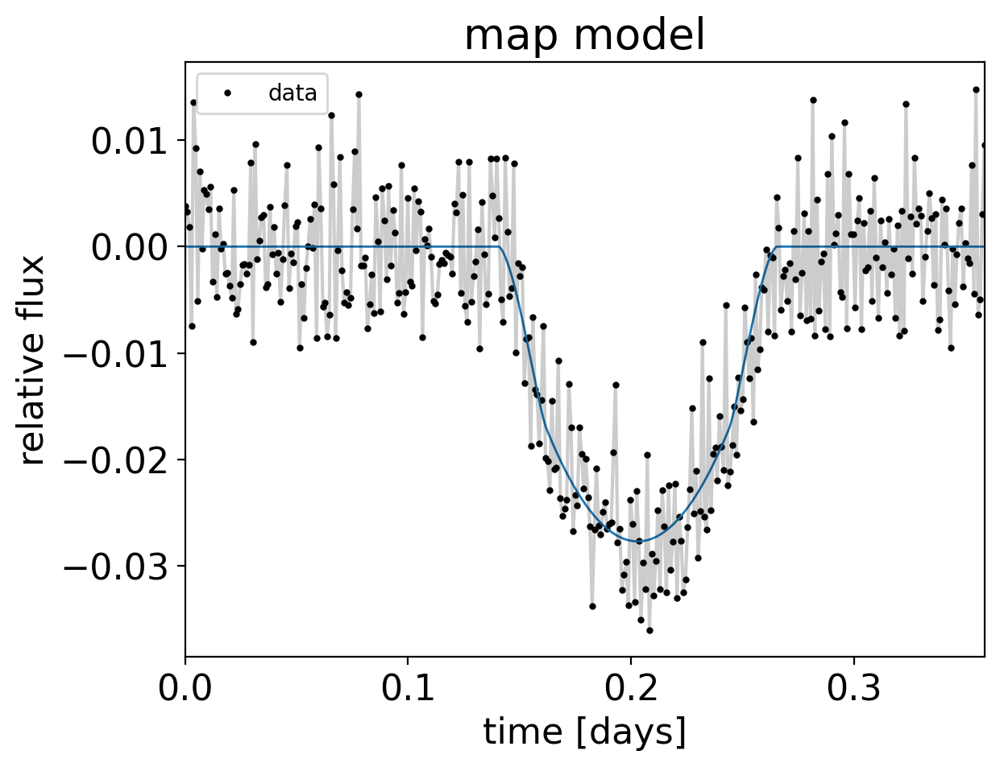

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 37 seconds.


          mean        sd    hdi_3%   hdi_97%  mcse_mean       mcse_sd  \
r     0.149636  0.000008  0.149621  0.149651   0.000000  0.000000e+00   
u[0]  1.359844  0.000426  1.359067  1.360655   0.000002  1.700000e-06   
u[1] -0.679917  0.000213 -0.680314 -0.679519   0.000001  8.000000e-07   
mean -0.000265  0.000001 -0.000267 -0.000262   0.000000  0.000000e+00   

          ess_bulk      ess_tail     r_hat  
r     33144.553864  22799.604788  0.999948  
u[0]  33204.221630  23231.160838  1.000142  
u[1]  33264.546165  23137.598617  1.000166  
mean  33431.669874  23283.348118  1.000356   <class 'pandas.core.frame.DataFrame'>
r= 0.1496359 , mean= -0.0002648 , u= 1.3598445 -0.6799166
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305, 2.539431571960449, 2.581600785255432, 2.62376868724823, 2.6659367084503174, 2.708104372024536, 2.7502721548080444, 2.7924399375915527, 2.834607720375061, 2.8767757415771484, 2.9189438819885254, 2.961111545562744, 3.003

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -25315388.049040414 -> -23863580.10055602


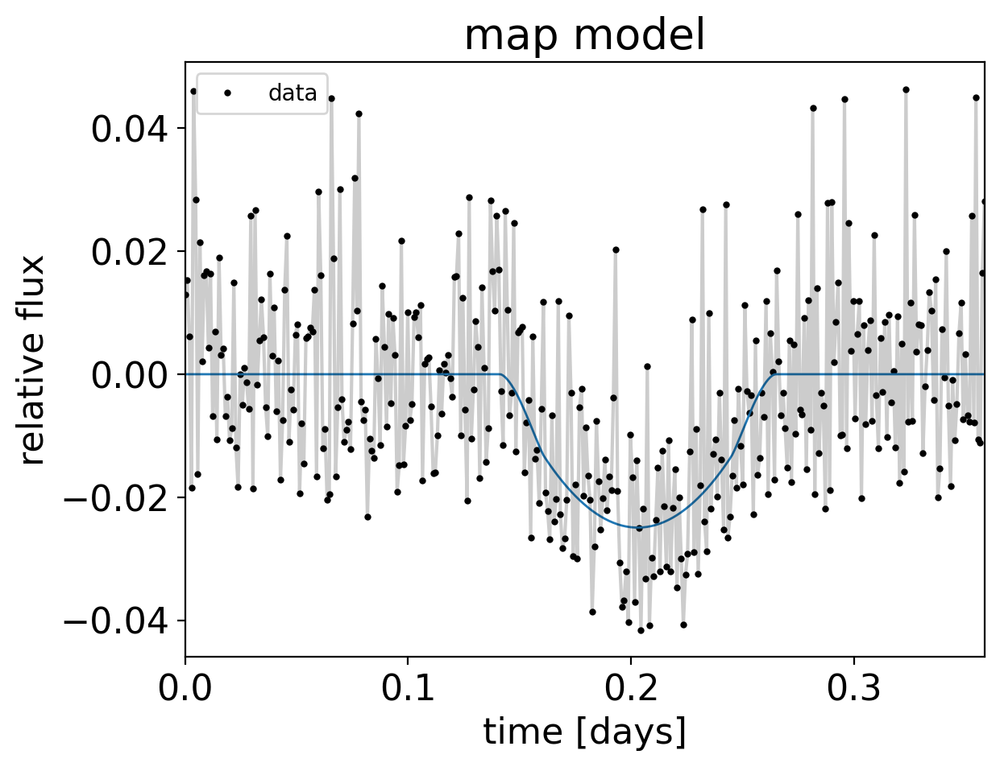

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 37 seconds.


          mean        sd    hdi_3%   hdi_97%     mcse_mean       mcse_sd  \
r     0.139322  0.000018  0.139288  0.139354  1.000000e-07  1.000000e-07   
u[0]  1.527500  0.000889  1.525853  1.529181  4.800000e-06  3.400000e-06   
u[1] -0.763740  0.000444 -0.764576 -0.762912  2.400000e-06  1.700000e-06   
mean  0.001998  0.000003  0.001993  0.002003  0.000000e+00  0.000000e+00   

          ess_bulk      ess_tail     r_hat  
r     34029.611200  22747.301643  1.000154  
u[0]  33870.621372  21985.942737  1.000080  
u[1]  33856.857990  21787.884593  1.000080  
mean  33374.450278  22397.802273  1.000109   <class 'pandas.core.frame.DataFrame'>
r= 0.1393219 , mean= 0.0019979 , u= 1.5275003 -0.7637403
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305, 2.539431571960449, 2.581600785255432, 2.62376868724823, 2.6659367084503174, 2.708104372024536, 2.7502721548080444, 2.7924399375915527, 2.834607720375061, 2.8767757415771484, 2.9189438819885254, 2.96111154

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -20961274.752368253 -> -20050229.78875216


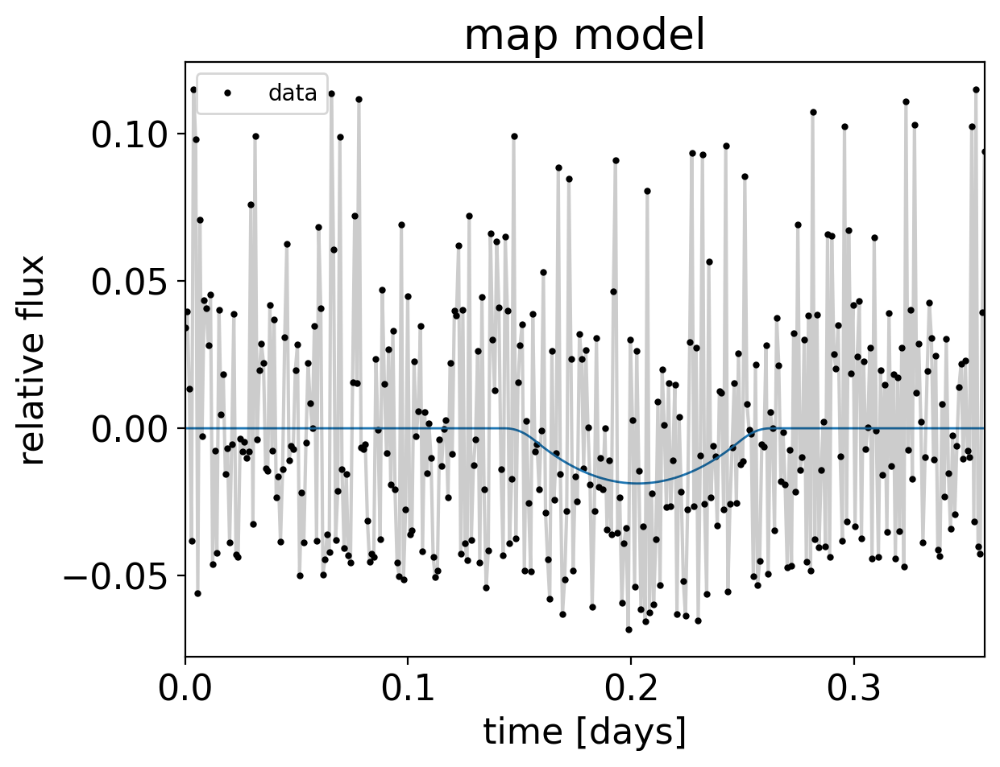

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 36 seconds.


          mean        sd    hdi_3%   hdi_97%     mcse_mean       mcse_sd  \
r     0.113432  0.000065  0.113313  0.113559  4.000000e-07  3.000000e-07   
u[0]  1.971647  0.002784  1.966424  1.976870  1.590000e-05  1.130000e-05   
u[1] -0.985787  0.001393 -0.988433 -0.983207  8.000000e-06  5.600000e-06   
mean  0.004479  0.000008  0.004465  0.004494  0.000000e+00  0.000000e+00   

          ess_bulk      ess_tail     r_hat  
r     30181.643718  22164.293929  0.999998  
u[0]  30675.967738  19219.680481  1.000099  
u[1]  30648.454946  19339.907659  1.000095  
mean  32035.970570  22241.368479  0.999955   <class 'pandas.core.frame.DataFrame'>
r= 0.1134324 , mean= 0.0044794 , u= 1.9716468 -0.9857869
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305, 2.539431571960449, 2.581600785255432, 2.62376868724823, 2.6659367084503174, 2.708104372024536, 2.7502721548080444, 2.7924399375915527, 2.834607720375061, 2.8767757415771484, 2.9189438819885254, 2.96111154

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -3370874.6754774544 -> -3320003.3609650917


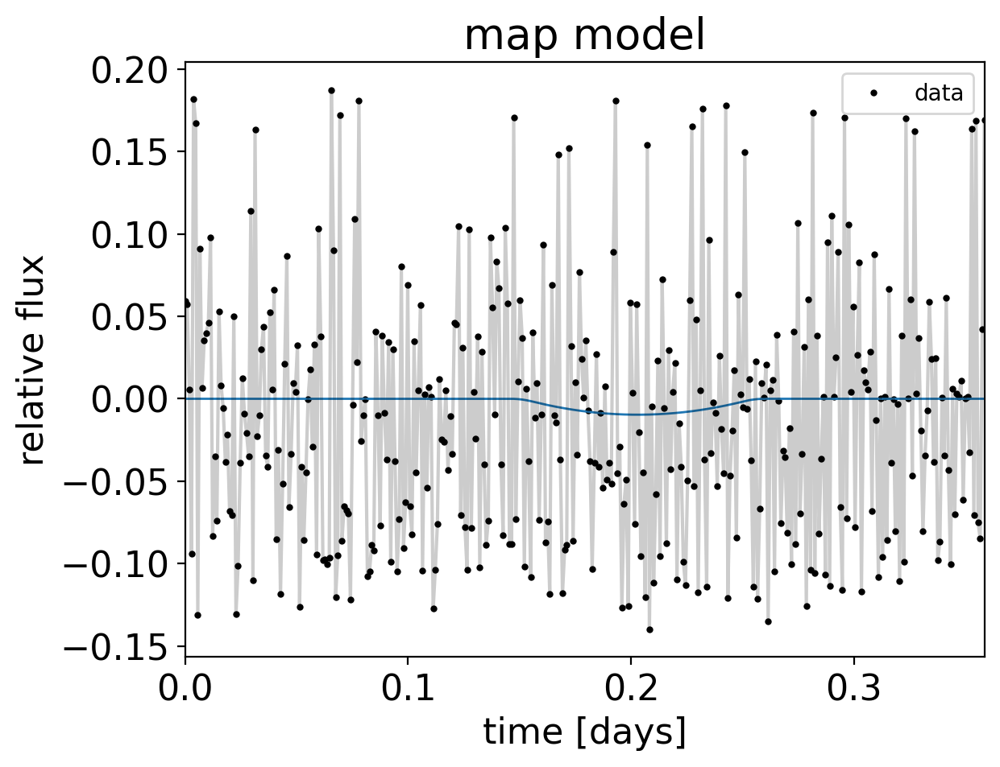

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 37 seconds.


          mean        sd    hdi_3%   hdi_97%     mcse_mean       mcse_sd  \
r     0.080929  0.000365  0.080241  0.081611  2.000000e-06  1.400000e-06   
u[0]  1.999176  0.000580  1.998138  1.999977  3.200000e-06  2.300000e-06   
u[1] -0.999354  0.000493 -0.999984 -0.998471  2.700000e-06  1.900000e-06   
mean -0.009377  0.000034 -0.009443 -0.009317  2.000000e-07  1.000000e-07   

          ess_bulk      ess_tail     r_hat  
r     32966.973298  21958.401372  1.000141  
u[0]  30636.406330  20867.432188  1.000019  
u[1]  28739.412339  19882.767895  0.999996  
mean  30521.926428  21578.076691  1.000293   <class 'pandas.core.frame.DataFrame'>
r= 0.0809294 , mean= -0.0093767 , u= 1.9991759 -0.9993535
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305, 2.539431571960449, 2.581600785255432, 2.62376868724823, 2.6659367084503174, 2.708104372024536, 2.7502721548080444, 2.7924399375915527, 2.834607720375061, 2.8767757415771484, 2.9189438819885254, 2.9611115

optimizing logp for variables: [r, u, mean]


message: Desired error not necessarily achieved due to precision loss.
logp: -220875.42555946298 -> -216822.65052715852


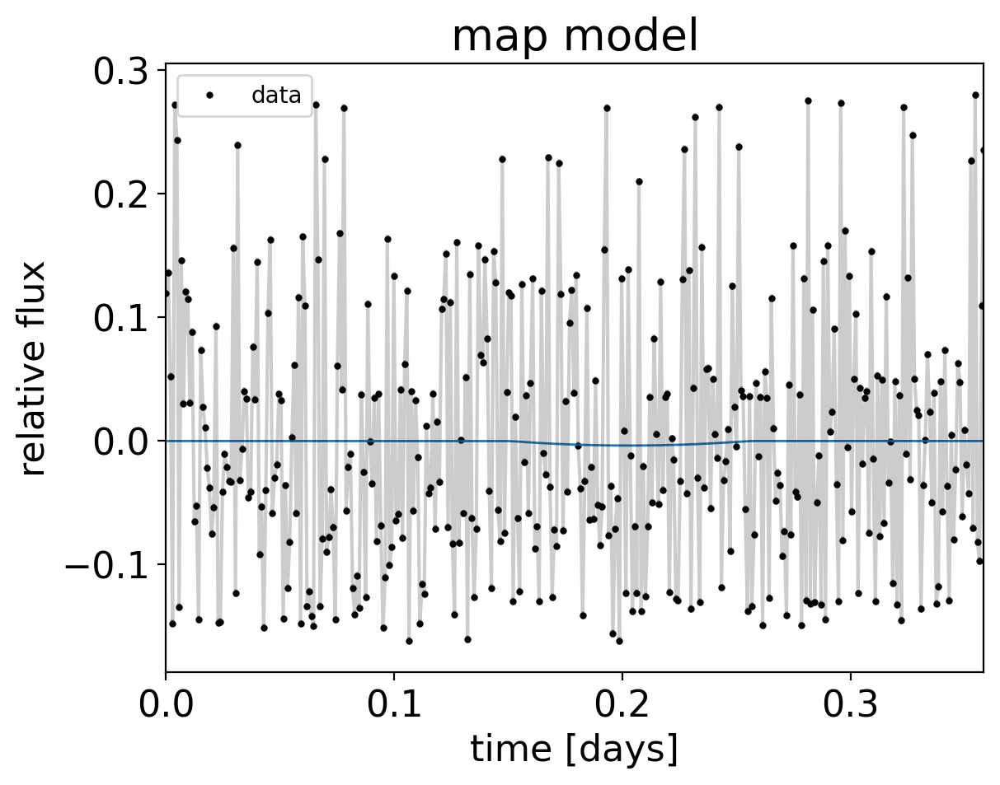

Multiprocess sampling (4 chains in 8 jobs)
NUTS: [r, u, mean]



🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppf
🌈 Warning: overflow encountered in _beta_ppfSampling 4 chains for 6_000 tune and 8_000 draw iterations (24_000 + 32_000 draws total) took 37 seconds.


          mean        sd    hdi_3%   hdi_97%  mcse_mean       mcse_sd  \
r     0.049354  0.003422  0.042918  0.055789   0.000020  1.410000e-05   
u[0]  1.974983  0.018622  1.941766  1.999623   0.000102  7.250000e-05   
u[1] -0.980079  0.016153 -0.999827 -0.951495   0.000089  6.270000e-05   
mean  0.004300  0.000188  0.003954  0.004659   0.000001  8.000000e-07   

          ess_bulk      ess_tail     r_hat  
r     30377.165946  19598.142715  1.000119  
u[0]  31231.729423  20261.017266  1.000158  
u[1]  29515.867463  19631.051795  1.000073  
mean  31349.765801  22113.372102  0.999976   <class 'pandas.core.frame.DataFrame'>
r= 0.0493536 , mean= 0.0043005 , u= 1.974983 -0.9800787
{'wavelength': [2.370760440826416, 2.4129284620285034, 2.4550962448120117, 2.4972639083862305, 2.539431571960449, 2.581600785255432, 2.62376868724823, 2.6659367084503174, 2.708104372024536, 2.7502721548080444, 2.7924399375915527, 2.834607720375061, 2.8767757415771484, 2.9189438819885254, 2.961111545562744, 3.00327


🌈 Warning: All-NaN slice encounteredoptimizing logp for variables: [obs_missing, r, u, mean]



🌈 Warning: invalid value encountered in double_scalars

message: Desired error not necessarily achieved due to precision loss.
logp: -inf -> -inf
final logp not finite, returning initial point
this suggests that something is wrong with the model


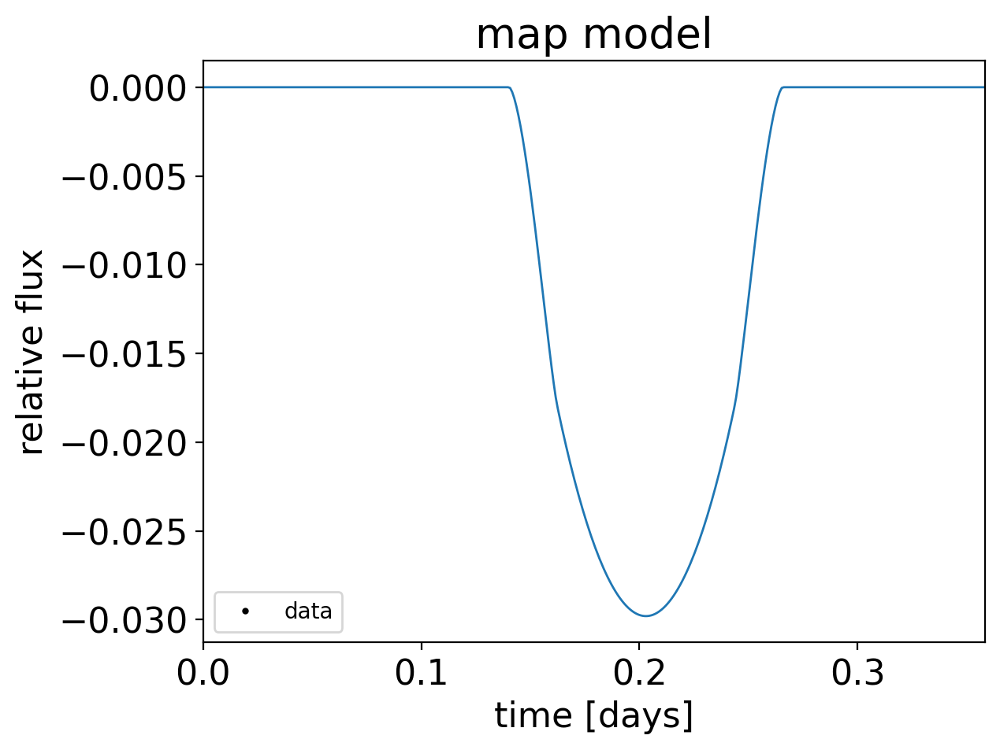

SamplingError: Initial evaluation of model at starting point failed!
Starting values:
{'mean': array(0.0002917), 'u_quadlimbdark__': array([0.03758367, 4.2895246 ]), 'r_interval__': array(-0.87331838), 'obs_missing': array([ 2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.51505780e-04,  1.81157717e-05, -3.33601822e-04, -7.77808703e-04,
       -1.30192003e-03, -1.89754458e-03, -2.55812583e-03, -3.27800081e-03,
       -4.05193709e-03, -4.87487029e-03, -5.74173674e-03, -6.64735367e-03,
       -7.58632240e-03, -8.55293883e-03, -9.54109966e-03, -1.05441918e-02,
       -1.15549489e-02, -1.25652476e-02, -1.35657952e-02, -1.45456030e-02,
       -1.54909863e-02, -1.63832963e-02, -1.71916615e-02, -1.78258816e-02,
       -1.83732625e-02, -1.89066909e-02, -1.94264664e-02, -1.99327576e-02,
       -2.04256774e-02, -2.09053079e-02, -2.13717114e-02, -2.18249372e-02,
       -2.22650252e-02, -2.26920080e-02, -2.31059130e-02, -2.35067632e-02,
       -2.38945781e-02, -2.42693747e-02, -2.46311675e-02, -2.49799691e-02,
       -2.53157906e-02, -2.56386416e-02, -2.59485306e-02, -2.62454651e-02,
       -2.65294518e-02, -2.68004964e-02, -2.70586043e-02, -2.73037801e-02,
       -2.75360278e-02, -2.77553511e-02, -2.79617533e-02, -2.81552372e-02,
       -2.83358055e-02, -2.85034604e-02, -2.86582040e-02, -2.88000380e-02,
       -2.89289641e-02, -2.90449835e-02, -2.91480975e-02, -2.92383071e-02,
       -2.93156133e-02, -2.93800167e-02, -2.94315179e-02, -2.94701174e-02,
       -2.94958157e-02, -2.95086128e-02, -2.95085089e-02, -2.94955041e-02,
       -2.94695981e-02, -2.94307908e-02, -2.93790818e-02, -2.93144707e-02,
       -2.92369568e-02, -2.91465394e-02, -2.90432176e-02, -2.89269903e-02,
       -2.87978565e-02, -2.86558146e-02, -2.85008631e-02, -2.83330003e-02,
       -2.81522241e-02, -2.79585321e-02, -2.77519219e-02, -2.75323905e-02,
       -2.72999347e-02, -2.70545507e-02, -2.67962346e-02, -2.65249815e-02,
       -2.62407864e-02, -2.59436434e-02, -2.56335457e-02, -2.53104860e-02,
       -2.49744556e-02, -2.46254449e-02, -2.42634428e-02, -2.38884367e-02,
       -2.35004120e-02, -2.30993518e-02, -2.26852364e-02, -2.22580428e-02,
       -2.18177435e-02, -2.13643058e-02, -2.08976898e-02, -2.04178459e-02,
       -1.99247115e-02, -1.94182041e-02, -1.88982103e-02, -1.83645602e-02,
       -1.78169505e-02, -1.71795963e-02, -1.63694815e-02, -1.54761243e-02,
       -1.45300573e-02, -1.35498164e-02, -1.25490301e-02, -1.15386541e-02,
       -1.05279588e-02, -9.52505148e-03, -8.53718671e-03, -7.57096832e-03,
       -6.63249238e-03, -5.72745734e-03, -4.86125771e-03, -4.03907352e-03,
       -3.26596742e-03, -2.54700501e-03, -1.88742321e-03, -1.29289494e-03,
       -7.69996874e-04, -3.27162774e-04,  2.29165410e-05,  2.53968332e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04,  2.91700000e-04,  2.91700000e-04,
        2.91700000e-04,  2.91700000e-04]), 'period': array(4.055259), 'u': array([ 1.4081305, -0.6944115]), 'r': array(0.1543365), 'light_curves': array([[ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [-4.01942203e-05],
       [-2.73584228e-04],
       [-6.25301822e-04],
       [-1.06950870e-03],
       [-1.59362003e-03],
       [-2.18924458e-03],
       [-2.84982583e-03],
       [-3.56970081e-03],
       [-4.34363709e-03],
       [-5.16657029e-03],
       [-6.03343674e-03],
       [-6.93905367e-03],
       [-7.87802240e-03],
       [-8.84463883e-03],
       [-9.83279966e-03],
       [-1.08358918e-02],
       [-1.18466489e-02],
       [-1.28569476e-02],
       [-1.38574952e-02],
       [-1.48373030e-02],
       [-1.57826863e-02],
       [-1.66749963e-02],
       [-1.74833615e-02],
       [-1.81175816e-02],
       [-1.86649625e-02],
       [-1.91983909e-02],
       [-1.97181664e-02],
       [-2.02244576e-02],
       [-2.07173774e-02],
       [-2.11970079e-02],
       [-2.16634114e-02],
       [-2.21166372e-02],
       [-2.25567252e-02],
       [-2.29837080e-02],
       [-2.33976130e-02],
       [-2.37984632e-02],
       [-2.41862781e-02],
       [-2.45610747e-02],
       [-2.49228675e-02],
       [-2.52716691e-02],
       [-2.56074906e-02],
       [-2.59303416e-02],
       [-2.62402306e-02],
       [-2.65371651e-02],
       [-2.68211518e-02],
       [-2.70921964e-02],
       [-2.73503043e-02],
       [-2.75954801e-02],
       [-2.78277278e-02],
       [-2.80470511e-02],
       [-2.82534533e-02],
       [-2.84469372e-02],
       [-2.86275055e-02],
       [-2.87951604e-02],
       [-2.89499040e-02],
       [-2.90917380e-02],
       [-2.92206641e-02],
       [-2.93366835e-02],
       [-2.94397975e-02],
       [-2.95300071e-02],
       [-2.96073133e-02],
       [-2.96717167e-02],
       [-2.97232179e-02],
       [-2.97618174e-02],
       [-2.97875157e-02],
       [-2.98003128e-02],
       [-2.98002089e-02],
       [-2.97872041e-02],
       [-2.97612981e-02],
       [-2.97224908e-02],
       [-2.96707818e-02],
       [-2.96061707e-02],
       [-2.95286568e-02],
       [-2.94382394e-02],
       [-2.93349176e-02],
       [-2.92186903e-02],
       [-2.90895565e-02],
       [-2.89475146e-02],
       [-2.87925631e-02],
       [-2.86247003e-02],
       [-2.84439241e-02],
       [-2.82502321e-02],
       [-2.80436219e-02],
       [-2.78240905e-02],
       [-2.75916347e-02],
       [-2.73462507e-02],
       [-2.70879346e-02],
       [-2.68166815e-02],
       [-2.65324864e-02],
       [-2.62353434e-02],
       [-2.59252457e-02],
       [-2.56021860e-02],
       [-2.52661556e-02],
       [-2.49171449e-02],
       [-2.45551428e-02],
       [-2.41801367e-02],
       [-2.37921120e-02],
       [-2.33910518e-02],
       [-2.29769364e-02],
       [-2.25497428e-02],
       [-2.21094435e-02],
       [-2.16560058e-02],
       [-2.11893898e-02],
       [-2.07095459e-02],
       [-2.02164115e-02],
       [-1.97099041e-02],
       [-1.91899103e-02],
       [-1.86562602e-02],
       [-1.81086505e-02],
       [-1.74712963e-02],
       [-1.66611815e-02],
       [-1.57678243e-02],
       [-1.48217573e-02],
       [-1.38415164e-02],
       [-1.28407301e-02],
       [-1.18303541e-02],
       [-1.08196588e-02],
       [-9.81675148e-03],
       [-8.82888671e-03],
       [-7.86266832e-03],
       [-6.92419238e-03],
       [-6.01915734e-03],
       [-5.15295771e-03],
       [-4.33077352e-03],
       [-3.55766742e-03],
       [-2.83870501e-03],
       [-2.17912321e-03],
       [-1.58459494e-03],
       [-1.06169687e-03],
       [-6.18862774e-04],
       [-2.68783459e-04],
       [-3.77316680e-05],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00]])}

Initial evaluation results:
mean                 1.38
u_quadlimbdark__    -5.70
r_interval__        -1.57
obs_missing          0.00
t0                  -0.92
logP                10.70
b                    0.00
obs                  -inf
Name: Log-probability of test_point, dtype: float64

In [348]:
init_mean = mcmcresults['mean']
init_t0=mcmcresults['t0']
init_period = mcmcresults['period']
init_b=mcmcresults['b']
init_r=mcmcresults['r']
init_u = [mcmcresults['u[0]'],mcmcresults['u[1]']]
fixed_var = ['t0','period','b']
trans_spec = {'wavelength':[],'r':[],'r_err':[],'u0':[],'u1':[],'u0_err':[],'u1_err':[],'mean':[],'mean_err':[],'t0':[],'period':[],'b':[]}

for rf,re,rw in zip(rbflux,rbfluxe,rbwavel):
    print(rw)
    x = np.array(rtime - min(rtime))
    y = np.array(rf) 
    y = y/np.nanmedian(y[-50:])
    y = y-np.nanmedian(y[-50:])
    yerr = np.array(re)
    
    map_soln, model,[period,r,t0,b,u,mean] = fit_transit(x,y,yerr,init_r,init_t0, init_period,init_b,init_mean,init_u, fixed_var)
    plot_fit(x,y,yerr,map_soln)
    trace = sample(map_soln, model)
    summary = summarise(model,trace,fixed_var)
    print(summary,type(summary))
    trans_spec['wavelength'].append(rw.to_value())
    trans_spec['r'].append(summary['mean']['r'])
    trans_spec['u0'].append(summary['mean']['u[0]'])
    trans_spec['u1'].append(summary['mean']['u[1]'])
    trans_spec['mean'].append(summary['mean']['mean'])
    trans_spec['t0'].append(init_t0)
    trans_spec['b'].append(init_b)
    trans_spec['period'].append(init_period)
    trans_spec['r_err'].append(summary['sd'][0])
    trans_spec['u0_err'].append(summary['sd'][1])
    trans_spec['u1_err'].append(summary['sd'][2])
    trans_spec['mean_err'].append(summary['sd'][3])
    print("r=",summary['mean']['r'],", mean=",summary['mean']['mean'],", u=",summary['mean']['u[0]'],summary['mean']['u[1]'])
    
    print(trans_spec)
    pd_ts = pd.DataFrame(trans_spec)
    pd_ts.to_csv("transmission_spectrum.csv",index=False)
    

### Import transmission spectrum (if it exists)

In [ ]:
# import transmission spectrum
trans_spect = pd.read_csv("transmission_spectrum_old.csv")
trans_spect

(2.0, 2.5)

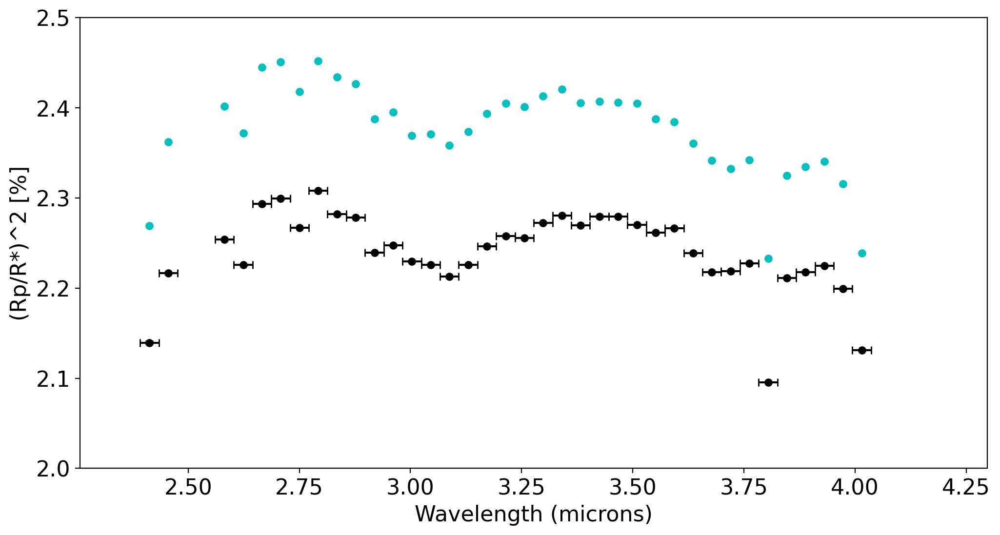

In [350]:
from astropy import units as u
plt.figure(figsize=(12,6))
plt.plot(trans_spect['wavelength'].values*u.Unit("um"),100*np.power(trans_spect['r'],2),'k.',markersize=10)
plt.plot(trans_spec['wavelength']*u.Unit("um"),100*np.power(trans_spec['r'],2),'c.',markersize=10)
plt.errorbar(trans_spect['wavelength'].values*u.Unit("um"),100*np.power(trans_spect['r'],2),xerr=np.mean(halfbinwidths),yerr=100*np.power(trans_spect['r'],2)*2*np.divide(trans_spect['r_err'],trans_spect['r']),capsize=3,c='k',linestyle="None")
plt.ylabel("(Rp/R*)^2 [%]")
plt.xlabel("Wavelength (microns)")
# plt.ylim(0.148,0.153)
plt.ylim(2,2.5)
# plt.xlim(2.4,4)